# Code used for generating figures
All figures apart from pathway illustrations and plots based on previously published data can be generated with the code below.

We reuse functions defined in the document "IterativeConstruction_SharedFunctions.ipynb" here and in other files. The respective functions are defined and explained in the shared notebook

We use data generated by executing "IterativeConstruction_NutrientRichEnsemble.ipynb" here. Please execute the respective code before generating figures here.

Note that the data resource allocation data is generated from stochastically parameterizations, and among these, representative examples are randomly chosen (at times with suitable constraints to display the whole chain in the fixed field of view of individual panels). For this reason, representative illustrations will look different from the figures displayed in the manuscript, but should still exhibit the key features of the printed figures.

Also note, that this code is not commented in detail, as it does not contain key calculations. Instead, the relevant calculations are performed in the other two code filed.

In [1]:
# Specify the folder in which files are saved here
data_folder = "/Users/leonseeger/Desktop/GithubCode/" #"/Users/leonseeger/Desktop/largeDBFiles/"

In [3]:
# The notebook which holds the shared functions first needs to be converted to an .py file to be imported
!jupyter nbconvert IterativeConstruction_SharedFunctions.ipynb --to python

#Import of required packages and the shared functions
from IterativeConstruction_SharedFunctions import *;

import numpy as np
import pandas as pd
import scipy as scp
import random
from scipy.optimize import curve_fit
from scipy.optimize import minimize
from scipy.stats import linregress
from scipy.signal import savgol_filter
from scipy.interpolate import UnivariateSpline
from scipy.interpolate import CubicSpline
from itertools import permutations

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import matplotlib.colors
from matplotlib.colors import ListedColormap
from  matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import string
import warnings

from matplotlib import cm
from matplotlib.ticker import LinearLocator

warnings.filterwarnings("ignore")

font = {'size'   : 30} #20
plt.rcParams.update({'axes.titlesize': 'medium'})
plt.rc('font', **font)

#defining colormaps
cmaprbg=LinearSegmentedColormap.from_list('rg',["r", "k", "g"], N=256)
cm = plt.cm.get_cmap('Spectral_r')

N = 256
vals = np.ones((N, 4)) #default alpha = 1
xs = np.linspace(0, 1, N)
vals[:, 0] = np.zeros(N)  #red
vals[:, 1] = 1-xs  #green
vals[:, 2] = 1-xs/3  #blue

Qcm = ListedColormap(vals[::-1])
cmQ = Qcm

N = 4096*2
vmin = 0
vmax = 4#3
vals = cm((np.log10(1/(1/xs-1))-vmin)/(vmax-vmin))#cm(xs**3)
cm3 = ListedColormap(vals)

[NbConvertApp] Converting notebook IterativeConstruction_SharedFunctions.ipynb to python
[NbConvertApp] Writing 16834 bytes to IterativeConstruction_SharedFunctions.py


In [4]:
### data import and reshaping into an array of structure

filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation_reducedVariance.npy"
Nenzymes = 20
fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset_reducedVariance.npy")
print("Initial data structure: ", np.shape(fullensemble), np.shape(parameters))


parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]


meancolors = ["k", "dimgrey"]

KMmean = np.exp(np.mean(np.log(fullensemble[:, 0, 1, :])))

efficiencybins = np.logspace(-2.2 , 2.2, 12)#np.logspace(-1, 1, 6)
efficiencybins2 = np.copy(efficiencybins)
ilocs = []
ensemble = []

for j in range(np.shape(fullensemble)[0]):
    maxgr = fullensemble[j, 0, 5, 0]
    halfgrs = (fullensemble[j, :, 4, 0]/fullensemble[j, :, 1, 0]/(fullensemble[j, :, 3, 0]/fullensemble[j, :, 1, 0])/(1+fullensemble[j, :, 3, 0]/fullensemble[j, :, 1, 0]).T-40).T
    #halfgrs = (fullensemble[j, :, 5, 0].T-maxgr/2).T
    halfgrs[halfgrs<=0] = np.max(halfgrs)
    tenthgrs = (fullensemble[j, :, 5, 0].T-maxgr/10.1).T
    tenthgrs[tenthgrs<=0] = np.max(tenthgrs)
    
    #iloc = np.where(np.abs(fullensemble[j, :, 5, 0]-maxgr/2)==np.min(np.abs(fullensemble[j, :, 5, 0]-maxgr/2)))
    iloc = np.where(halfgrs == np.nanmin(halfgrs))
    iloc10 = np.where(tenthgrs == np.nanmin(tenthgrs))
    ilocs.append(iloc[0][0])
    ensemble.append(np.array([fullensemble[j, 0], fullensemble[j, iloc[0][0]], fullensemble[j, iloc10[0][0]]]))

ilocs = np.array(ilocs)
ensemble = np.array(ensemble)[:, :, :, None, :]

print("final data structure: ", np.shape(ensemble))

print("Ensemble structure: (parameterization, growth limitation, state variable, branch, enzyme position)")
print("")
print("There are 5000 parameterizations")
print("... a variable number of degrees of growth limitation, here 3")
print("... six state variables in index-order kappamax, Km, b {legacy parameter, always 1}, rhos, phis, js")
print("... up to three branches, here 1")
print("... of 10 or 20 enzymes each, here 20.")

Initial data structure:  (5000, 1000, 3, 20) (5000, 42)
final data structure:  (5000, 3, 6, 1, 20)
Ensemble structure: (parameterization, growth limitation, state variable, branch, enzyme position)

There are 5000 parameterizations
... a variable number of degrees of growth limitation, here 3
... six state variables in index-order kappamax, Km, b {legacy parameter, always 1}, rhos, phis, js
... up to three branches, here 1
... of 10 or 20 enzymes each, here 20.


In [21]:
### Statistics

#linear fits to all metabolic proteins:
dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 

data = dataset[["C2", "C3", "C4", "C5", "C6", "C7", "C8", "D6", "D7", "D8", "F4", "F5", "F6", "F7", "F8"]].to_numpy()
grs = np.array([0.91, 0.77, 0.69, 0.56, 0.48, 0.35, 0.72, 0.56, 0.33, 0.49, 0.81, 0.71, 0.55, 0.5, 0.34])
meangr = np.mean(grs)

names = dataset[["Gene name"]].to_numpy()
UniIDs = dataset[["Protein ID"]].to_numpy()
means = np.mean(data, 1)
means[np.any(data == 0, axis = 1)] = np.nan
slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
offsets = means-slopes*meangr
r2s = np.sum((data.T-means).T*(grs-meangr), 1)/np.sqrt(np.sum((grs-meangr)**2)*np.sum((data.T-means).T**2, 1))
squares = np.sum((data - ((np.array([slopes]*len(grs)).T*grs).T+offsets).T)**2, 1)/means**2

maskA = []
index = 0
for UniID in UniIDs:
    if UniID not in metabolicunis:
        maskA.append(index)
    index += 1

offsetsA = np.copy(offsets)
offsetsA[maskA] = np.nan
allvalidIDs = UniIDs[~np.isnan(means)][:, 0]
nonvalidIDs = UniIDs[np.isnan(means)][:, 0]
allmetabolicoffsets = offsetsA[~np.isnan(offsetsA)]

sigma = 0.107 ###relative standard deviation between biological replicates

In [7]:
#create a database of all KEGG pathways and their corresponding uniprot ids in e coli metabolism
import requests

# Get KEGG gene IDs for all eco modules and pathways
link_genes_url = f"https://rest.kegg.jp/link/eco/md"
gene_response = requests.get(link_genes_url)
gene_lines = gene_response.text.strip().split("\n")

link_genes_url2 = f"https://rest.kegg.jp/link/eco/pathway"
gene_response2 = requests.get(link_genes_url2)
gene_lines2 = gene_response2.text.strip().split("\n")

# Extract gene IDs (e.g., hsa:3098)
path_ids = [line.split("\t")[0] for line in gene_lines]
gene_ids = [line.split("\t")[1] for line in gene_lines]
path_ids2 = [line.split("\t")[0] for line in gene_lines2]
gene_ids2 = [line.split("\t")[1] for line in gene_lines2]
path_ids = path_ids+path_ids2
gene_ids = gene_ids+gene_ids2


# Download and define a converter dictionary to get uniprot ids
converter_url = f"https://rest.kegg.jp/conv/uniprot/eco"
conv_response = requests.get(converter_url)
conv_lines = conv_response.text.strip().split("\n")
kegg_ids = [line.split("\t")[0] for line in conv_lines]
uni_ids = [line.split("\tup:")[1] for line in conv_lines]
converter = dict(zip(kegg_ids, uni_ids))

# Get all ecoli modules and pathways and parse response into a dictionary
response = requests.get("https://rest.kegg.jp/list/module")
response2 = requests.get("https://rest.kegg.jp/list/pathway/eco")

pathway_names = {}
if response.status_code == 200:
    lines = response.text.strip().split("\n")
    #print(lines)
    for line in lines:
        kegg_id, name = line.split("\t")
        #print(name)
        #pathway_names[kegg_id] = name
        pathway_names["eco_%s"%kegg_id] = name

if response2.status_code == 200:
    lines = response2.text.strip().split("\n")
    #print(lines)
    for line in lines:
        kegg_id, name = line.split("\t")
        #print(name)
        pathway_names[kegg_id] = name

#convert all genes belonging to a pathway to uniprot ids
pathdb = []
nondescript = []
for path_id in sorted(list(set(path_ids))):
    if path_id[:2] == "md" or path_id == "path:eco03010":
        pathgenes = np.array(gene_ids)[np.array(path_ids) == path_id]
        pathunis = []
        for gene in pathgenes:
            try:
                pathunis.append(converter[gene])
            except: nondescript.append(gene)
        pathdb.append([path_id, pathunis])
#print(set(nondescript))
print(len(pathdb))

#find all metabolic proteins

pathgenes = np.array(gene_ids)[np.array(path_ids) == "path:eco01100"]
metabolicunis = []
nondescript = []
for gene in pathgenes:
    try:
        metabolicunis.append(converter[gene])
    except: nondescript.append(gene)
print(len(set(metabolicunis)), set(nondescript))


217
931 set()


PRPP biosynthesis, ribose 5P => PRPP 1
Pentose phosphate pathway, oxidative phase, glucose 6P => ribulose 5P 3
Entner-Doudoroff pathway, glucose-6P => glyceraldehyde-3P + pyruvate 4
Citrate cycle, first carbon oxidation, oxaloacetate => 2-oxoglutarate 4
Glucuronate pathway (uronate pathway) 0
Proline biosynthesis, glutamate => proline 3
Serine biosynthesis, glycerate-3P => serine 3
Cysteine biosynthesis, serine => cysteine 2
Phenylalanine biosynthesis, chorismate => phenylpyruvate => phenylalanine 3
Tyrosine biosynthesis, chorismate => HPP => tyrosine 3
GABA (gamma-Aminobutyrate) shunt 2
Urea cycle 4
Lysine degradation, lysine => saccharopine => acetoacetyl-CoA 2
Ectoine biosynthesis, aspartate => ectoine 2
Methionine degradation 2
Leucine degradation, leucine => acetoacetate + acetyl-CoA 2
Tyrosine biosynthesis, chorismate => arogenate => tyrosine 2
Tyrosine degradation, tyrosine => homogentisate 1
Pyrimidine degradation, uracil => beta-alanine, thymine => 3-aminoisobutanoate 0
Adenin

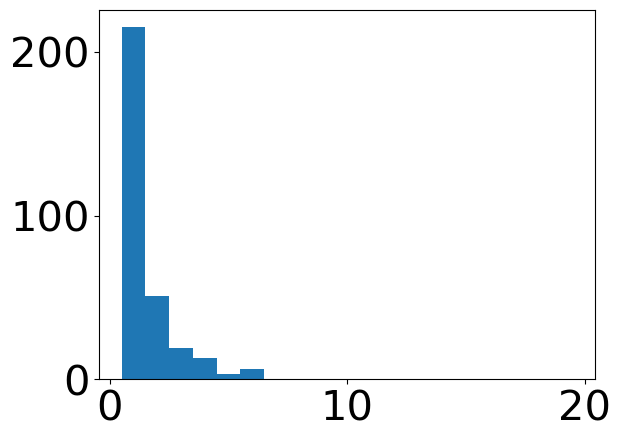

In [13]:
gooddb = []
lens = []
for x in pathdb:
    if (len(set(UniIDs[:, 0][~np.isnan(means)]).intersection(x[1]))>4 and int(x[0][-4])<1) or x[0]=="path:eco03010":
        if len(set(UniIDs[:, 0][~np.isnan(means)]).intersection(x[1]))<901:
            gooddb.append([x[0], list(set(UniIDs[:, 0][~np.isnan(means)]).intersection(x[1]))])
            lens.append(len(set(UniIDs[:, 0][~np.isnan(means)]).intersection(x[1])))
        else:
            name = pathway_names[x[0].split(":")[1]].split(" - ")[0]
            print(name, len(set(UniIDs[:, 0][~np.isnan(means)]).intersection(x[1])))
    else: 
        name = pathway_names[x[0].split(":")[1]].split(" - ")[0]
        print(name, len(set(UniIDs[:, 0][~np.isnan(means)]).intersection(x[1])))

allunis = []
for i in range(len(gooddb)):
    path, unis = gooddb[i]
    allunis += unis

uniqueunis = list(set(allunis))
print(len(uniqueunis), len(set(UniIDs[:, 0][~np.isnan(means)]).intersection(allunis)))
allunis = np.array(allunis)
counts = []
for uniqueuni in uniqueunis:
    counts.append(np.sum(allunis == uniqueuni))
print(np.mean(counts))
plt.hist(counts, bins = np.arange(20)+0.5)

print(len(set(metabolicunis)), len(set(allunis)), len(set(allunis).intersection(metabolicunis))) ### contains additionally 56 ribosomal proteins
print(len(pathdb))

In [17]:
print(len(gooddb))
finaldb = []
overlap = np.zeros((len(gooddb), len(gooddb)))
for i in range(len(gooddb)):
    for j in range(len(gooddb)):
        if len(set(gooddb[i][1]).intersection(set(gooddb[j][1])))/len(set(gooddb[i][1]))>0.5:
            if i!=j:
                overlap[i, j] = len(set(gooddb[i][1]).intersection(set(gooddb[j][1])))/len(set(gooddb[i][1]))

for i in range(len(gooddb)):
    for j in range(len(gooddb)):
        if overlap[i, j]>overlap[j, i]:
            overlap[j, i] = 0
        else:
            overlap[i, j] = 0

#plt.pcolormesh(overlap)
remove = np.sum(overlap, axis = 1)
removals = []

for i in range(len(gooddb)):
    if remove[i]>0:
        name = pathway_names[gooddb[i][0].split(":")[1]].split(" - ")[0]#.split(", ")[0]
        if len(set(np.where(overlap[i, :]>0)[0])-set(removals))>0:
            print("removed:", name, len(gooddb[i][1]))
            removals.append(i)
            for j in np.where(overlap[i, :]>0)[0]:
                name = pathway_names[gooddb[j][0].split(":")[1]].split(" - ")[0]#.split(", ")[0]
                print("in: ", gooddb[j][0], name, len(gooddb[j][1]))
                #gooddb[j][1] = list(set(gooddb[j][1])+set(gooddb[i][1]))
        else:
            finaldb.append(gooddb[i])
    else:
        finaldb.append(gooddb[i])
        #print(np.where(overlap[:, i]>0))

print(len(finaldb))

gooddb = finaldb

35
35


In [19]:
print("Detected: ", len(set(UniIDs[:, 0])))
print("Valid: ", len(allvalidIDs))
print("All Metabolic: ", len(metabolicunis))
print("Valid Metabolic: ", len(set(metabolicunis).intersection(set(allvalidIDs))))
print("Invalid Metabolic: ", len(set(metabolicunis).intersection(set(nonvalidIDs))))
print(len(allmetabolicoffsets))
#len(set(metabolicunis)), len(UniIDs)-len(maskA), len(allvalidIDs), len(allmetabolicoffsets))
validmetabolic = set(metabolicunis).intersection(set(allvalidIDs))

Detected:  4222
Valid:  1647
All Metabolic:  931
Valid Metabolic:  549
Invalid Metabolic:  381
549


0.4663023679417122 0.4007285974499089 0.13296903460837886
100 449 549
17
532


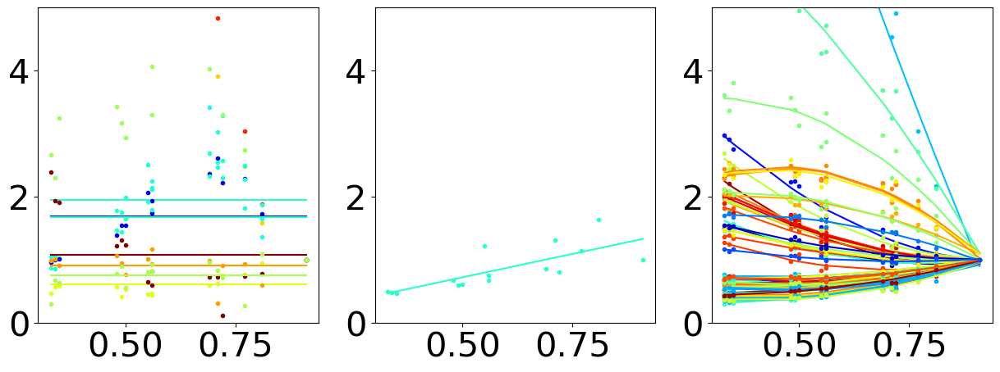

In [23]:
#Testing linearity against alternative hypotheses by bayesian model interference
cmjet = plt.cm.get_cmap('jet')

fig, axs = plt.subplots(1, 3, figsize = (15, 5))
SSQ_0s = []
SSQ_1s = []
SSQ_2s = []
n0, n1, n2 = 0, 0, 0
for i in range(len(UniIDs)):
    if UniIDs[i] in list(validmetabolic):
        model0 = np.poly1d(np.polyfit(grs, data[i], 0)) 
        SSQ_0 = np.sum((1-data[i]/model0(grs))**2)
        SSQ_0s.append(SSQ_0)
        model1 = np.poly1d(np.polyfit(grs, data[i], 1)) 
        SSQ_1 = np.sum((1-data[i]/model1(grs))**2)
        SSQ_1s.append(SSQ_1)
        model2 = np.poly1d(np.polyfit(grs, data[i], 2)) 
        SSQ_2 = np.sum((1-data[i]/model2(grs))**2)
        SSQ_2s.append(SSQ_2)
        color = cmjet(np.random.uniform())
        if min(np.log(SSQ_0), np.log(SSQ_1)+1, np.log(SSQ_2)+2)== np.log(SSQ_0):
            if SSQ_1>sigma**2*len(grs)*3:
                axs[0].plot(grs, data[i]/data[i, 0], ".", color= color)
                axs[0].plot(np.sort(grs), model0(np.sort(grs))/data[i, 0], "-", color= color)
            n0 +=1
        if min(np.log(SSQ_0), np.log(SSQ_1)+1, np.log(SSQ_2)+2)== np.log(SSQ_1)+1:
            if SSQ_1>sigma**2*len(grs)*3:
                axs[1].plot(grs, data[i]/data[i, 0], ".", color= color)
                axs[1].plot(np.sort(grs), model1(np.sort(grs))/data[i, 0], "-", color= color)
            n1 +=1
        if min(np.log(SSQ_0), np.log(SSQ_1)+1, np.log(SSQ_2)+2)== np.log(SSQ_2)+2:
            if SSQ_1<sigma**2*len(grs)*3:
                axs[2].plot(grs, data[i]/data[i, 0], ".", color= color)
                axs[2].plot(np.sort(grs), model2(np.sort(grs))/data[i, 0], "-", color= color)
            n2 +=1

axs[0].set_ylim(0, 5)
axs[1].set_ylim(0, 5)
axs[2].set_ylim(0, 5)

print(n0/(n0+n1+n2), n1/(n0+n1+n2), n2/(n0+n1+n2))
print(np.sum(np.log(SSQ_1s)-np.log(SSQ_2s)>1), np.sum(np.log(SSQ_1s)-np.log(SSQ_2s)<1), n0+n1+n2)

print(np.sum(np.log(SSQ_1s)-np.log(SSQ_2s)>2))
print(np.sum(np.log(SSQ_1s)-np.log(SSQ_2s)<2))

In [25]:
#Find the number of proteins explained by a linear model and the number of all admissible proteins
print(np.sum((np.array(SSQ_1s)<(len(grs)-2)*sigma**2*3)))
print(len(SSQ_1s))

516
549


In [29]:
#Match pathways and detected proteins
dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 

grsall = [0.91, 0.77, 0.69, 0.56, 0.48, 0.35, 0.72, 0.56, 0.33, 0.49, 0.81, 0.71, 0.55, 0.5, 0.34]
columnsall = ["C2", "C3", "C4", "C5", "C6", "C7", "C8", "D6", "D7", "D8", "F4", "F5", "F6", "F7", "F8"]

data = dataset[columnsall].to_numpy()
grs = np.array(grsall)
meangr = np.mean(grs)

names = dataset[["Gene name"]].to_numpy()
UniIDs = dataset[["Protein ID"]].to_numpy()
means = np.mean(data, 1)
#means[means == 0] = np.nan
means[np.any(data == 0, axis = 1)] = np.nan
slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
offsets = means-slopes*meangr
r2s = np.sum((data.T-means).T*(grs-meangr), 1)/np.sqrt(np.sum((grs-meangr)**2)*np.sum((data.T-means).T**2, 1))
squares = np.sum((data - ((np.array([slopes]*len(grs)).T*grs).T+offsets).T)**2, 1)/means**2

#ax = axs[0, 2]
#x = means[~np.isnan(offsets)]
#y = offsets[~np.isnan(offsets)]/means[~np.isnan(offsets)]
x = (data[:, 0])[~np.isnan(means)]
y = (data[:, -1]/data[:, 0])[~np.isnan(means)]
validdata = np.all(np.array([x>0, y>0]), 0)
y = np.log(y[validdata])
x = np.log(x[validdata])

x_data = np.copy(x)
y_data = np.copy(y)
#print(np.sum([y>1]/np.shape(y)[0]))

slope, intercept, r_value, p_value, std_err = linregress(x,y)
print(slope, p_value)

vars = []
for g in gooddb:
    path, unis = g 
    mask = []
    index = 0
    locals = ""
    for UniID in UniIDs:
        if UniID not in unis:
            mask.append(index)
        else:
            locals+=(UniID[0]+", ")
        index += 1
    
    
    meansC = np.copy(means)
    meansC[mask] = np.nan
    
    xs = data[~np.isnan(meansC)]
    localoffsets = offsets[~np.isnan(meansC)]
    localslopes = slopes[~np.isnan(meansC)]
    localnames = names[~np.isnan(meansC)]
    rich = (np.log((localoffsets+localslopes*grs[0]))+11)/12
    ys = (localoffsets)/(localoffsets+localslopes*grs[0])

    deviation = np.mean((((localoffsets[:, None]+localslopes[:, None]*grs[None, :])-xs)/(localoffsets[:, None]+localslopes[:, None]*grs[None, :]))**2, axis = 1)

    name = pathway_names[path.split(":")[1]].split(" - ")[0].split(", ")[0].split("(")[0]
    #print(np.array(unis)[np.array(deviation)>3*sigma**2])
    
    original_list = ys
    sorted_list = sorted(original_list)
    sorting_list = list(range(len(original_list)))
    sorting_list.sort(key=lambda x: original_list[x])
    sorting_list = sorting_list[::-1]

    outstring = name +"& "+path[-6:]+"& "
    for n in range(len(unis)):
        outstring = outstring+localnames[sorting_list[n]]#unis[sorting_list[n]]
        if deviation[sorting_list[n]]>3*sigma**2:
            outstring = outstring+"$^\star$"
        if (n != len(unis)-1):
            outstring = outstring+", "
            if ((n+1)%10 ==0):
                outstring = outstring+"\\\\ & & " 
            
    
    #print(name, "& ", path[-6:], "& ", *["%s,"%uni for uni in np.array(unis)[deviation<3*sigma**2]], *["%s$^\star$,"%uni for uni in np.array(unis)[deviation>3*sigma**2]], "\\\\")
    print((outstring + "\\\\")[0])

-0.12831751370295258 1.254022141712238e-42
Glycolysis & M00001& pykA, ytjC, glk, gpmA, pfkB, pfkA, pgk, tpiA, fbaA, gapA, \\ & & pgi, eno, gpmM, pykF, fbaB$^\star$\\
Pentose phosphate pathway & M00004& talA$^\star$, rpiB, pgl, rpe, rpiA, zwf, gnd, tktB, talB, tktA, \\ & & pgi\\
Citrate cycle & M00009& fumC$^\star$, frdB, frdA, acnA, fumB, fumA, acnB, sdhB, sdhD, sdhA, \\ & & sucD, sucC, icd, sdhC, sucB, gltA, sucA, mdh, lpd\\
Lysine biosynthesis& M00016& dapF, dapA, lysC, lysA, argD, dapE, metL, asd, dapB, thrA, \\ & & dapD\\
Methionine biosynthesis& M00017& malY, metA, metC, metH, metB, lysC, metL, asd, thrA, metE\\
Shikimate pathway& M00022& aroB, aroD, aroC, aroL, aroK, aroH, aroA, aroF$^\star$, aroG\\
Tryptophan biosynthesis& M00023& trpA, trpB, trpC, trpD, trpE\\
Histidine biosynthesis& M00026& hisH, hisF, hisB, hisD, hisA, hisC, hisI, hisG\\
Ornithine biosynthesis& M00028& argD, argB, argA, argE, argC\\
Methionine salvage pathway& M00034& tyrB, mtn, speE, metK, speD\\
De novo pur

-0.12831751370295258 1.254022141712238e-42
P0A6D3
P07639
P12008
P05194
P00888
P0AB91
P00887
P0A6D7
P0A6E1
[0.29872291 0.16528275 0.23737004 0.14728115 0.33290865 0.37976523
 0.20177104 0.27182302 0.12151643]
2.2704749375804646e-05
0.0001958973163563153
0.000297185648589947
0.00013220445720384398
-1.1818190876568052e-05
-4.917466591324135e-05
1.5119230181420815e-05
0.00017398544244828302
6.706748821617819e-05


(0.0, 1.0)

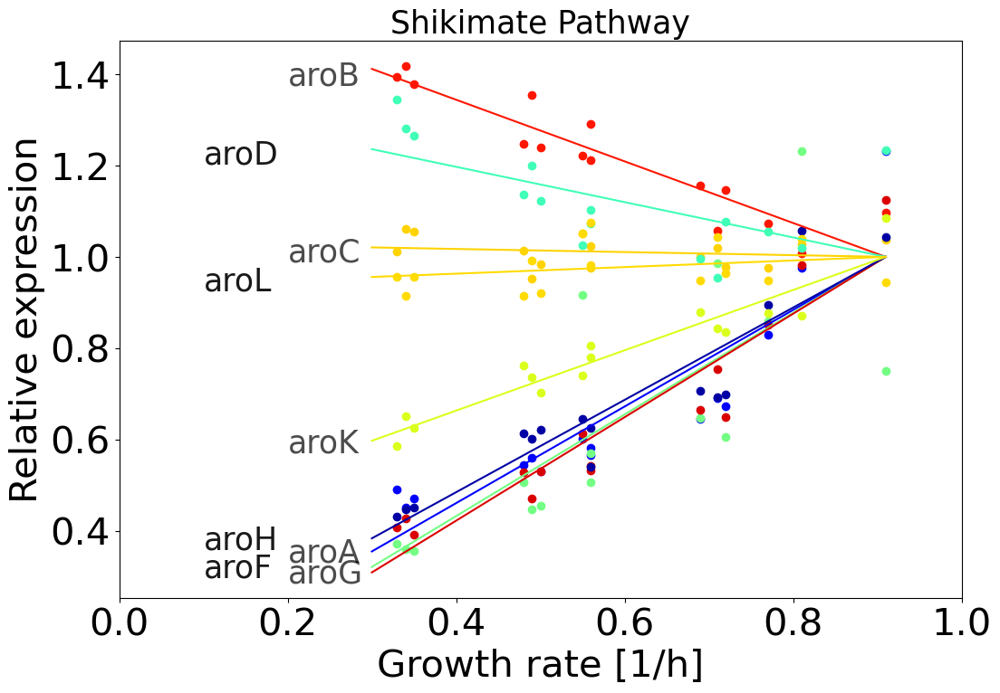

In [31]:
### New Figure 1

fig, axs = plt.subplots(1, 1, figsize = (12, 8))
font = {'size'   : 25} #20
plt.rc('font', **font)
from scipy.stats import rankdata

ax = axs

dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 

data = dataset[["C2", "C3", "C4", "C5", "C6", "C7", "C8", "D6", "D7", "D8", "F4", "F5", "F6", "F7", "F8"]].to_numpy()
grs = np.array([0.91, 0.77, 0.69, 0.56, 0.48, 0.35, 0.72, 0.56, 0.33, 0.49, 0.81, 0.71, 0.55, 0.5, 0.34])
meangr = np.mean(grs)

names = dataset[["Gene name"]].to_numpy()
UniIDs = dataset[["Protein ID"]].to_numpy()
means = np.mean(data, 1)
#means[means == 0] = np.nan
means[np.any(data == 0, axis = 1)] = np.nan
slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
offsets = means-slopes*meangr
r2s = np.sum((data.T-means).T*(grs-meangr), 1)/np.sqrt(np.sum((grs-meangr)**2)*np.sum((data.T-means).T**2, 1))
squares = np.sum((data - ((np.array([slopes]*len(grs)).T*grs).T+offsets).T)**2, 1)/means**2

#ax = axs[0, 2]
#x = means[~np.isnan(offsets)]
#y = offsets[~np.isnan(offsets)]/means[~np.isnan(offsets)]
x = (data[:, 0])[~np.isnan(offsets)]
y = (data[:, -1]/data[:, 0])[~np.isnan(offsets)]
validdata = np.all(np.array([x>0, y>0]), 0)
y = np.log(y[validdata])
x = np.log(x[validdata])

x_data = np.copy(x)
y_data = np.copy(y)

slope, intercept, r_value, p_value, std_err = linregress(x,y)
print(slope, p_value)

#ArginineIDs = []
#with open("pantherChorismateSynthesis.txt") as file:
#with open("pantherShortTHFSynthesis.txt") as file:
#with open("pantherTHFSynthesis.txt") as file:
#    for line in file:
#        ArginineIDs.append(line[39:45])
module = "md:eco_M00022"
index = [i for i in range(len(gooddb)) if gooddb[i][0]==module]
path, unis = gooddb[index[0]]
name = pathway_names[path.split(":")[1]].split(" - ")[0].split(", ")[0].split("(")[0]

FocalIDs = unis

maskA = []
index = 0
for UniID in UniIDs:
    if UniID not in FocalIDs:
        maskA.append(index)
    else:
        print(UniID[0])
    index += 1

offsetsA = np.copy(offsets)
offsetsA[maskA] = np.nan

x = (data[:, 0])[~np.isnan(offsetsA)]
y = (data[:, -1]/data[:, 0])[~np.isnan(offsetsA)]
validdata = np.all(np.array([x>0, y>0]), 0)
y = np.log(y[validdata])
x = np.log(x[validdata])

xs = np.linspace(np.nanmin(x)-0.3, np.nanmax(x)+0.3, 100)
slope, intercept, r_value, p_value, std_err = linregress(x,y)

xs = data[~np.isnan(offsetsA)]
localoffsets = offsets[~np.isnan(offsetsA)]
localslopes = slopes[~np.isnan(offsetsA)]
localnames = names[~np.isnan(offsetsA)]
rich = (np.log((localoffsets+localslopes*grs[0]))+11)/12
print(rich)
#print(xs)
#ys = (localoffsets+localslopes*0.2)
ys = (localoffsets+localslopes*0.2)/(localoffsets+localslopes*grs[0])
cmjet = plt.cm.get_cmap('jet')
for i in range(len(xs)):
    color = cmjet(np.random.uniform())
    #ax.scatter(grs, xs[i], color = color)
    #ax.plot(np.linspace(0.3, grs[0], 5), (localoffsets[i]+localslopes[i]*np.linspace(0.3, grs[0], 5)), color = color)
    #ax.text(0.1+0.1*(rankdata(ys)[i]%2), ys[i], localnames[i][0], alpha = 0.9-0.2*(rankdata(ys)[i]%2))
    ax.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color)
    ax.plot(np.linspace(0.3, grs[0], 5), (localoffsets[i]+localslopes[i]*np.linspace(0.3, grs[0], 5))/(localoffsets[i]+localslopes[i]*grs[0]), color = color)
    ax.text(0.1+0.1*(rankdata(ys)[i]%2), 1+(ys[i]-1)*0.85-0.03, localnames[i][0], alpha = 0.9-0.2*(rankdata(ys)[i]%2))
    print(localoffsets[i])

ax.set_xlabel("Growth rate [1/h]")
ax.set_ylabel("Relative expression")
ax.set_title("Shikimate Pathway")
#ax.set_ylim(0, 1.5)
ax.set_xlim(0, 1)
#plt.savefig("VariableExpressionChanges.png")

(5000, 19)
4562
0.36889372891435396 0.34881890024951745


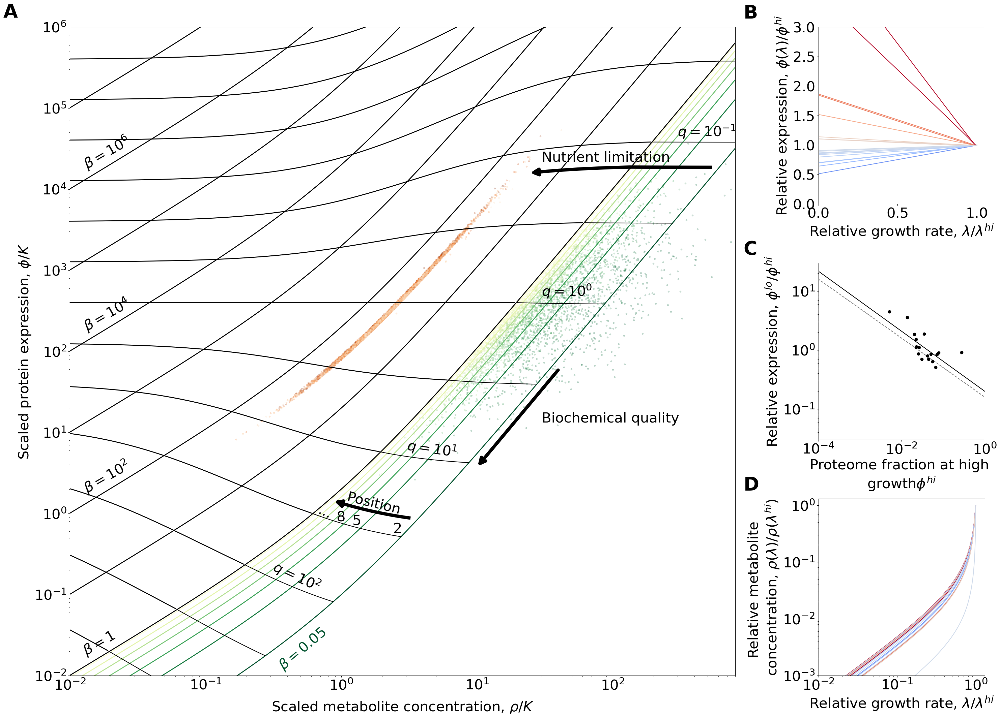

In [33]:
eps = 0.05

fig, axs = plt.subplots(2, 2, figsize = (35, 25))
font = {'size'   : 30} #20
plt.rc('font', **font)
cmplasma = plt.cm.get_cmap('plasma')
cmInferno = plt.cm.get_cmap('Oranges')
cmYlGn = plt.cm.get_cmap('YlGn_r')

for ax in axs.flatten():
    ax.axis("off")

gs = fig.add_gridspec(11, 11)
#gs = gridspec.GridSpec(13, 13)
gs.update(wspace=0, hspace=0)

axs[0, 0] = plt.subplot(gs[:, :8])
#ax1: protein, ax2: metabolites, ax3: correlations
ax1 = plt.subplot(gs[:3, 9:])
ax3 = plt.subplot(gs[4:7, 9:])
ax2 = plt.subplot(gs[8:, 9:])

ax0 = axs[0, 0]
Nenzymes = 20
for i in range(Nenzymes-1):
    for q in range(np.shape(ensemble)[0])[:200]: #display only a subset of points to ensure individual visibility
        ax0.set_xlim(1e-2, 8e2)
        ax0.scatter(ensemble[q, 0, 3, 0, i]/ensemble[q, 0, 1, 0, i], ensemble[q, 0, 4, 0, i]/ensemble[q, 0, 1, 0, i], marker = ".", color = cmYlGn((Nenzymes-i)/Nenzymes), alpha = 0.2)  
        ax0.scatter(ensemble[q, 1, 3, 0, i]/ensemble[q, 1, 1, 0, i], ensemble[q, 1, 4, 0, i]/ensemble[q, 1, 1, 0, i], marker = ".", color = cmInferno((Nenzymes-i)/Nenzymes), alpha = 0.2) 
        #ax0.scatter(ensemble[q, 1, 3, 0, i]/ensemble[q, 0, 1, 0, i], ensemble[q, 1, 4, 0, i]/ensemble[q, 0, 1, 0, i], marker = ".", color = cmInferno((Nenzymes-i)/Nenzymes), alpha = 0.2)
#ax0.scatter(ensemble[q, 0, 3, 0, 10:-1]/ensemble[q, 0, 1, 0, 10:-1], ensemble[q, 0, 4, 0, 10:-1]/ensemble[q, 0, 1, 0, 10:-1], marker = ".", color = cmplasma(15/20), alpha = 0.4, label = r"Catabolism, $i<\ell/2$")   
#ax0.scatter(ensemble[q, 0, 3, 0, :10]/ensemble[q, 0, 1, 0, :10], ensemble[q, 0, 4, 0, :10]/ensemble[q, 0, 1, 0, :10], marker = ".", color = cmplasma(5/20), alpha = 0.4, label = r"Anabolism, $i>\ell/2$")   

#lgnd = ax0.legend(handletextpad=-0.2, loc = "upper left")
#lgnd.legendHandles[0]._sizes = [100]
#lgnd.legendHandles[1]._sizes = [100]
ax0.set_xlim(1e-2, 8e2)
ax0.set_ylim(1e-2, 1e6)
ax0.set_ylabel(r"Scaled protein expression, $\phi/K$")
ax0.set_xlabel(r"Scaled metabolite concentration, $\rho/K$", labelpad = 15)
ax0.set_yscale("log")
ax0.set_xscale("log")
#ax0.plot(np.logspace(-2, 4, 100), np.logspace(-2, 4, 100)*(1+np.logspace(-2, 4, 100)), "k-", linewidth = 2)
#ax0.plot(np.logspace(-2, 4, 100), 0.1*np.logspace(-2, 4, 100)*(1+np.logspace(-2, 4, 100)), "--", color = cmplasma(5/20), linewidth = 2)

betas = ensemble[:, 0, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1]/(ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])/(1+ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])
print(np.shape(betas))

for i in [2, 5, 8, 11, 14, 17, 20]:
    axs[0, 0].plot(np.logspace(-2, 4, 100), (i-1)/20*np.logspace(-2, 4, 100)*(1+np.logspace(-2, 4, 100)), color = cmYlGn(((i-1))/Nenzymes), linewidth = 2)
   
for beta in np.logspace(0, 7, 8):
    axs[0, 0].plot(np.logspace(-2, 4, 100), beta*np.logspace(-2, 4, 100)*(1+np.logspace(-2, 4, 100)), color = "k", linewidth = 2)
    
allbetas = np.logspace(-np.log10(Nenzymes), 0, 100)
for rhorichOverKM in 1/eps*np.logspace(-3, 3, 13):
    rhoOverKM = rhorichOverKM*np.sqrt(1/allbetas)*np.sqrt(1-eps)
    axs[0, 0].plot(rhoOverKM, allbetas*rhoOverKM*(rhoOverKM+1), "k-")
    
alllambdas = np.logspace(-5, np.log10(1-eps), 1000)
for rhorichOverKM in 1/eps*np.logspace(-3, 3, 13):
    allbetas = ((1-alllambdas)/(np.sqrt(alllambdas)*eps))**2
    rhoOverKM = rhorichOverKM*np.sqrt(1/allbetas)*np.sqrt(alllambdas)
    axs[0, 0].plot(rhoOverKM, allbetas*rhoOverKM*(rhoOverKM+1), "k-", linewidth = 2)
    

allbetas = np.logspace(-np.log10(Nenzymes), 0, 100)
rhorichOverKM = 1/eps*4.2e-2
rhoOverKM = rhorichOverKM*np.sqrt(1/allbetas)*np.sqrt(1-eps)
axs[0, 0].plot(rhoOverKM[10:-15], (allbetas*rhoOverKM*(rhoOverKM+1))[10:-15], "k-", linewidth = 7)
axs[0, 0].annotate('', xy=(rhoOverKM[-5], (allbetas*rhoOverKM*(rhoOverKM+1))[-5]), xytext=(rhoOverKM[-15], (allbetas*rhoOverKM*(rhoOverKM+1))[-15]), arrowprops=dict(arrowstyle="-|>", color='k', linewidth = 7, linestyle = "-"))
axs[0, 0].text(1, 1, " Position", rotation = -14)


rhorichOverKM = 1/eps*7
rhoOverKM = rhorichOverKM*np.sqrt(1/allbetas)*np.sqrt(1-eps)
axs[0, 0].plot(rhoOverKM[10:], (allbetas*rhoOverKM*(rhoOverKM+1))[10:], "k-", linewidth = 7)

alllambdas = np.logspace(-.2, np.log10(1-eps), 100)
rhorichOverKM = 1/eps*7
allbetas = ((1-alllambdas)/(np.sqrt(alllambdas)*eps))**2
rhoOverKM = rhorichOverKM*np.sqrt(1/allbetas)*np.sqrt(alllambdas)
axs[0, 0].plot(rhoOverKM[60:], (allbetas*rhoOverKM*(rhoOverKM+1))[60:], "k-", linewidth = 7)
axs[0, 0].annotate('', xy=(rhoOverKM[50], (allbetas*rhoOverKM*(rhoOverKM+1))[50]), xytext=(rhoOverKM[60], (allbetas*rhoOverKM*(rhoOverKM+1))[60]), arrowprops=dict(arrowstyle="-|>", color='k', linewidth = 7, linestyle = "-"))
axs[0, 0].text(30, 2.2e4, r"Nutrient limitation")

axs[0, 0].annotate('', xy=(10, 15/4), xytext=(40, 60), arrowprops=dict(arrowstyle="->", color='k', linewidth = 7, linestyle = "-"))
axs[0, 0].text(90/3, 120/9, "Biochemical quality")

axs[0, 0].text(0.012, 0.018, r"$\beta = 1$", rotation = 30, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(0.012, 1.8, r"$\beta = 10^2$", rotation = 30, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(0.012, 180, r"$\beta = 10^4$", rotation = 30, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(0.012, 18000, r"$\beta = 10^6$", rotation = 30, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(0.33, 0.012, r"$\beta = 0.05$", rotation = 40, size = 30, color=cmYlGn(1/20))

#2, 5, 8, 11, 14, 17, 20
axs[0, 0].text(2.4, 0.58, r"$2$", rotation = 0, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(1.2, 0.73, r"$5$", rotation = 0, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(0.92, 0.81, r"$8$", rotation = 0, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(0.65, 0.86, r"...", rotation = -25, color = "k", size = 30)#color=cmplasma(18/20))

axs[0, 0].text(3e2, 4.5e4, r"$q = 10^{-1}$", rotation = 0, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(3e1, 4.8e2, r"$q = 10^0$", rotation = 0, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(3e0, 5, r"$q = 10^1$", rotation = -8, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(3e-1, 1.1e-1, r"$q = 10^2$", rotation = -25, color = "k", size = 30)

coolwarm = plt.cm.get_cmap('coolwarm')
corrcoeffs = np.mean((np.log(fullensemble[:, 0, 1, 1:])-np.mean(np.log(fullensemble[:, 0, 1, 1:]), axis = 1)[:, None])*(np.log(fullensemble[:, 0, 0, 1:])-np.mean(np.log(fullensemble[:, 0, 0, 1:]), axis = 1)[:, None]), axis = 1)/np.std(np.log(fullensemble[:, 0, 1, 1:]), axis = 1)/np.std(np.log(fullensemble[:, 0, 0, 1:]), axis = 1)
j = random.choice(np.where(np.abs(corrcoeffs)<0.1)[0])
print(j)
for q in np.arange(18)+1:
    fc = fullensemble[j, -1, 4, q]/fullensemble[j, 0, 4, q]
    color = coolwarm(np.log2(fc)/3+1/2)
    ax1.plot(fullensemble[j, :, 5, q]/fullensemble[j, 0, 5, q], fullensemble[j, :, 4, q]/fullensemble[j, 0, 4, q], color = color)
    ax2.plot(fullensemble[j, :, 5, q]/fullensemble[j, 0, 5, q], fullensemble[j, :, 3, q]/fullensemble[j, 0, 3, q], color = color)
    ax3.scatter(fullensemble[j, 0, 4, q], fullensemble[j, -1, 4, q]/fullensemble[j, 0, 4, q], color = "k")
    
    #ax3.scatter(np.sqrt(fullensemble[j, 0, 1, q]*fullensemble[j, 0, 0, q]), fullensemble[j, -1, 4, q]/fullensemble[j, 0, 4, q], color = "k")
    #ax3.scatter(fullensemble[j, 0, 4, q], 1/fullensemble[j, 0, 0, q], color = "k")

xs = np.linspace(-10, 4, 100)
slope, intercept, r_value, p_value, std_err = linregress(np.log(fullensemble[j, 0, 4, :-1]),np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))
ax3.plot(np.exp(xs), np.exp(slope*xs+intercept), "k-")

print(np.std(np.log10(fullensemble[j, 0, 0, :-1])), np.std(np.log10(fullensemble[j, 0, 1, :-1])))
correlated = set(np.where(corrcoeffs<-0.5)[0])
samemean = set(np.where(np.abs(np.nanmean(np.log(fullensemble[:, 0, 4, :-1]), axis = 1)-np.nanmean(np.log(fullensemble[j, 0, 4, :-1])))<0.1)[0])
samemeanfc = set(np.where(np.abs(np.nanmean(np.log(fullensemble[:, -1, 4, :-1]/fullensemble[:, 0, 4, :-1]), axis = 1)-np.nanmean(np.log(fullensemble[:, -1, 4, :-1]/fullensemble[j, 0, 4, :-1])))<0.1)[0])
good = (correlated & samemean & samemeanfc)
j = random.choice(list(good))
#ax3.scatter(fullensemble[j, 0, 4, :-1], fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1], color = "g")
#slope, intercept, r_value, p_value, std_err = linregress(np.log(fullensemble[j, 0, 4, :-1]),np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))
ax3.plot(np.exp(xs+np.nanmean(np.log(fullensemble[j, 0, 4, :-1]))), np.exp(-1/2*xs+np.nanmean(np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))), color = "k", linestyle = "--", alpha = 0.5)
#ax3.plot(np.exp(xs), np.exp(slope*xs+intercept), "g-")

ax1.set_xlim(0, 1.05)
ax1.set_ylim(0, 3)
ax1.set_xlabel("Relative growth rate, "+r"$\lambda/\lambda^{hi}$")
ax1.set_ylabel("Relative expression, "+r"$\phi(\lambda)/\phi^{hi}$")
ax2.set_xlim(1e-2, 1.3)
ax2.set_ylim(1e-3, 1.3)
ax2.set_xscale("log")
ax2.set_yscale("log")
ax3.set_xlim(1e-4, 1)
ax3.set_ylim(3e-2, 3e1)
ax3.set_xscale("log")
ax3.set_yscale("log")
ax3.set_xlabel("Proteome fraction at high \ngrowth"+r"$\phi^{hi}$")
ax3.set_ylabel("Relative expression, "+r"$\phi^{lo}/\phi^{hi}$")
ax2.set_xlabel("Relative growth rate, "+r"$\lambda/\lambda^{hi}$")
ax2.set_ylabel("Relative metabolite \nconcentration, "+r"$\rho(\lambda)/\rho(\lambda^{hi})$")
axs[0, 0].text(-0.1, 1.015, string.ascii_uppercase[0], transform=axs[0, 0].transAxes, weight='bold', size = 40)
ax1.text(-0.45, 1.05, string.ascii_uppercase[1], transform=ax1.transAxes, weight='bold', size = 40)
ax3.text(-0.45, 1.05, string.ascii_uppercase[2], transform=ax3.transAxes, weight='bold', size = 40)
ax2.text(-0.45, 1.05, string.ascii_uppercase[3], transform=ax2.transAxes, weight='bold', size = 40)

plt.savefig("MainTextMaster_panels.pdf", bbox_inches="tight", format = 'pdf')

In [35]:
Nenzymes = 20
filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

print(np.shape(fullensemble))

(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)


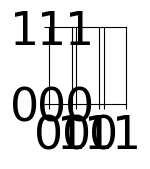

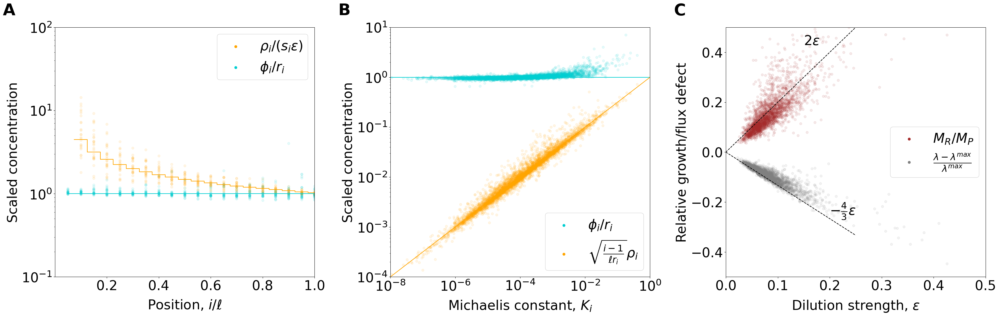

In [36]:
epsilons = np.sum(np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]), axis = 1)/np.sqrt(np.sum(1/fullensemble[:, 0, 0, :], axis = 1))
lammax = 1/np.sum(1/fullensemble[:, 0, 0, :], axis = 1)

font = {'size'   : 33} #20
plt.rc('font', **font)

fig, axs = plt.subplots(1, 3, figsize = (1, 1))
fig = plt.figure(figsize = (35, 11))
gs = gridspec.GridSpec(1, 3)
#gs.update(wspace=0.2, hspace=0.2)

axs[0] = plt.subplot(gs[0, 0])
axs[1] = plt.subplot(gs[0, 1])
#ax00 = axs[0].twinx()
#ax01 = axs[1].twinx()
axs[2] = plt.subplot(gs[0, 2])

positions = np.arange(20)[::-1]+1
newaxis = np.zeros(np.shape(fullensemble)[0])
pos, axis = np.meshgrid(positions, newaxis)
si = ((np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]).T)/np.sum(np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]), axis = 1)).T
ri = (1/fullensemble[:, 0, 0, :].T/np.sum(1/fullensemble[:, 0, 0, :], axis = 1)).T
qi = (np.sqrt(fullensemble[:, 0, 0, :]*fullensemble[:, 0, 1, :]).T/(epsilons*np.sqrt(lammax))).T
#betai = fullensemble[:, 0, 4, :]/fullensemble[:, 0, 3, :]/(1+fullensemble[:, 0, 3, :]/fullensemble[:, 0, 1, :])
betai = np.arange(Nenzymes)[::-1]/Nenzymes
scaledrhos = ((fullensemble[:, 0, 3, :]/si).T/epsilons).T
scaledphis = fullensemble[:, 0, 4, :]/ri


axs[0].scatter(pos[::200, :]/Nenzymes, scaledrhos[::200], alpha = 0.1, color = "orange", label = r"$\rho_i/(s_i \epsilon)$")
axs[0].step(positions/Nenzymes, np.sqrt(Nenzymes/(positions-1)), color = "orange", where = "mid")
axs[0].scatter(pos[::200, :]/Nenzymes, scaledphis[::200], alpha = 0.1, color = "darkturquoise", label = r"$\phi_i/r_i$")
axs[0].step(positions/Nenzymes, 1+0*positions, color = "darkturquoise", where = "mid")
axs[0].set_xlim(0, 1)
axs[0].set_yscale("log")
axs[0].set_xlabel("Position, $i/\ell$", labelpad=15)
axs[0].set_ylabel("Scaled concentration")
axs[0].set_xticks([0.2, 0.4, 0.6, 0.8, 1])
axs[0].set_ylim(1e-1, 1e2)
axs[0].set_yticks([1e-1, 1e0, 1e1, 1e2])
leg = axs[0].legend(loc = "upper right")
for lh in leg.legendHandles: 
    lh.set_alpha(1)

    
axs[1].scatter(fullensemble[::20, 0, 1, :], fullensemble[::20, 0, 4, :]/ri[::20], alpha = 0.1, color = "darkturquoise", label = r"$\phi_i/r_i$")
axs[1].plot(np.logspace(-10, 0, 10), np.logspace(-10, 0, 10)**0, color = "darkturquoise")
    
#axs[0, 1].scatter((epsilons*qi.T).T, np.sqrt(betai)*fullensemble[:, 0, 3, :]/fullensemble[:, 0, 1, :], alpha = 0.01, color = "orange")
#axs[1].scatter((epsilons*si.T).T, np.sqrt(betai)*fullensemble[:, 0, 3, :], alpha = 0.01, color = "orange")
axs[1].scatter(fullensemble[::20, 0, 1, :], np.sqrt(betai/ri)[::20]*fullensemble[::20, 0, 3, :], alpha = 0.1, color = "orange", label = r"$\sqrt{\frac{i-1}{\ell r_i}}\rho_i$")
axs[1].plot(np.logspace(-10, 0, 10), np.sqrt(np.logspace(-10, 0, 10)), color = "orange")
axs[1].set_xscale("log")
axs[1].set_yscale("log")
axs[1].set_xlim(1e-8, 1e0)
axs[1].set_xlabel(r"Michaelis constant, $K_i$", labelpad=15)
axs[1].set_ylabel("Scaled concentration")
#axs[1].set_ylabel(r"$\sqrt{\frac{i-1}{\ell r_i}}\rho_i$")
axs[1].set_ylim(1e-4, 1e1)


leg = axs[1].legend(loc = "lower right")
for lh in leg.legendHandles: 
    lh.set_alpha(1)

axs[2].scatter(epsilons[::2], np.sum(fullensemble[::2, 0, 3, :-1], 1), alpha = 0.1, color = "brown", label = r"$M_R/M_P$")
axs[2].plot(np.linspace(0, 0.25, 10), 2*np.linspace(0, 0.25, 10), "k--")
axs[2].text(0.15, 0.43, r"$2\epsilon$", color = "k")

axs[2].scatter(epsilons[::2], fullensemble[::2, 0, 5, 0]*np.sum(1/fullensemble[::2, 0, 0, :], 1)-1, alpha = 0.1, color = "grey", label = r"$\frac{\lambda-\lambda^{max}}{\lambda^{max}}$")
axs[2].plot(np.linspace(0, 0.25, 10), -4/3*np.linspace(0, 0.25, 10), "k--")
axs[2].set_xlim(0, 0.5)
axs[2].set_ylim(-0.5, 0.5)
axs[2].set_xlabel(r"Dilution strength, $\epsilon$", labelpad=15)
axs[2].set_ylabel("Relative growth/flux defect")
axs[2].text(0.2, -0.25, r"$-\frac{4}{3}\epsilon$", color = "k")
#ax03 = axs[2].twinx()

leg = axs[2].legend(loc = "center right")
for lh in leg.legendHandles: 
    lh.set_alpha(1)

#ax03.set_xscale("log")
#ax03.set_yscale("log")
fig.tight_layout()

for n, ax in enumerate(axs.flatten()):  
    ax.text(-0.2, 1.05, string.ascii_uppercase[n], transform=ax.transAxes, weight='bold', size = 40)

    
#plt.savefig("SI_Marginals.pdf", bbox_inches="tight", format = 'pdf')

In [39]:
from scipy.stats import rankdata

anticorrelation = True
reverse = True
limitation = "Carbon"

def plotModules(limitation, anticorrelation, reverse):
    if limitation == "Carbon":
        #Carbon limitation dataset
        grsall = [0.91, 0.77, 0.69, 0.56, 0.48, 0.35, 0.72, 0.56, 0.33, 0.49, 0.81, 0.71, 0.55, 0.5, 0.34]
        columnsall = ["C2", "C3", "C4", "C5", "C6", "C7", "C8", "D6", "D7", "D8", "F4", "F5", "F6", "F7", "F8"]
    
    print(columnsall)
    cmjet = plt.cm.get_cmap('jet')
    nx = int(np.sqrt(len(gooddb)))
    ny = int(len(gooddb)/nx)+((len(gooddb)%nx)>0)
    fig, axs = plt.subplots(ny, nx, figsize = (35, 25))
    font = {'size'   : 20} #int(120/nx)} #20
    plt.rc('font', **font)
    plt.rcParams.update({'axes.titlesize': 20})
    
    dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 
    
    data = dataset[columnsall].to_numpy()
    grs = np.array(grsall)
    meangr = np.mean(grs)
    
    names = dataset[["Gene name"]].to_numpy()
    UniIDs = dataset[["Protein ID"]].to_numpy()
    means = np.mean(data, 1)
    #means[means == 0] = np.nan
    means[np.any(data == 0, axis = 1)] = np.nan
    slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
    offsets = means-slopes*meangr
    r2s = np.sum((data.T-means).T*(grs-meangr), 1)/np.sqrt(np.sum((grs-meangr)**2)*np.sum((data.T-means).T**2, 1))
    squares = np.sum((data - ((np.array([slopes]*len(grs)).T*grs).T+offsets).T)**2, 1)/means**2
    
    #ax = axs[0, 2]
    #x = means[~np.isnan(offsets)]
    #y = offsets[~np.isnan(offsets)]/means[~np.isnan(offsets)]
    x = (data[:, 0])[~np.isnan(means)]
    y = (data[:, -1]/data[:, 0])[~np.isnan(means)]
    validdata = np.all(np.array([x>0, y>0]), 0)
    y = np.log(y[validdata])
    x = np.log(x[validdata])
    
    x_data = np.copy(x)
    y_data = np.copy(y)
    #print(np.sum([y>1]/np.shape(y)[0]))
    
    slope, intercept, r_value, p_value, std_err = linregress(x,y)
    print(slope, p_value)

    vars = []
    for g in gooddb:
        path, unis = g 
        mask = []
        index = 0
        locals = ""
        for UniID in UniIDs:
            if UniID not in unis:
                mask.append(index)
            else:
                locals+=(UniID[0]+", ")
            index += 1
        #offsetsC = offsets+slopes*np.max(grs)
        offsetsC = np.copy(offsets)/(offsets+slopes*np.max(grs))
        offsetsC[mask] = np.nan
        vars.append(np.nanvar(np.log(offsetsC)))
        
    original_list = vars[:-1]
    sorted_list = sorted(original_list)
    sorting_list = list(range(len(original_list)))
    sorting_list.sort(key=lambda x: original_list[x])
    sorting_list = sorting_list[::-1]
    sorting_list.append(len(vars)-1)
    print(len(gooddb))
    
    deviations = []
    basedeviations = []
    siglevels = []
    for n in range(ny*nx):
        if n<len(gooddb):
            path, unis = gooddb[sorting_list[n]]#[sorting_list[(n+1)%len(gooddb)]]
            name = pathway_names[path.split(":")[1]].split(" - ")[0].split(", ")[0].split("(")[0]
            ax = axs.flatten()[n]
            
            mask = []
            index = 0
            locals = ""
            for UniID in UniIDs:
                if UniID not in unis:
                    mask.append(index)
                else:
                    locals+=(UniID[0]+", ")
                index += 1
            
            #print(locals)
            meansC = np.copy(means)
            meansC[mask] = np.nan
            
            xs = data[~np.isnan(meansC)]
            localoffsets = offsets[~np.isnan(meansC)]
            localslopes = slopes[~np.isnan(meansC)]
            localnames = names[~np.isnan(meansC)]
            rich = (np.log((localoffsets+localslopes*grs[0]))+11)/12
            ys = (localoffsets+localslopes*0.2)/(localoffsets+localslopes*grs[0])
    
            if anticorrelation:
                deviation = np.mean((((localoffsets[:, None]+localslopes[:, None]*grs[None, :])-xs)/xs)**2, axis = 1)
    
                if reverse:
                    scatterxs = localoffsets[deviation<0.05]
                    scatterys = xs[deviation<0.05, 0]/localoffsets[deviation<0.05]
                    ax.scatter(scatterxs, scatterys, color = "k")
                    ax.scatter(scatterxs[scatterys<0], (xs[deviation<0.05, 0]/xs[deviation<0.05, -1])[scatterys<0], color = "b", alpha = 0.2)
                    ax.scatter(xs[deviation>0.05, 0], xs[deviation>0.05, 0]/xs[deviation>0.05, -1], color = "r", alpha = 0.2)
                else:    
                    scatterxs = xs[deviation<0.05, 0]
                    scatterys = localoffsets[deviation<0.05]/xs[deviation<0.05, 0]
                    ax.scatter(scatterxs, scatterys, color = "k")
                    ax.scatter(scatterxs[scatterys<0], (xs[deviation<0.05, -1]/xs[deviation<0.05, 0])[scatterys<0], color = "b", alpha = 0.2)
                    ax.scatter(xs[deviation>0.05, 0], xs[deviation>0.05, -1]/xs[deviation>0.05, 0], color = "r", alpha = 0.2)
            
                allxs = np.linspace(-7, 7, 10)
                slope, intercept, r_value, p_value, std_err = linregress(np.log10(scatterxs[scatterys>0]), np.log10(scatterys[scatterys>0]))
            
                #ax.text(2e-7, 7e-2, r"$\frac{d\ln \xi}{d \ln \phi^{hi}}$ = "+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err)
                if ~(np.abs(slope)-1.5*np.abs(std_err)>0):
                    ax.text(2e-7, 7e-2, r"$z \approx 0$")
                else:
                    #print(n, (np.abs(slope)-1.5*np.abs(std_err)>0), (short and n>12))
                    ax.text(2e-7, 7e-2, r"$z = $"+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err)
                
                ax.plot(10**(allxs), 10**(slope*allxs+intercept), color = "k", linestyle = "-", alpha = 0.8)
                ax.plot(10**(allxs+np.nanmean(np.log10(scatterxs))), 10**(-1/2*allxs+np.nanmean(np.log10(scatterys))), color = "k", linestyle = "--", alpha = 0.5)
                
                #print(name, "%.3f"%slope,r_value, p_value, std_err)
                #ax.plot(10**(allxs), 10**(slope*allxs+intercept), color = "k", linestyle = "-")
                #siglevels.append(slope/std_err)
                siglevels.append(np.log10(p_value)*slope/np.abs(slope))
    
            else:
                for i in range(len(xs)):
                    color = cmjet(np.random.uniform())
                    #ax.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color
                    deviation = np.mean((((localoffsets[i]+localslopes[i]*grs)-xs[i])/xs[i])**2)
                    basedeviation = np.mean(((np.mean(xs[i])-xs[i])/xs[i])**2)
                    deviations.append(deviation)
                    basedeviations.append(basedeviation)
                    if deviation<0.1:
                        ax.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color)
                        if deviation/basedeviation < 0.5:
                            ax.plot(np.linspace(0.3, grs[0], 5), (localoffsets[i]+localslopes[i]*np.linspace(0.3, grs[0], 5))/(localoffsets[i]+localslopes[i]*grs[0]), color = color)
                        else:
                            ax.plot(np.linspace(0.3, grs[0], 5), (localoffsets[i]+localslopes[i]*np.linspace(0.3, grs[0], 5))/(localoffsets[i]+localslopes[i]*grs[0]), color = color, linestyle = "--")
                        if ys[i]<3 and ys[i]>0:
                            ax.text(0.02+0.14*(rankdata(ys)[i]%2), 1+(ys[i]-1)*0.85-0.03, localnames[i][0], alpha = 0.9-0.2*(rankdata(ys)[i]%2))
                    else:
                        ax.scatter(grs, xs[i]/xs[i][0], color = color)
                    #ax.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = (rich[i], 2*rich[i], 1, 0.9-0.5*(rankdata(ys)[i]%2)))
                    #ax.plot(np.linspace(0.3, grs[0], 5), (localoffsets[i]+localslopes[i]*np.linspace(0.3, grs[0], 5))/(localoffsets[i]+localslopes[i]*grs[0]), color = (rich[i], 2*rich[i], 1, 0.9-0.3*(rankdata(ys)[i]%2)))#color = ((1-rankdata(ys)[i]%2)/4, (1+(rankdata(ys)[i]%2))*rich[i], 1, 0.9-0.5*(rankdata(ys)[i]%2)))
                    
            if len(name)<40:
                ax.set_title(name)
            else:
                ax.set_title(name[:38]+"...")
    
        else: 
            ax = axs.flatten()[n]
            ax.axis("off")
        
        if anticorrelation:
            ax.set_ylim(0.03, 30)
            ax.set_xlim(1e-7, 1e-1)
            ax.set_xscale("log")
            ax.set_yscale("log")
        else:
            ax.set_ylim(0, 3)
            ax.set_xlim(0, 1)
            
        if n not in np.arange(ny)*nx:
            ax.set_yticklabels([])
        if n in np.arange(len(gooddb)-nx):
            ax.set_xticklabels([])
    
    # add a big axes, hide frame
    fig.add_subplot(111, frameon=False)
    # hide tick and tick label of the big axes
    plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
    plt.grid(False)
    if anticorrelation:
        coolwarm = plt.cm.get_cmap('coolwarm')
        siglevels = np.array(siglevels)
        siglevels[np.abs(siglevels)>10] = 0
        #colors = siglevels/np.nanmax(np.abs(siglevels))/2+1/2
        colors = siglevels/5/2+1/2
        colors[colors>1] = 1
        colors[colors<0] = 0
        colors[np.isnan(colors)] = 1/2
        #print(siglevels, colors)
        for n in range(len(gooddb)):
            ax = axs.flatten()[n]
            #ax.set_facecolor(coolwarm(colors[n]))
    
        if reverse:
            plt.xlabel("Proteome fraction in a nutrient poor environment")
            plt.ylabel("Expression fold-change under nutrient addition")
            fig.tight_layout()
            plt.savefig("AllAnticorrelations_%s_modules_reverse.png"%limitation)
    
        else:
            plt.xlabel("Proteome fraction in a nutrient rich environment")
            plt.ylabel("Expression fold-change under nutrient limitation")
            fig.tight_layout()
            plt.savefig("AllAnticorrelations_%s_modules.png"%limitation)
    else:
        plt.xlabel("Growth rate [1/h]")
        plt.ylabel("Relative expression")
        fig.tight_layout()
        plt.savefig("AllFoldchanges_%s_modules.png"%limitation)

    return 

['C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'D6', 'D7', 'D8', 'F4', 'F5', 'F6', 'F7', 'F8']
-0.12831751370295258 1.254022141712238e-42
35
['C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'D6', 'D7', 'D8', 'F4', 'F5', 'F6', 'F7', 'F8']
-0.12831751370295258 1.254022141712238e-42
35
['C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'D6', 'D7', 'D8', 'F4', 'F5', 'F6', 'F7', 'F8']
-0.12831751370295258 1.254022141712238e-42
35


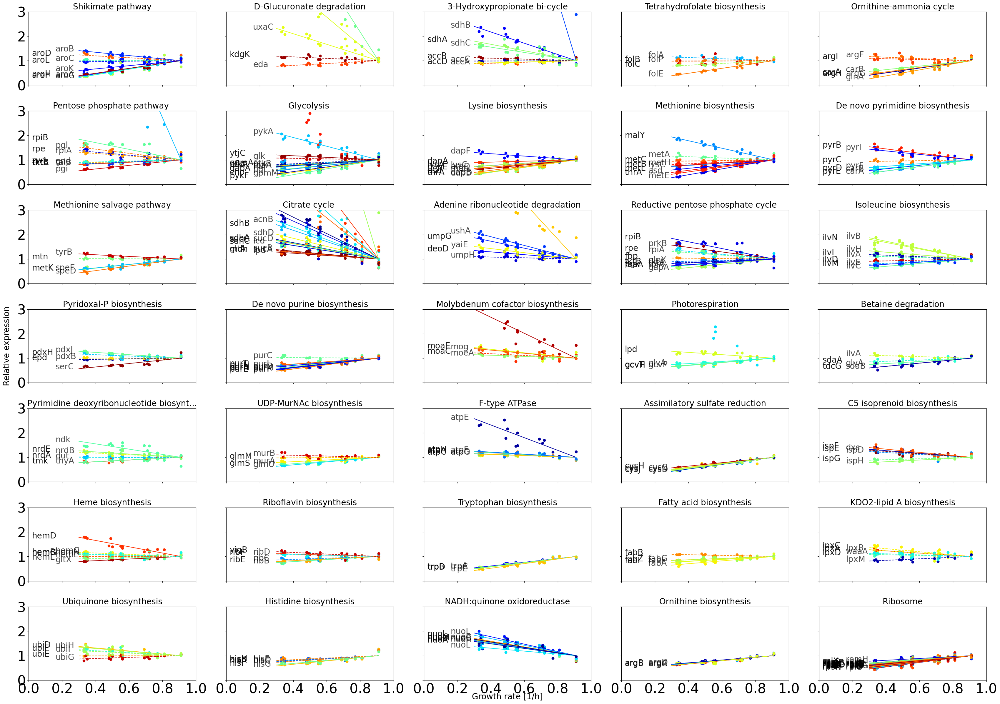

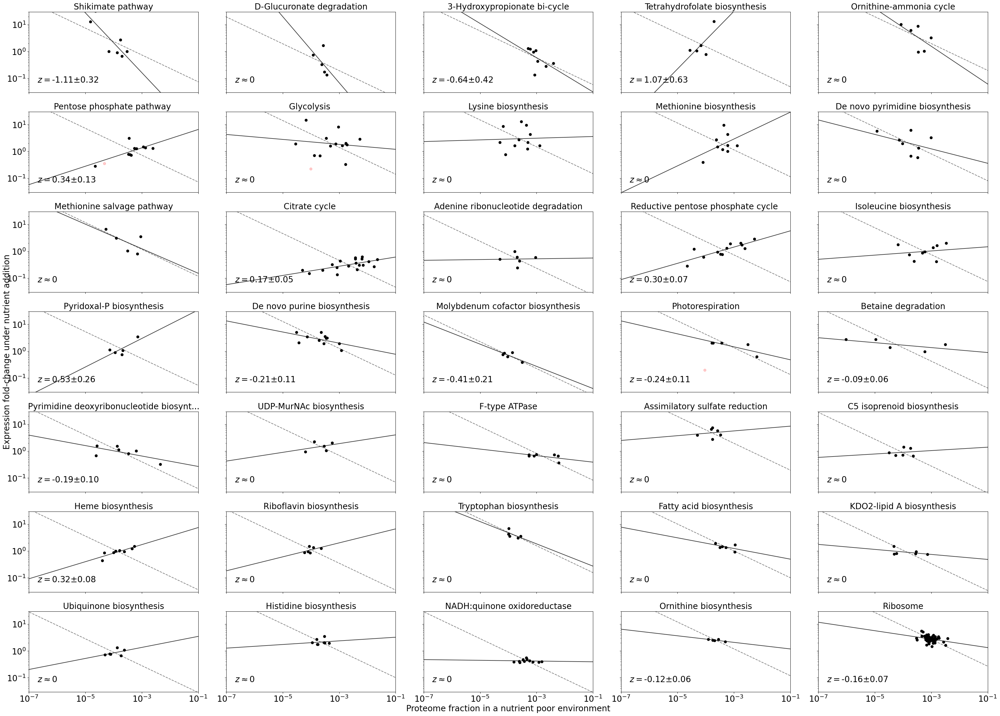

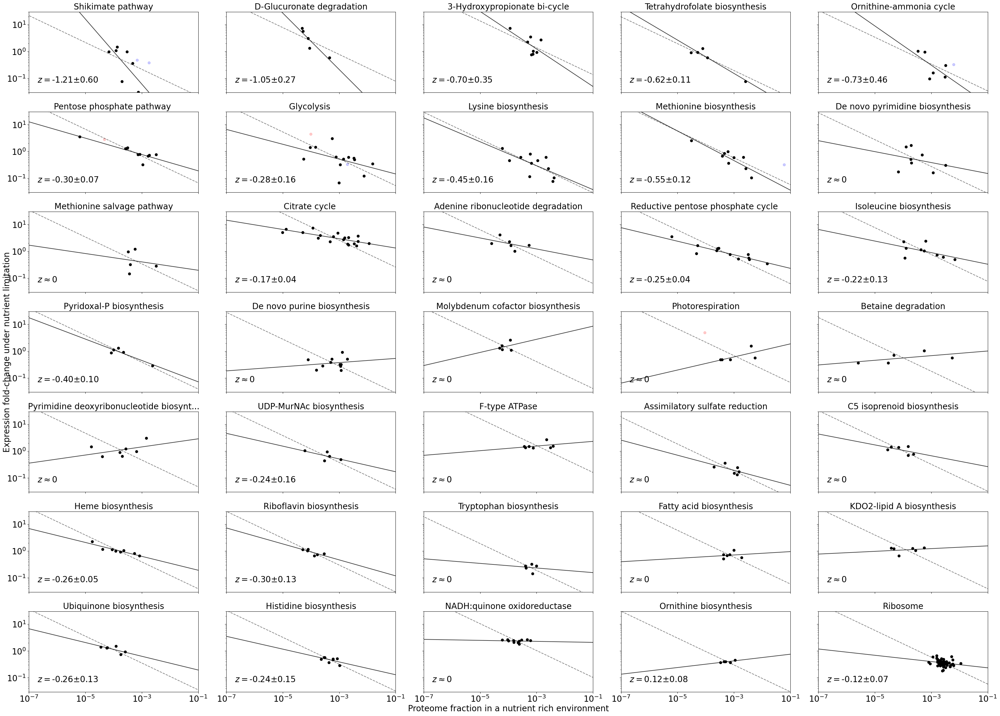

In [41]:
for limitation in ["Carbon"]:
    for anticorrelation in [False, True]:
        if anticorrelation:
            for reverse in [True, False]:
                plotModules(limitation, anticorrelation, reverse)
        else:
            plotModules(limitation, anticorrelation, reverse = False)

In [43]:
from scipy.stats import rankdata

anticorrelation = True
reverse = True
limitation = "Carbon"

def plotAnticorrelationFigure(limitation, short = False, sigma = 0.107):
    if limitation == "Carbon":
        #Carbon limitation dataset
        grsall = [0.91, 0.77, 0.69, 0.56, 0.48, 0.35, 0.72, 0.56, 0.33, 0.49, 0.81, 0.71, 0.55, 0.5, 0.34]
        columnsall = ["C2", "C3", "C4", "C5", "C6", "C7", "C8", "D6", "D7", "D8", "F4", "F5", "F6", "F7", "F8"]

    dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 
    
    data = dataset[columnsall].to_numpy()
    grs = np.array(grsall)
    meangr = np.mean(grs)
    
    names = dataset[["Gene name"]].to_numpy()
    UniIDs = dataset[["Protein ID"]].to_numpy()
    means = np.mean(data, 1)
    #means[means == 0] = np.nan
    means[np.any(data == 0, axis = 1)] = np.nan
    slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
    offsets = means-slopes*meangr
    r2s = np.sum((data.T-means).T*(grs-meangr), 1)/np.sqrt(np.sum((grs-meangr)**2)*np.sum((data.T-means).T**2, 1))
    squares = np.sum((data - ((np.array([slopes]*len(grs)).T*grs).T+offsets).T)**2, 1)/means**2
    
    #ax = axs[0, 2]
    #x = means[~np.isnan(offsets)]
    #y = offsets[~np.isnan(offsets)]/means[~np.isnan(offsets)]
    x = (data[:, 0])[~np.isnan(means)]
    y = (data[:, -1]/data[:, 0])[~np.isnan(means)]
    validdata = np.all(np.array([x>0, y>0]), 0)
    y = np.log(y[validdata])
    x = np.log(x[validdata])
    
    x_data = np.copy(x)
    y_data = np.copy(y)
    #print(np.sum([y>1]/np.shape(y)[0]))
    
    slope, intercept, r_value, p_value, std_err = linregress(x,y)
    print(slope, p_value)

    vars = []
    for g in gooddb:
        path, unis = g 
        mask = []
        index = 0
        locals = ""
        for UniID in UniIDs:
            if UniID not in unis:
                mask.append(index)
            else:
                locals+=(UniID[0]+", ")
            index += 1
        #offsetsC = offsets+slopes*np.max(grs)
        offsetsC = np.copy(offsets)/(offsets+slopes*np.max(grs))
        offsetsC[mask] = np.nan
        vars.append(np.nanvar(np.log(offsetsC)))
        
    original_list = vars[:-1]
    sorted_list = sorted(original_list)
    sorting_list = list(range(len(original_list)))
    sorting_list.sort(key=lambda x: original_list[x])
    sorting_list = sorting_list[::-1]
    sorting_list.append(len(vars)-1)
    print(len(gooddb))

    
    print(columnsall)
    cmjet = plt.cm.get_cmap('jet')
    if short:
        nx = 3
        ny = 6
        font = {'size'   : int(25)}
        plt.rc('font', **font)
        plt.rcParams.update({'axes.titlesize': int(25)})
        fig, axs = plt.subplots(ny, 2*nx, figsize=(1, 1)) ### replace this by gridspec

        fig = plt.figure(figsize = (35, 33))
        gs = gridspec.GridSpec(31, 30)
        gs.update(wspace=0, hspace=0)
        for n, ax in enumerate(axs.flatten()):
            i = int(n/ny)
            j = n%(2*nx)
            #print(i, j)
            axs[i, j] = plt.subplot(gs[1+5*i+(n>=24):5+5*i+(n>=24), 1+5*j:5+5*j])
        
    else:
        nx = int(np.sqrt(len(gooddb))/2)+2
        ny = int(len(gooddb)/nx)+((len(gooddb)%nx)>0)
        font = {'size'   : int(60/nx)} #20
        plt.rc('font', **font)
        plt.rcParams.update({'axes.titlesize': int(60/nx)})
        fig, axs = plt.subplots(ny, 2*nx, figsize = (35, 30))
    
    deviations = []
    basedeviations = []
    siglevels = []
    for n in range(ny*nx):
        if n<len(gooddb):
            if short*(n>=12):
                Bpathways = ["md:eco_M00144", "md:eco_M00157", "path:eco03010", "md:eco_M00023", "md:eco_M00026", "md:eco_M00176"]
                allpathways = np.array([x[0] for x in gooddb])
                path = Bpathways[n-12]
                nlocal = np.where(allpathways == path)[0][0]
                unis = gooddb[nlocal][1]
            else:
                path, unis = gooddb[sorting_list[n]]
            name = pathway_names[path.split(":")[1]].split(" - ")[0].split(", ")[0].split("(")[0]
            ax1 = axs.flatten()[2*n]
            ax2 = axs.flatten()[2*n+1]
            
            mask = []
            index = 0
            locals = ""
            for UniID in UniIDs:
                if UniID not in unis:
                    mask.append(index)
                else:
                    locals+=(UniID[0]+", ")
                index += 1
            
            #print(locals)
            meansC = np.copy(means)
            meansC[mask] = np.nan
            
            xs = data[~np.isnan(meansC)]
            localoffsets = offsets[~np.isnan(meansC)]
            localslopes = slopes[~np.isnan(meansC)]
            localnames = names[~np.isnan(meansC)]
            rich = (np.log((localoffsets+localslopes*grs[0]))+11)/12
            ys = (localoffsets+localslopes*0.2)/(localoffsets+localslopes*grs[0])
    
            deviation = np.mean((((localoffsets[:, None]+localslopes[:, None]*grs[None, :])-xs)/(localoffsets[:, None]+localslopes[:, None]*grs[None, :]))**2, axis = 1)

            scatterxs = localoffsets[deviation<(3*sigma)**2]+np.max(grs)*localslopes[deviation<(3*sigma)**2]#xs[deviation<0.05, 0]
            scatterys = localoffsets[deviation<(3*sigma)**2]/xs[deviation<(3*sigma)**2, 0]
            ax2.scatter(scatterxs[scatterys>0], scatterys[scatterys>0], color = "k")
            if not short:
                ax2.scatter(scatterxs[scatterys<0], (xs[deviation<(3*sigma)**2, -1]/xs[deviation<(3*sigma)**2, 0])[scatterys<0], color = "k", alpha = 0.5, marker = "+")
                ax2.scatter(xs[deviation>(3*sigma)**2, 0], xs[deviation>(3*sigma)**2, -1]/xs[deviation>(3*sigma)**2, 0], color = "k", alpha = 0.2, marker = "x")

            
            allxs = np.linspace(-7, 7, 10)
            slope, intercept, r_value, p_value, std_err = linregress(np.log10(scatterxs[scatterys>0]), np.log10(scatterys[scatterys>0]))
            #ax2.text(2e-7, 7e-2, r"$\frac{d\ln \xi}{d \ln \phi^{hi}}$ = "+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err)
            if ~(np.abs(slope)-1.5*np.abs(std_err)>0):
                ax2.text(2e-7, 7e-2, r"$z \approx 0$")
            elif (short and n>=12):
                ax2.text(2e-7, 7e-2, r"$z \approx 0$")
            else:
                #print(n, (np.abs(slope)-1.5*np.abs(std_err)>0), (short and n>12))
                ax2.text(2e-7, 7e-2, r"$z = $"+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err)
            
                
            #print(name, "%.3f"%slope,r_value, p_value, std_err)
            ax2.plot(10**(allxs), 10**(slope*allxs+intercept), color = "k", linestyle = "-", alpha = 0.8)
            ax2.plot(10**(allxs+np.nanmean(np.log10(scatterxs))), 10**(-1/2*allxs+np.nanmean(np.log10(scatterys))), color = "k", linestyle = "--", alpha = 0.5)
            #print(scatterxs, scatterys)
            #siglevels.append(slope/std_err)
            siglevels.append(np.log10(p_value)*slope/np.abs(slope))

            labelsx = [0]
            labelsy = [0]
            for i in range(len(xs)):
                color = cmjet(np.random.uniform())
                #ax.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color
                deviation = np.mean((1-xs[i]/(localoffsets[i]+localslopes[i]*grs))**2)
                deviations.append(deviation)
                if deviation<(3*sigma)**2:
                    ax1.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color)
                    ax1.plot(np.linspace(0.3, grs[0], 5), (localoffsets[i]+localslopes[i]*np.linspace(0.3, grs[0], 5))/(localoffsets[i]+localslopes[i]*grs[0]), color = color, linestyle = "-")
                    if ys[i]<3 and ys[i]>0:
                        labelx = 0.02+0.14*(rankdata(ys)[i]%2)
                        labely = 1+(ys[i]-1)*0.85-0.03
                        if not short:
                            if np.min(100*(np.array(labelsx)-labelx)**2+(np.array(labelsy)-labely)**2)>0.01:
                                labelsx.append(labelx) 
                                labelsy.append(labely)
                                ax1.text(labelx, labely, localnames[i][0], alpha = 0.7, fontsize = int(10+short*7))
                        #else:
                        #    ax1.text(labelx+0.1, labely, "...", alpha = 0.7, fontsize = 20)
                else:
                    ax1.scatter(grs, xs[i]/xs[i][0], color = color)
                   
            if len(name)<60:
                ax1.set_title(name, loc = "left")
            else:
                ax.set_title(name[:58]+"...")

            ax1.scatter(grs, np.nansum(xs, axis = 0)/np.nansum(localoffsets+localslopes*grs[0], axis = 0), color = "k", zorder = 500)
            ax1.plot(np.linspace(0.3, grs[0], 5), (np.nansum(localoffsets, axis = 0)+np.nansum(localslopes, axis = 0)*np.linspace(0.3, grs[0], 5))/(np.nansum(localoffsets, axis = 0)+np.nansum(localslopes, axis = 0)*grs[0]), color = "k", linestyle = "--", linewidth = 3)
    
        else: 
            axs.flatten()[2*n].axis("off")
            axs.flatten()[2*n+1].axis("off")
        
        ax2.set_ylim(0.03, 30)
        ax2.set_xlim(1e-7, 1e-1)
        ax2.set_xscale("log")
        ax2.set_yscale("log")

        ax1.set_ylim(0, 3)
        ax1.set_xlim(0, 1)
        ax1.set_xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
            
        if n in np.arange(ny)*nx:
            ax1.set_ylabel(r"$\phi/\phi^{hi}$")

        if n in np.arange(len(gooddb)*(1-short)+18*short-nx):
            ax1.set_xticklabels([])
            ax2.set_xticklabels([])
        else:
            ax1.set_xticklabels([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
            ax1.set_xlabel(r"Growth rate $\lambda$ [1/h]")
            ax2.set_xlabel(r"$\phi^{hi}$")
    
    # add a big axes, hide frame
    fig.add_subplot(111, frameon=False)
    # hide tick and tick label of the big axes
    plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
    plt.grid(False)

    coolwarm = plt.cm.get_cmap('coolwarm')
    siglevels = np.array(siglevels)
    siglevels[np.abs(siglevels)>10] = 0
    #colors = siglevels/np.nanmax(np.abs(siglevels))/2+1/2
    colors = siglevels/5/2+1/2
    colors[colors>1] = 1
    colors[colors<0] = 0
    colors[np.isnan(colors)] = 1/2
    #print(siglevels, colors)
    #for n in range(len(gooddb)):
        #ax = axs.flatten()[2*n+1]
        #ax.set_facecolor(coolwarm(colors[n]))

    fig.tight_layout()
    if short:
        fig.text(0.12, 0.87, "A",weight="bold", fontsize = 35)
        fig.text(0.12, 0.35, "B",weight="bold", fontsize = 35)
        plt.savefig("15Pathways_CarbonLimitation.pdf", bbox_inches="tight", format = 'pdf')
    else:
        plt.savefig("AllPathways_CarbonLimitation.pdf", bbox_inches="tight", format = 'pdf')
    #plt.savefig("AllPathways_Translation.pdf", bbox_inches="tight", format = 'pdf')
    print(siglevels)
    print(np.log10(0.05))
    print(np.sum(siglevels>-np.log10(0.05)))
    return 

-0.12831751370295258 1.254022141712238e-42
35
['C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'D6', 'D7', 'D8', 'F4', 'F5', 'F6', 'F7', 'F8']
[ 0.98159365  1.90072977  0.91885697  1.80823586  0.78020088  2.80543149
  0.84121645  1.59031204  2.70180573  0.31740775  0.11075756  4.19452325
  0.59505865  3.95915837  0.80929443  1.5336698  -0.19939372 -0.0253157
 -0.64971468 -0.48981806 -0.59729871  0.64391776 -0.21406342  0.6128049
  0.5054536   2.76916424  1.06447739  0.02443518 -0.07734525 -0.16902067
  0.92795945  0.83637589  0.05730055 -0.72908724  0.71322354]
-1.3010299956639813
9


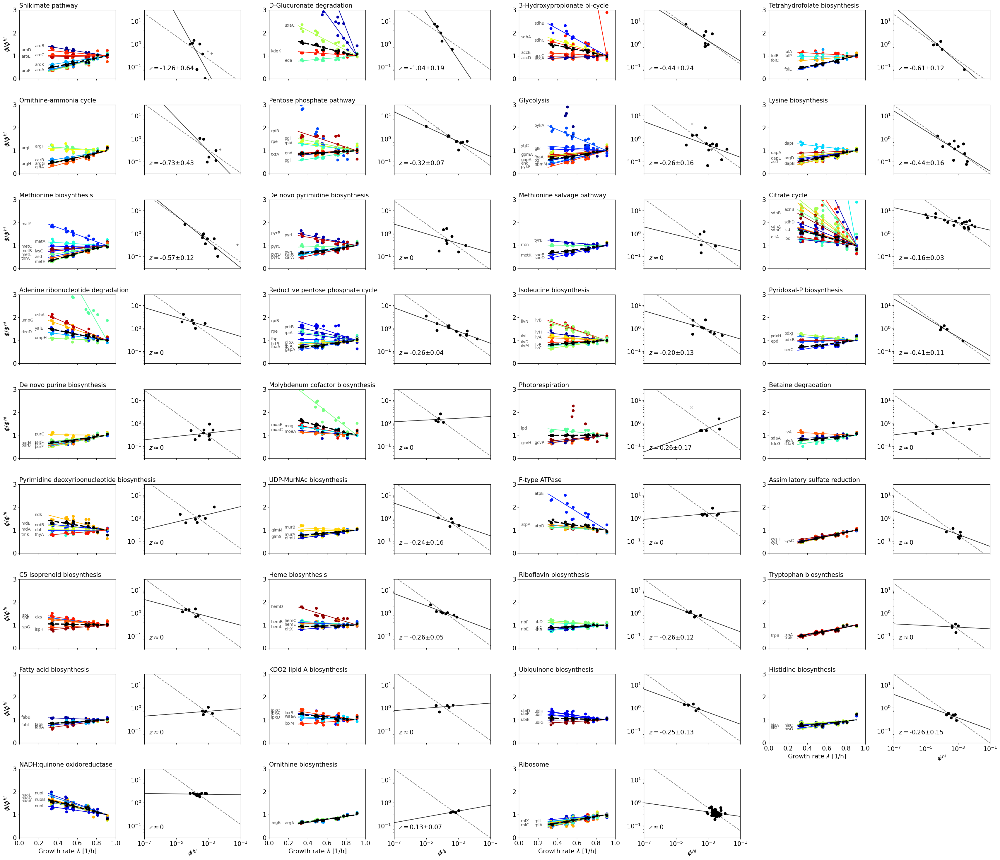

In [45]:
plotAnticorrelationFigure("Carbon", short = False, sigma = 0.2)

In [51]:
def landscape(sumoverkappa, sumKMoverkappa, j1):
    return (-1-j1*sumoverkappa + np.sqrt((1+j1*sumoverkappa)**2+4*j1*(sumKMoverkappa**2-sumoverkappa)))/(2*(sumKMoverkappa**2-sumoverkappa))

kappas = np.array([3e1]*20)
KMs = np.array([1e-4]*20)

lammax = 1/np.sum(1/kappas)  #2
eps = np.sum(np.sqrt(lammax*KMs/kappas)) #0.1

print(lammax, eps)
sumoverkappa = 1/lammax
sumKMoverkappa = eps/np.sqrt(lammax)

j1max = lammax+2/3*eps

print(landscape(sumoverkappa, sumKMoverkappa, j1max), lammax-4/3*eps)

epss = np.linspace(0, 1, 10)
lammaxs = np.linspace(0, 1, 10)

kappas = 10**np.random.normal(2, 1, 19)
KMs = 10**np.random.normal(-4, 1, 19)
basesumoverkappa = np.sum(1/kappas)
basesumKMoverkappa = np.sum(np.sqrt(KMs/kappas))
print(basesumoverkappa, basesumKMoverkappa)

logkappai = np.linspace(-2, 5, 100)
logKMi = np.linspace(-8, 2, 100)

x, y = np.meshgrid(logkappai, logKMi) ### x is log kappa, y is log KM
j1max = 1/basesumoverkappa*(1+2/3*np.sqrt(basesumoverkappa)*basesumKMoverkappa)
height = landscape(basesumoverkappa+10**(-x), basesumKMoverkappa+10**(y/2-x/2), j1max)


1.5 0.0447213595499958
1.4484378298283787 1.4403715206000056
2.4706430196032336 0.20054692969839838


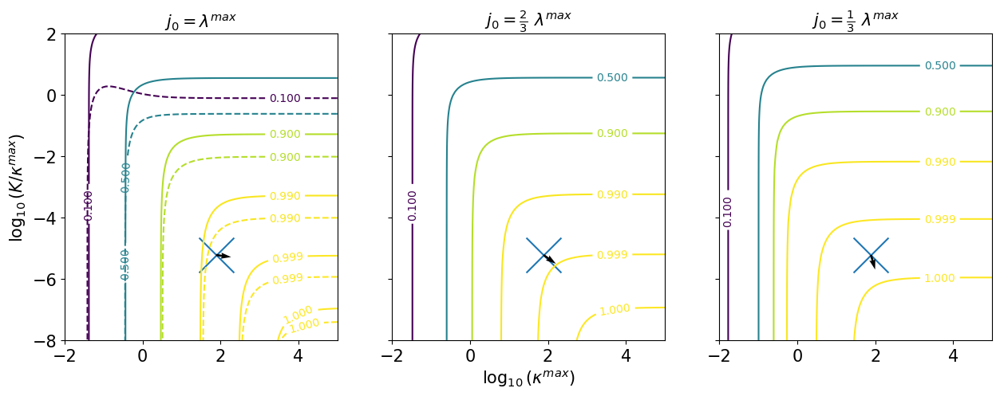

In [53]:
fig, axs = plt.subplots(1, 3, figsize = (15, 5))
heightf = 1/(basesumoverkappa+10**(-x))-4/3*1/(basesumoverkappa+10**(-x))**(3/2)*(basesumKMoverkappa+10**(y/2))
CS = axs[0].contour(x, y, heightf/np.max(heightf), levels = [0.1, 0.5, 0.9, 0.99, 0.999, 0.9999], linestyles = "dashed")
axs[0].clabel(CS, CS.levels, fontsize=10)


for i in range(3):
    height = landscape(basesumoverkappa+10**(-x), basesumKMoverkappa+10**(y/2), j1max*(3-i)/3)
    CS = axs[i].contour(x, y, height/np.max(height), levels = [0.1, 0.5, 0.9, 0.99, 0.999, 0.9999])
    axs[i].clabel(CS, CS.levels, fontsize=10)
    
    dx = 0.01
    gradient_x = (landscape(basesumoverkappa+10**(-(np.mean(np.log10(kappas))+dx)), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2), j1max*(3-i)/3) - landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2), j1max*(3-i)/3))/dx
    gradient_y = (landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**((np.mean(np.log10(KMs/kappas))+dx)/2), j1max*(3-i)/3) - landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2), j1max*(3-i)/3))/dx
    axs[i].scatter(np.mean(np.log10(kappas)), np.mean(np.log10(KMs/kappas)), 1000, marker = "x")
    #print(gradient_x, gradient_y)
    axs[i].quiver([np.mean(np.log10(kappas))], [np.mean(np.log10(KMs/kappas))], [gradient_x], [gradient_y])#, scale = 10**(-2.5-1.1*i))


axs[0].set_title(r"$j_0 = \lambda^{max}$")
axs[1].set_title(r"$j_0 = \frac{2}{3}~\lambda^{max}$")
axs[2].set_title(r"$j_0 = \frac{1}{3}~\lambda^{max}$")
axs[1].set_yticklabels([])
axs[2].set_yticklabels([])
#axs[0].set_xlabel("log10(kappa)")
axs[1].set_xlabel(r"$\log_{10}(\kappa^{max})$")
#axs[2].set_xlabel("log10(kappa)")
axs[0].set_ylabel(r"$\log_{10}(K/\kappa^{max})$")
plt.savefig("2DLandscape.png")

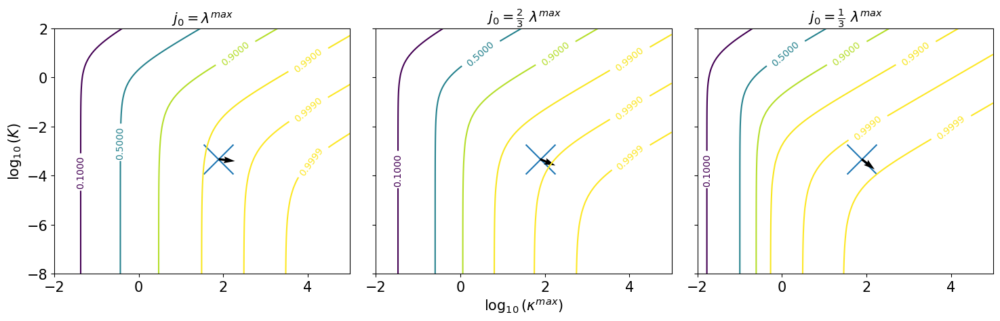

In [55]:
fig, axs = plt.subplots(1, 3, figsize = (15, 5))
heightf = 1/(basesumoverkappa+10**(-x))-4/3*1/(basesumoverkappa+10**(-x))**(3/2)*(basesumKMoverkappa+10**(y/2-x/2))
#CS = axs[0].contour(x, y, heightf/np.max(heightf), levels = [0.1, 0.5, 0.9, 0.99, 0.999, 0.9999], linestyles = "dashed")
#axs[0].clabel(CS, CS.levels, fontsize=10)


for i in range(3):
    height = landscape(basesumoverkappa+10**(-x), basesumKMoverkappa+10**(y/2-x/2), j1max*(3-i)/3)
    CS = axs[i].contour(x, y, height/np.max(height), levels = [0.1, 0.5, 0.9, 0.99, 0.999, 0.9999])
    axs[i].clabel(CS, CS.levels, fontsize=10, fmt = '%1.4f')
    
    dx = 0.01
    gradient_x = (landscape(basesumoverkappa+10**(-(np.mean(np.log10(kappas))+dx)), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2-dx/2), j1max*(3-i)/3) - landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2), j1max*(3-i)/3))/dx
    gradient_y = (landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**((np.mean(np.log10(KMs/kappas))+dx)/2), j1max*(3-i)/3) - landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2), j1max*(3-i)/3))/dx
    axs[i].scatter(np.mean(np.log10(kappas)), np.mean(np.log10(KMs)), 1000, marker = "x")
    #print(gradient_x, gradient_y)
    axs[i].quiver([np.mean(np.log10(kappas))], [np.mean(np.log10(KMs))], [gradient_x], [gradient_y])#, scale = 10**(-2.5-1.1*i))


axs[0].set_title(r"$j_0 = \lambda^{max}$")
axs[1].set_title(r"$j_0 = \frac{2}{3}~\lambda^{max}$")
axs[2].set_title(r"$j_0 = \frac{1}{3}~\lambda^{max}$")
axs[1].set_yticklabels([])
axs[2].set_yticklabels([])
#axs[0].set_xlabel("log10(kappa)")
axs[1].set_xlabel(r"$\log_{10}(\kappa^{max})$")
#axs[2].set_xlabel("log10(kappa)")
axs[0].set_ylabel(r"$\log_{10}(K)$")
fig.tight_layout()
plt.savefig("2DLandscape_Kk.png")

In [515]:
Nenzymes = 20
filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

print(np.shape(fullensemble))

index = np.where((fullensemble[:, 0, 3, -1]<1)*(fullensemble[:, 0, 1, -1]>1e-5))[0][1]
onechain = fullensemble[index]

def Pproduction(rho, KM, kappa, sumoverkappa, sumKMoverkappa):
    phii0 = KM/kappa/(np.sqrt(KM/kappa)*sumKMoverkappa)
    ai = (1/kappa/sumoverkappa-phii0)
    Kregi = np.sqrt(KM/kappa)*sumKMoverkappa/sumoverkappa
    return phii0 +ai/(1+Kregi/rho)
    #return 1/kappa*(rho+KM)/(rho*sumoverkappa+np.sqrt(KM/kappa)*sumKMoverkappa)

def Rproduction(phi, rho, KM, kappa):
    return kappa*phi/(1+KM/rho)

def iterate(phistart, KMs, kappas, nu, phiUptake, Nsteps = 500000):
    sumoverkappa = np.sum(1/kappas)
    sumKMoverkappa = np.sum(np.sqrt(KMs/kappas))
    phis = phistart
    phis = phis/np.sum(phis)
    lam = 0
    rhos = KMs*np.sqrt(phistart/KMs)
    rhos[-1] = nu
    
    dt = 1e-5
    savephis = [phis]
    saverhos = [rhos]
    times = [0]
    steps = np.arange(Nsteps)
    for i in steps:
        fluxes = Rproduction(phis, rhos, KMs, kappas)
        shiftedfluxes = np.append(fluxes[1:], np.zeros(1))
        drhos = -lam*rhos-fluxes+shiftedfluxes
        
        dMs = Pproduction(rhos, KMs, kappas, sumoverkappa, sumKMoverkappa)*(1-phiUptake)
        dMs = dMs/np.sum(dMs[:-1])*(1-phiUptake)
        dMs[-1] = phiUptake
        
        phis += (-lam*phis+lam*dMs/np.sum(dMs))*dt
        phis = phis/np.sum(phis)
        rhos += drhos*dt
        
        lam = fluxes[0]
        rhos[-1] = nu
        rhos[rhos<0] = 1e-15
        if i%100 == 0:
            times.append(dt*steps[i])
            savephis.append(phis)
            saverhos.append(np.copy(rhos))
            
    savephis = np.array(savephis)
    saverhos = np.array(saverhos)
    
    #fig, axs = plt.subplots(1, 2, figsize = (15, 5))
    allrhos = np.logspace(-3, 3, 100)
    productions = []
    
    for rho in allrhos:
        productions.append(Pproduction(rho*KMs, KMs, kappas, sumoverkappa, sumKMoverkappa))
    productions = np.array(productions)
    
    return times, saverhos, savephis, allrhos, productions[:, 0]/productions[-1, 0], rhos, phis, fluxes

reduction0 = np.min(np.where(onechain[:, 5, 0] <= onechain[0, 5, 0]/1.01))
reduction1 = np.min(np.where(onechain[:, 5, 0] <= onechain[0, 5, 0]/2))
reduction2 = np.min(np.where(onechain[:, 5, 0] <= onechain[0, 5, 0]/1.5))

richref = onechain[reduction0]
ref = onechain[reduction1]
ref2 = onechain[reduction2]

kappas = richref[0]
KMs = richref[1]
phistart = ref2[4]*np.random.lognormal(0, 2, 20)
richref = onechain[0]
nu = richref[3, -1]
phimin = richref[4, -1]
phimax = 5*phimin/(1+(5-1)*phimin)
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times0, saverhos0, savephis0, allrhos0, normproductions0, rhos0, phis0, fluxes0 = iterate(phistart, KMs, kappas, nu, phiUptake)

#phistart = richref[4]*np.random.lognormal(0, 2, 20)
phistart = np.copy(phis0)
nu = richref[3, -1]
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times, saverhos, savephis, allrhos, normproductions, rhos, phis, fluxes = iterate(phistart, KMs, kappas, nu, phiUptake, Nsteps = 250000)


phistart = np.copy(phis)#richref[4]*np.random.lognormal(0, 1, 20)*ref[5, 0]/richref[5, 0]
nu = ref[3, -1]
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times2, saverhos2, savephis2, allrhos2, normproductions2, rhos2, phis2, fluxes2 = iterate(phistart, KMs, kappas, nu, phiUptake)


phistart = np.copy(phis2)#richref[4]*np.random.lognormal(0, 1, 20)*ref[5, 0]/richref[5, 0]
nu = ref2[3, -1]
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times3, saverhos3, savephis3, allrhos3, normproductions3, rhos3, phis3, fluxes3 = iterate(phistart, KMs, kappas, nu, phiUptake)

(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)


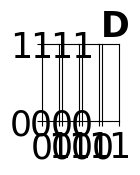

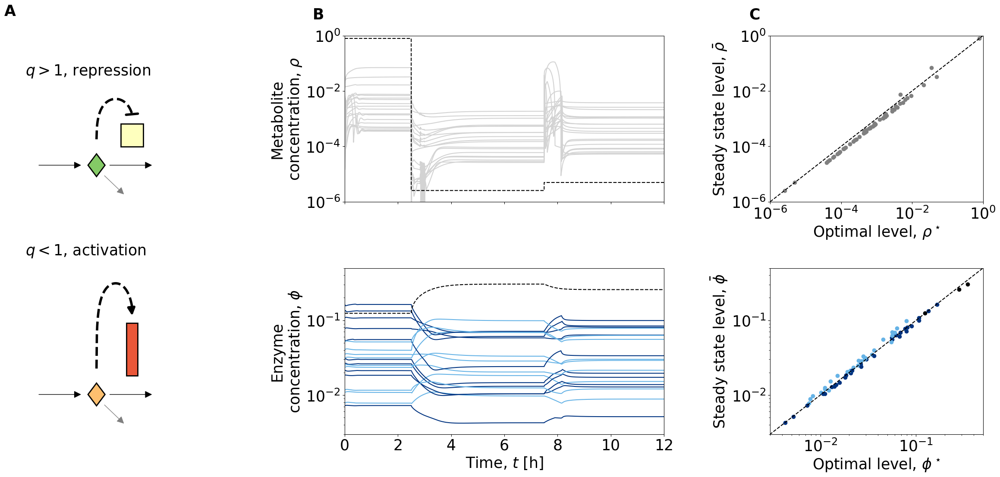

In [507]:
times = np.array(times)
savephis = np.array(savephis)
saverhos = np.array(saverhos)
times2 = np.array(times2)
savephis2 = np.array(savephis2)
saverhos2 = np.array(saverhos2)
times3 = np.array(times3)
savephis3 = np.array(savephis3)
saverhos3 = np.array(saverhos3)

alltimes = np.concatenate((times, times2+times[-1], times3+times2[-1]+times[-1]))
allphis = np.concatenate((savephis, savephis2, savephis3))
allrhos = np.concatenate((saverhos, saverhos2, saverhos3))

lammax = 1/np.sum(1/kappas)
Qs = np.sqrt(kappas*KMs)
qis = Qs/(np.sum(Qs/kappas)*lammax)

RYG = plt.cm.get_cmap('RdYlGn')


font = {'size'   : 25}
plt.rc('font', **font)
dt = 1e-5
fig, axs = plt.subplots(1, 4, figsize = (1, 1))
fig = plt.figure(figsize = (35, 12))
gs = gridspec.GridSpec(12, 11)
gs.update(wspace=0, hspace=0)
axs[0] = plt.subplot(gs[:6, 2:4])
ax0 = plt.subplot(gs[6:, 2:4])
axs[1] = plt.subplot(gs[:5, 5:8])
ax1 = plt.subplot(gs[7:, 5:8])
ax2 = plt.subplot(gs[7:, 9:])
axs[2] = plt.subplot(gs[:5, 9:])
#axs[2, 2] = plt.subplot(gs[7:10, 9:])
#axs[3, 0] = plt.subplot(gs[11:13, 1:6])
#axs[3, 1] = plt.subplot(gs[11:13, 7:])
#axs[4, 0] = plt.subplot(gs[14:17, 1:4])
#axs[4, 1] = plt.subplot(gs[14:17, 5:8])
#axs[4, 2] = plt.subplot(gs[14:17, 9:])
isample = 0
xs = np.linspace(0, 0.5, 100)

vmin = -5
vmax = 1

j = 1
axs[0].annotate("", xy = (j+0.8, 1), xytext = (j+0.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
axs[0].annotate("", xy = (j+1.8, 1), xytext = (j+1.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
axs[0].annotate("", xy = (j+1.4, .5), xytext = (j+1.1, 0.8), arrowprops=dict(arrowstyle="-|>", color='grey'))

axs[0].plot(j+1+xs, (1.4+j**2*8*np.sqrt(0.27**2-(xs-0.27)**2))*1.3, "k--", linewidth = 4)
axs[0].add_patch(plt.Polygon([[j+.88, 1], [j+1, 1.3], [j+1.12, 1], [j+1, 1/1.3]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((7-2.5*j)/(vmax-vmin))))
axs[0].add_patch(plt.Polygon([[j+1-.16/j+.5, 2*1.3*j], [j+1-.16/j+.5, 2/1.3], [j+1+.16/j+.5, 2/1.3], [j+1+.16/j+.5, 2*1.3*j]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((5-2*j)/(vmax-vmin))))   
axs[0].annotate("", xy = (j+1.4, 3.2), xytext = (j+1.6, 3.3), arrowprops=dict(arrowstyle="-", color='k', linewidth = 4))
#axs[0].annotate(r"q>1", xy = (j+1.1, 5), xytext = (j+1.1, 5), arrowprops=dict(arrowstyle="-", color='white'))
axs[0].text(1, 8, "$q>1$, repression")


axs[0].set_yscale("log")
axs[0].set_xlim(1, 4)
axs[0].set_ylim(0.2, 20)
axs[0].axis("off")

j = 2
ax0.annotate("", xy = (j-1+0.8, 1), xytext = (j-1+0.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
ax0.annotate("", xy = (j+.8, 1), xytext = (j+.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
ax0.annotate("", xy = (j+.4, .5), xytext = (j+.1, 0.8), arrowprops=dict(arrowstyle="-|>", color='grey'))

ax0.plot(j+xs, (1.4+j**2*8*np.sqrt(0.27**2-(xs-0.27)**2))*1.3, "k--", linewidth = 4)
ax0.add_patch(plt.Polygon([[j-1+.88, 1], [j, 1.3], [j+.12, 1], [j, 1/1.3]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((7-2.5*j)/(vmax-vmin))))
ax0.add_patch(plt.Polygon([[j-.16/j+.5, 2*1.3*j], [j-.16/j+.5, 2/1.3], [j+.16/j+.5, 2/1.3], [j+.16/j+.5, 2*1.3*j]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((5-2*j)/(vmax-vmin))))   
ax0.annotate("", xy = (j+.505, 3*2), xytext = (j+.495, 3.5*2), arrowprops=dict(arrowstyle="-|>", color='k', linewidth = 4))
#ax0.annotate(r"q<1", xy = (j+.1, 5*3), xytext = (j+.1, 5*3), arrowprops=dict(arrowstyle="-", color='white'))
ax0.text(1, 25, "$q<1$, activation")

ax0.set_yscale("log")
ax0.set_xlim(1, 4)
ax0.set_ylim(0.4, 40)
ax0.axis("off")


xs = np.linspace(0, 0.5, 100)


for i in range(Nenzymes-1):
    ax1.plot(alltimes, allphis[:, i], color = basecolors[int(qis[i]>1), 0])#RYG(np.log(qis)[i]/4+1/2))
    axs[1].plot(alltimes, allrhos[:, i], color = "lightgrey")

i = Nenzymes-1
ax1.plot(alltimes, allphis[:, i], color = "k", linestyle = "--")
axs[1].plot(alltimes, allrhos[:, i], color = "k", linestyle = "--")

ax1.set_yscale("log")
axs[1].set_yscale("log")
axs[1].set_xlabel("")
ax1.set_ylabel("Enzyme\n"+r"concentration, $\phi$")
axs[1].set_ylabel("Metabolite\n"+r"concentration, $\rho$")
ax1.set_ylim(3e-3, 5e-1)
axs[1].set_ylim(1e-6, 1e0)
ax1.set_xlabel("Time, $t$ [h]")
axs[1].set_xlim(0, 12)
ax1.set_xlim(0, 12)
axs[1].set_xticklabels([])

axs[2].scatter(richref[3], rhos, color = "grey")
axs[2].scatter(ref[3], rhos2, color = "grey")
axs[2].scatter(ref2[3], rhos3, color = "grey")
axs[2].plot([1e-6, 1], [1e-6, 1], "k--")
axs[2].set_xscale("log")
axs[2].set_yscale("log")
axs[2].set_xlim(1e-6, 1)
axs[2].set_ylim(1e-6, 1)
axs[2].set_ylabel(r"Steady state level, $\bar \rho$")
axs[2].set_xlabel(r"Optimal level, $\rho^\star$")
#axs[3].set_xlabel("Optimal resource allocation")
#axs[3].set_ylabel("Regulatory steady state")

for i in range(Nenzymes-1):
    ax2.scatter(richref[4, i], phis[i], color = basecolors[int(qis[i]>1), 0])
    ax2.scatter(ref[4, i], phis2[i], color = basecolors[int(qis[i]>1), 0])
    ax2.scatter(ref2[4, i], phis3[i], color = basecolors[int(qis[i]>1), 0])
    
i = Nenzymes -1
ax2.scatter(richref[4, i], phis[i], color = "k")
ax2.scatter(ref[4, i], phis2[i], color = "k")
ax2.scatter(ref2[4, i], phis3[i], color = "k")

ax2.plot([1e-3, 1], [1e-3, 1], "k--")
ax2.set_xscale("log")
ax2.set_yscale("log")
ax2.set_xlim(3e-3, 5e-1)
ax2.set_ylim(3e-3, 5e-1)
ax2.set_xlabel(r"Optimal level, $\phi^\star$")
ax2.set_ylabel(r"Steady state level, $\bar \phi$")
#ax2.yaxis.set_label_coords(-0.25, 1.25)

#fig.tight_layout()
for n, ax in enumerate(axs): 
    ax.text(-0.1, 1.1, string.ascii_uppercase[n], transform=ax.transAxes, weight='bold')

#plt.savefig("/Users/leonseeger/Dropbox/EffluxPumpsLeon/Draft/CommentingVersion/MainTextRegulation.pdf", bbox_inches="tight", format = 'pdf')

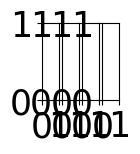

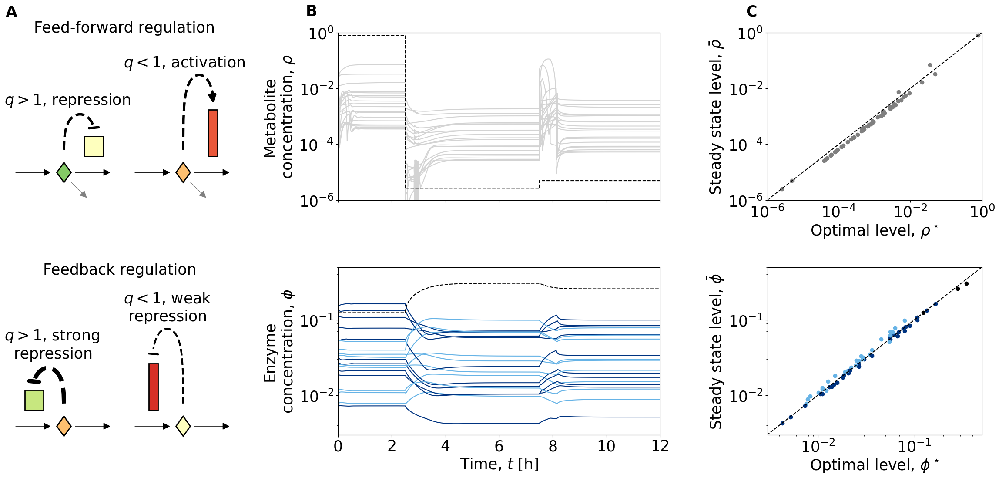

In [527]:
times = np.array(times)
savephis = np.array(savephis)
saverhos = np.array(saverhos)
times2 = np.array(times2)
savephis2 = np.array(savephis2)
saverhos2 = np.array(saverhos2)
times3 = np.array(times3)
savephis3 = np.array(savephis3)
saverhos3 = np.array(saverhos3)

alltimes = np.concatenate((times, times2+times[-1], times3+times2[-1]+times[-1]))
allphis = np.concatenate((savephis, savephis2, savephis3))
allrhos = np.concatenate((saverhos, saverhos2, saverhos3))

lammax = 1/np.sum(1/kappas)
Qs = np.sqrt(kappas*KMs)
qis = Qs/(np.sum(Qs/kappas)*lammax)

RYG = plt.cm.get_cmap('RdYlGn')


font = {'size'   : 25}
plt.rc('font', **font)
dt = 1e-5
fig, axs = plt.subplots(1, 4, figsize = (1, 1))
fig = plt.figure(figsize = (35, 12))
gs = gridspec.GridSpec(12, 11)
gs.update(wspace=0, hspace=0)
axs[0] = plt.subplot(gs[:6, 2:3])
ax0 = plt.subplot(gs[:6, 3:4])
ax10 = plt.subplot(gs[6:, 2:3])
ax11 = plt.subplot(gs[6:, 3:4])

axs[1] = plt.subplot(gs[:5, 5:8])
ax1 = plt.subplot(gs[7:, 5:8])
ax2 = plt.subplot(gs[7:, 9:])
axs[2] = plt.subplot(gs[:5, 9:])
#axs[2, 2] = plt.subplot(gs[7:10, 9:])
#axs[3, 0] = plt.subplot(gs[11:13, 1:6])
#axs[3, 1] = plt.subplot(gs[11:13, 7:])
#axs[4, 0] = plt.subplot(gs[14:17, 1:4])
#axs[4, 1] = plt.subplot(gs[14:17, 5:8])
#axs[4, 2] = plt.subplot(gs[14:17, 9:])
isample = 0
xs = np.linspace(0, 0.5, 100)

vmin = -5
vmax = 1

j = 1
axs[0].annotate("", xy = (j+0.8, 1), xytext = (j+0.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
axs[0].annotate("", xy = (j+1.8, 1), xytext = (j+1.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
axs[0].annotate("", xy = (j+1.4, .5), xytext = (j+1.1, 0.8), arrowprops=dict(arrowstyle="-|>", color='grey'))

axs[0].plot(j+1+xs, (1.4+j**2*8*np.sqrt(0.27**2-(xs-0.27)**2))*1.3, "k--", linewidth = 4)
axs[0].add_patch(plt.Polygon([[j+.88, 1], [j+1, 1.3], [j+1.12, 1], [j+1, 1/1.3]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((7-2.5*j)/(vmax-vmin))))
axs[0].add_patch(plt.Polygon([[j+1-.16/j+.5, 2*1.3*j], [j+1-.16/j+.5, 2/1.3], [j+1+.16/j+.5, 2/1.3], [j+1+.16/j+.5, 2*1.3*j]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((5-2*j)/(vmax-vmin))))   
axs[0].annotate("", xy = (j+1.4, 3.2), xytext = (j+1.6, 3.3), arrowprops=dict(arrowstyle="-", color='k', linewidth = 4))
#axs[0].annotate(r"q>1", xy = (j+1.1, 5), xytext = (j+1.1, 5), arrowprops=dict(arrowstyle="-", color='white'))
axs[0].text(1, 6, "$q>1$, repression")

axs[0].text(1.5, 40, "Feed-forward regulation")

axs[0].set_yscale("log")
axs[0].set_xlim(1.2, 3)
axs[0].set_ylim(0.2, 40)
axs[0].axis("off")

j = 2
ax0.annotate("", xy = (j-1+0.8, 1), xytext = (j-1+0.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
ax0.annotate("", xy = (j+.8, 1), xytext = (j+.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
ax0.annotate("", xy = (j+.4, .5), xytext = (j+.1, 0.8), arrowprops=dict(arrowstyle="-|>", color='grey'))

ax0.plot(j+xs, (1.4+j**2*8*np.sqrt(0.27**2-(xs-0.27)**2))*1.3, "k--", linewidth = 4)
ax0.add_patch(plt.Polygon([[j-1+.88, 1], [j, 1.3], [j+.12, 1], [j, 1/1.3]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((7-2.5*j)/(vmax-vmin))))
ax0.add_patch(plt.Polygon([[j-.16/j+.5, 2*1.3*j], [j-.16/j+.5, 2/1.3], [j+.16/j+.5, 2/1.3], [j+.16/j+.5, 2*1.3*j]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((5-2*j)/(vmax-vmin))))   
ax0.annotate("", xy = (j+.505, 3*2), xytext = (j+.495, 3.5*2), arrowprops=dict(arrowstyle="-|>", color='k', linewidth = 4))
#ax0.annotate(r"q<1", xy = (j+.1, 5*3), xytext = (j+.1, 5*3), arrowprops=dict(arrowstyle="-", color='white'))
ax0.text(1, 16, "$q<1$, activation")

ax0.set_yscale("log")
ax0.set_xlim(1, 2.8)
ax0.set_ylim(0.2, 40)
ax0.axis("off")

isample = 1
xs = np.linspace(0, 0.5, 100)

vmin = -5
vmax = 1

j = 1
ax10.annotate("", xy = (j+0.8, 1), xytext = (j+0.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
ax10.annotate("", xy = (j+1.8, 1), xytext = (j+1.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
ax10.annotate("", xy = (j+1.4, .5), xytext = (j+1.1, 0.8), arrowprops=dict(arrowstyle="-|>", color='grey'))

ax10.plot(j+1-xs, (1.4+j**2*8*np.sqrt(0.27**2-(xs-0.27)**2))*1.3, "k--", linewidth = 7)
ax10.add_patch(plt.Polygon([[j+.88, 1], [j+1, 1.3], [j+1.12, 1], [j+1, 1/1.3]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((7-5*j)/(vmax-vmin))))
ax10.add_patch(plt.Polygon([[j+1-.16/j+.5-1, 2*1.3*j], [j+1-.16/j+.5-1, 2/1.3], [j+1+.16/j+.5-1, 2/1.3], [j+1+.16/j+.5-1, 2*1.3*j]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((5-1.2*j)/(vmax-vmin))))   
ax10.annotate("", xy = (j-1+1.6, 3.2), xytext = (j-1+1.4, 3.3), arrowprops=dict(arrowstyle="-", color='k', linewidth = 7))
#ax10.annotate(r"q>1", xy = (j+1.1, 5), xytext = (j+1.1, 5), arrowprops=dict(arrowstyle="-", color='white'))
ax10.text(1, 6, r"$q > 1$, strong"+"\n  repression")

ax10.text(1.65, 55, "Feedback regulation")

ax10.set_yscale("log")
ax10.set_xlim(1.2, 3)
ax10.set_ylim(0.8, 160)
ax10.axis("off")

j = 2
ax11.annotate("", xy = (j-1+0.8, 1), xytext = (j-1+0.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
ax11.annotate("", xy = (j+.8, 1), xytext = (j+.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
ax11.annotate("", xy = (j+.4, .5), xytext = (j+.1, 0.8), arrowprops=dict(arrowstyle="-|>", color='grey'))

ax11.plot(j-xs, (1.4+j**2*8*np.sqrt(0.27**2-(xs-0.27)**2))*1.3, "k--", linewidth = 3)
ax11.add_patch(plt.Polygon([[j-1+.88, 1], [j, 1.3], [j+.12, 1], [j, 1/1.3]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((7-2*j)/(vmax-vmin))))
ax11.add_patch(plt.Polygon([[j-.16/j+.5-1, 2*1.3*j], [j-.16/j+.5-1, 2/1.3], [j+.16/j+.5-1, 2/1.3], [j+.16/j+.5-1, 2*1.3*j]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((5-2.2*j)/(vmax-vmin))))   
ax11.annotate("", xy = (j-1+.6, 3.3*2), xytext = (j-1+.4, 3.4*2), arrowprops=dict(arrowstyle="-", color='k', linewidth = 3))
#ax11.annotate("", xy = (j-1+.495, 3*2), xytext = (j-1+.505, 3.5*2), arrowprops=dict(arrowstyle="-|>", color='k', linewidth = 4))
#ax11.annotate(r"q<1", xy = (j+.1, 5*3), xytext = (j+.1, 5*3), arrowprops=dict(arrowstyle="-", color='white'))
ax11.text(1, 16, r"$q < 1$, weak"+"\n repression")

ax11.set_yscale("log")
ax11.set_xlim(1, 2.8)
ax11.set_ylim(0.8, 160)
ax11.axis("off")


xs = np.linspace(0, 0.5, 100)


for i in range(Nenzymes-1):
    ax1.plot(alltimes, allphis[:, i], color = basecolors[int(qis[i]>1), 0])#RYG(np.log(qis)[i]/4+1/2))
    axs[1].plot(alltimes, allrhos[:, i], color = "lightgrey")

i = Nenzymes-1
ax1.plot(alltimes, allphis[:, i], color = "k", linestyle = "--")
axs[1].plot(alltimes, allrhos[:, i], color = "k", linestyle = "--")

ax1.set_yscale("log")
axs[1].set_yscale("log")
axs[1].set_xlabel("")
ax1.set_ylabel("Enzyme\n"+r"concentration, $\phi$")
axs[1].set_ylabel("Metabolite\n"+r"concentration, $\rho$")
ax1.set_ylim(3e-3, 5e-1)
axs[1].set_ylim(1e-6, 1e0)
ax1.set_xlabel("Time, $t$ [h]")
axs[1].set_xlim(0, 12)
ax1.set_xlim(0, 12)
axs[1].set_xticklabels([])

axs[2].scatter(richref[3], rhos, color = "grey")
axs[2].scatter(ref[3], rhos2, color = "grey")
axs[2].scatter(ref2[3], rhos3, color = "grey")
axs[2].plot([1e-6, 1], [1e-6, 1], "k--")
axs[2].set_xscale("log")
axs[2].set_yscale("log")
axs[2].set_xlim(1e-6, 1)
axs[2].set_ylim(1e-6, 1)
axs[2].set_ylabel(r"Steady state level, $\bar \rho$")
axs[2].set_xlabel(r"Optimal level, $\rho^\star$")
#axs[3].set_xlabel("Optimal resource allocation")
#axs[3].set_ylabel("Regulatory steady state")

for i in range(Nenzymes-1):
    ax2.scatter(richref[4, i], phis[i], color = basecolors[int(qis[i]>1), 0])
    ax2.scatter(ref[4, i], phis2[i], color = basecolors[int(qis[i]>1), 0])
    ax2.scatter(ref2[4, i], phis3[i], color = basecolors[int(qis[i]>1), 0])
    
i = Nenzymes -1
ax2.scatter(richref[4, i], phis[i], color = "k")
ax2.scatter(ref[4, i], phis2[i], color = "k")
ax2.scatter(ref2[4, i], phis3[i], color = "k")

ax2.plot([1e-3, 1], [1e-3, 1], "k--")
ax2.set_xscale("log")
ax2.set_yscale("log")
ax2.set_xlim(3e-3, 5e-1)
ax2.set_ylim(3e-3, 5e-1)
ax2.set_xlabel(r"Optimal level, $\phi^\star$")
ax2.set_ylabel(r"Steady state level, $\bar \phi$")
#ax2.yaxis.set_label_coords(-0.25, 1.25)

#fig.tight_layout()
for n, ax in enumerate([axs[0], axs[1], axs[2]]): 
    if n == 0:
        ax.text(-0.1, 1.08, string.ascii_uppercase[n], transform=ax.transAxes, weight='bold')
    else:
        ax.text(-0.1, 1.1, string.ascii_uppercase[n], transform=ax.transAxes, weight='bold')

#plt.savefig("/Users/leonseeger/Dropbox/EffluxPumpsLeon/Draft/CommentingVersion/MainTextRegulation.pdf", bbox_inches="tight", format = 'pdf')

In [137]:
#same for feed-back control
def Pproduction_fb(rho, KM, kappa, KMplus1, kappaplus1, sumoverkappa, sumKMoverkappa):
    phii0 = KM/kappa/(np.sqrt(KM/kappa)*sumKMoverkappa)
    ai = (1/kappa/sumoverkappa-phii0)
    Kregiplus1 = np.sqrt(KMplus1/kappaplus1)*sumKMoverkappa/sumoverkappa
    return phii0 +ai/(1+Kregiplus1/rho)

def iterate(phistart, KMs, kappas, nu, phiUptake, Nsteps = 500000):
    sumoverkappa = np.sum(1/kappas)
    sumKMoverkappa = np.sum(np.sqrt(KMs/kappas))
    phis = phistart
    phis = phis/np.sum(phis)
    lam = 0
    rhos = KMs*np.sqrt(phistart/KMs)
    rhos[-1] = nu
    
    dt = 3e-5
    savephis = [phis]
    saverhos = [rhos]
    times = [0]
    steps = np.arange(Nsteps)
    for i in steps:
        fluxes = Rproduction(phis, rhos, KMs, kappas)
        shiftedfluxes = np.append(fluxes[1:], np.zeros(1))
        drhos = -lam*rhos-fluxes+shiftedfluxes

        dMs = Pproduction(rhos, KMs, kappas, sumoverkappa, sumKMoverkappa)*(1-phiUptake) #compute the last enzyme feed-forward
        dMs[1:] = Pproduction_fb(rhos[:-1], KMs[1:], kappas[1:], KMs[:-1], kappas[:-1], sumoverkappa, sumKMoverkappa)*(1-phiUptake) #all other by feed-back
        dMs = dMs/np.sum(dMs[:-1])*(1-phiUptake)
        dMs[-1] = phiUptake #and set the uptake by the constraint.
        
        phis += (-lam*phis+lam*dMs/np.sum(dMs))*dt
        phis = phis/np.sum(phis)
        rhos += drhos*dt
        
        lam = fluxes[0]
        rhos[-1] = nu
        rhos[rhos<0] = 1e-15
        if i%100 == 0:
            times.append(dt*steps[i])
            savephis.append(phis)
            saverhos.append(np.copy(rhos))
            
    savephis = np.array(savephis)
    saverhos = np.array(saverhos)
    
    #fig, axs = plt.subplots(1, 2, figsize = (15, 5))
    allrhos = np.logspace(-3, 3, 100)
    productions = []
    
    for rho in allrhos:
        productions.append(Pproduction(rho*KMs, KMs, kappas, sumoverkappa, sumKMoverkappa))
    productions = np.array(productions)
    
    return times, saverhos, savephis, allrhos, productions[:, 0]/productions[-1, 0], rhos, phis, fluxes

reduction0 = np.min(np.where(onechain[:, 5, 0] <= onechain[0, 5, 0]/1.01))
reduction1 = np.min(np.where(onechain[:, 5, 0] <= onechain[0, 5, 0]/2))
reduction2 = np.min(np.where(onechain[:, 5, 0] <= onechain[0, 5, 0]/1.5))

richref = onechain[reduction0]
ref = onechain[reduction1]
ref2 = onechain[reduction2]

kappas = richref[0]
KMs = richref[1]
phistart = ref2[4]#*np.random.lognormal(0, 2, 20)
richref = onechain[0]
nu = richref[3, -1]
phimin = richref[4, -1]
phimax = 5*phimin/(1+(5-1)*phimin)
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times0, saverhos0, savephis0, allrhos0, normproductions0, rhos0, phis0, fluxes0 = iterate(phistart, KMs, kappas, nu, phiUptake)

#phistart = richref[4]*np.random.lognormal(0, 2, 20)
phistart = np.copy(phis0)
nu = richref[3, -1]
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times, saverhos, savephis, allrhos, normproductions, rhos, phis, fluxes = iterate(phistart, KMs, kappas, nu, phiUptake, Nsteps = 250000)


phistart = np.copy(phis)#richref[4]*np.random.lognormal(0, 1, 20)*ref[5, 0]/richref[5, 0]
nu = ref[3, -1]
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times2, saverhos2, savephis2, allrhos2, normproductions2, rhos2, phis2, fluxes2 = iterate(phistart, KMs, kappas, nu, phiUptake)


phistart = np.copy(phis2)#richref[4]*np.random.lognormal(0, 1, 20)*ref[5, 0]/richref[5, 0]
nu = ref2[3, -1]
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times3, saverhos3, savephis3, allrhos3, normproductions3, rhos3, phis3, fluxes3 = iterate(phistart, KMs, kappas, nu, phiUptake)

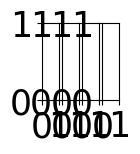

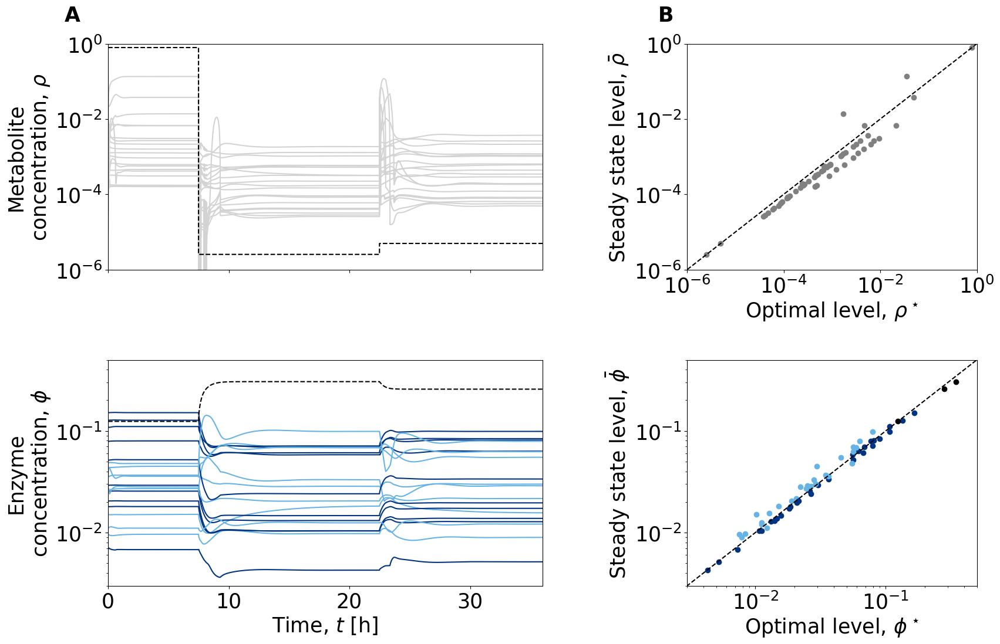

In [533]:
times = np.array(times)
savephis = np.array(savephis)
saverhos = np.array(saverhos)
times2 = np.array(times2)
savephis2 = np.array(savephis2)
saverhos2 = np.array(saverhos2)
times3 = np.array(times3)
savephis3 = np.array(savephis3)
saverhos3 = np.array(saverhos3)

alltimes = np.concatenate((times, times2+times[-1], times3+times2[-1]+times[-1]))
allphis = np.concatenate((savephis, savephis2, savephis3))
allrhos = np.concatenate((saverhos, saverhos2, saverhos3))

lammax = 1/np.sum(1/kappas)
Qs = np.sqrt(kappas*KMs)
qis = Qs/(np.sum(Qs/kappas)*lammax)

RYG = plt.cm.get_cmap('RdYlGn')


font = {'size'   : 25}
plt.rc('font', **font)
dt = 3e-5
fig, axs = plt.subplots(1, 4, figsize = (1, 1))
fig = plt.figure(figsize = (35, 12))
gs = gridspec.GridSpec(12, 11)
gs.update(wspace=0, hspace=0)

axs[1] = plt.subplot(gs[:5, 5:8])
ax1 = plt.subplot(gs[7:, 5:8])
ax2 = plt.subplot(gs[7:, 9:])
axs[2] = plt.subplot(gs[:5, 9:])
#axs[2, 2] = plt.subplot(gs[7:10, 9:])
#axs[3, 0] = plt.subplot(gs[11:13, 1:6])
#axs[3, 1] = plt.subplot(gs[11:13, 7:])
#axs[4, 0] = plt.subplot(gs[14:17, 1:4])
#axs[4, 1] = plt.subplot(gs[14:17, 5:8])
#axs[4, 2] = plt.subplot(gs[14:17, 9:])
isample = 0
xs = np.linspace(0, 0.5, 100)

vmin = -5
vmax = 1

if False:
    axs[0] = plt.subplot(gs[:6, 2:4])
    ax0 = plt.subplot(gs[6:, 2:4])
    j = 1
    axs[0].annotate("", xy = (j+0.8, 1), xytext = (j+0.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
    axs[0].annotate("", xy = (j+1.8, 1), xytext = (j+1.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
    axs[0].annotate("", xy = (j+1.4, .5), xytext = (j+1.1, 0.8), arrowprops=dict(arrowstyle="-|>", color='grey'))
    
    axs[0].plot(j+1-xs, (1.4+j**2*8*np.sqrt(0.27**2-(xs-0.27)**2))*1.3, "k--", linewidth = 7)
    axs[0].add_patch(plt.Polygon([[j+.88, 1], [j+1, 1.3], [j+1.12, 1], [j+1, 1/1.3]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((7-2.5*j)/(vmax-vmin))))
    axs[0].add_patch(plt.Polygon([[j+1-.16/j+.5-1, 2*1.3*j], [j+1-.16/j+.5-1, 2/1.3], [j+1+.16/j+.5-1, 2/1.3], [j+1+.16/j+.5-1, 2*1.3*j]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((5-2*j)/(vmax-vmin))))   
    axs[0].annotate("", xy = (j-1+1.6, 3.2), xytext = (j-1+1.4, 3.3), arrowprops=dict(arrowstyle="-", color='k', linewidth = 7))
    #axs[0].annotate(r"q>1", xy = (j+1.1, 5), xytext = (j+1.1, 5), arrowprops=dict(arrowstyle="-", color='white'))
    axs[0].text(1, 8, r"$q\gtrsim 1$, strong repression")
    
    
    axs[0].set_yscale("log")
    axs[0].set_xlim(1, 4)
    axs[0].set_ylim(0.2, 20)
    axs[0].axis("off")
    
    j = 2
    ax0.annotate("", xy = (j-1+0.8, 1), xytext = (j-1+0.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
    ax0.annotate("", xy = (j+.8, 1), xytext = (j+.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
    ax0.annotate("", xy = (j+.4, .5), xytext = (j+.1, 0.8), arrowprops=dict(arrowstyle="-|>", color='grey'))
    
    ax0.plot(j-xs, (1.4+j**2*8*np.sqrt(0.27**2-(xs-0.27)**2))*1.3, "k--", linewidth = 3)
    ax0.add_patch(plt.Polygon([[j-1+.88, 1], [j, 1.3], [j+.12, 1], [j, 1/1.3]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((7-2.5*j)/(vmax-vmin))))
    ax0.add_patch(plt.Polygon([[j-.16/j+.5-1, 2*1.3*j], [j-.16/j+.5-1, 2/1.3], [j+.16/j+.5-1, 2/1.3], [j+.16/j+.5-1, 2*1.3*j]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((5-2*j)/(vmax-vmin))))   
    ax0.annotate("", xy = (j-1+.6, 3.3*2), xytext = (j-1+.4, 3.4*2), arrowprops=dict(arrowstyle="-", color='k', linewidth = 3))
    #ax0.annotate("", xy = (j-1+.495, 3*2), xytext = (j-1+.505, 3.5*2), arrowprops=dict(arrowstyle="-|>", color='k', linewidth = 4))
    #ax0.annotate(r"q<1", xy = (j+.1, 5*3), xytext = (j+.1, 5*3), arrowprops=dict(arrowstyle="-", color='white'))
    ax0.text(1, 25, r"$q\lesssim 1$, weak repression")
    
    ax0.set_yscale("log")
    ax0.set_xlim(1, 4)
    ax0.set_ylim(0.4, 40)
    ax0.axis("off")


xs = np.linspace(0, 0.5, 100)


for i in range(Nenzymes-1):
    ax1.plot(alltimes, allphis[:, i], color = basecolors[int(qis[i]>1), 0])#RYG(np.log(qis)[i]/4+1/2))
    axs[1].plot(alltimes, allrhos[:, i], color = "lightgrey")

i = Nenzymes-1
ax1.plot(alltimes, allphis[:, i], color = "k", linestyle = "--")
axs[1].plot(alltimes, allrhos[:, i], color = "k", linestyle = "--")

ax1.set_yscale("log")
axs[1].set_yscale("log")
axs[1].set_xlabel("")
ax1.set_ylabel("Enzyme\n"+r"concentration, $\phi$")
axs[1].set_ylabel("Metabolite\n"+r"concentration, $\rho$")
ax1.set_ylim(3e-3, 5e-1)
axs[1].set_ylim(1e-6, 1e0)
ax1.set_xlabel("Time, $t$ [h]")
axs[1].set_xlim(0, 36)
ax1.set_xlim(0, 36)
axs[1].set_xticklabels([])

axs[2].scatter(richref[3], rhos, color = "grey")
axs[2].scatter(ref[3], rhos2, color = "grey")
axs[2].scatter(ref2[3], rhos3, color = "grey")
axs[2].plot([1e-6, 1], [1e-6, 1], "k--")
axs[2].set_xscale("log")
axs[2].set_yscale("log")
axs[2].set_xlim(1e-6, 1)
axs[2].set_ylim(1e-6, 1)
axs[2].set_ylabel(r"Steady state level, $\bar \rho$")
axs[2].set_xlabel(r"Optimal level, $\rho^\star$")
#axs[3].set_xlabel("Optimal resource allocation")
#axs[3].set_ylabel("Regulatory steady state")

for i in range(Nenzymes-1):
    ax2.scatter(richref[4, i], phis[i], color = basecolors[int(qis[i]>1), 0])
    ax2.scatter(ref[4, i], phis2[i], color = basecolors[int(qis[i]>1), 0])
    ax2.scatter(ref2[4, i], phis3[i], color = basecolors[int(qis[i]>1), 0])
    
i = Nenzymes -1
ax2.scatter(richref[4, i], phis[i], color = "k")
ax2.scatter(ref[4, i], phis2[i], color = "k")
ax2.scatter(ref2[4, i], phis3[i], color = "k")

ax2.plot([1e-3, 1], [1e-3, 1], "k--")
ax2.set_xscale("log")
ax2.set_yscale("log")
ax2.set_xlim(3e-3, 5e-1)
ax2.set_ylim(3e-3, 5e-1)
ax2.set_xlabel(r"Optimal level, $\phi^\star$")
ax2.set_ylabel(r"Steady state level, $\bar \phi$")
#ax2.yaxis.set_label_coords(-0.25, 1.25)

#fig.tight_layout()
for n, ax in enumerate([axs[1], axs[2]]): 
    ax.text(-0.1, 1.1, string.ascii_uppercase[n], transform=ax.transAxes, weight='bold')

plt.savefig("/Users/leonseeger/Dropbox/EffluxPumpsLeon/Draft/CommentingVersion/SIRegulation.pdf", bbox_inches="tight", format = 'pdf')

[0.13269456 0.16663648 0.2222988  0.33782167 0.3       ]
[0.13269432 0.16663608 0.22229802 0.0613737 ]
0.5049895030426061
[0.17711097 0.18305207 0.19026273 0.1991733  0.25040093]
1.0 0.9999999999999999
[0.57359603 0.41198841 0.26555711 0.1346624  0.01      ] [0.60093461 0.43162494 0.27821484 0.01      ]


Text(711.5108695652175, 0.5, 'Mass, $M_i$')

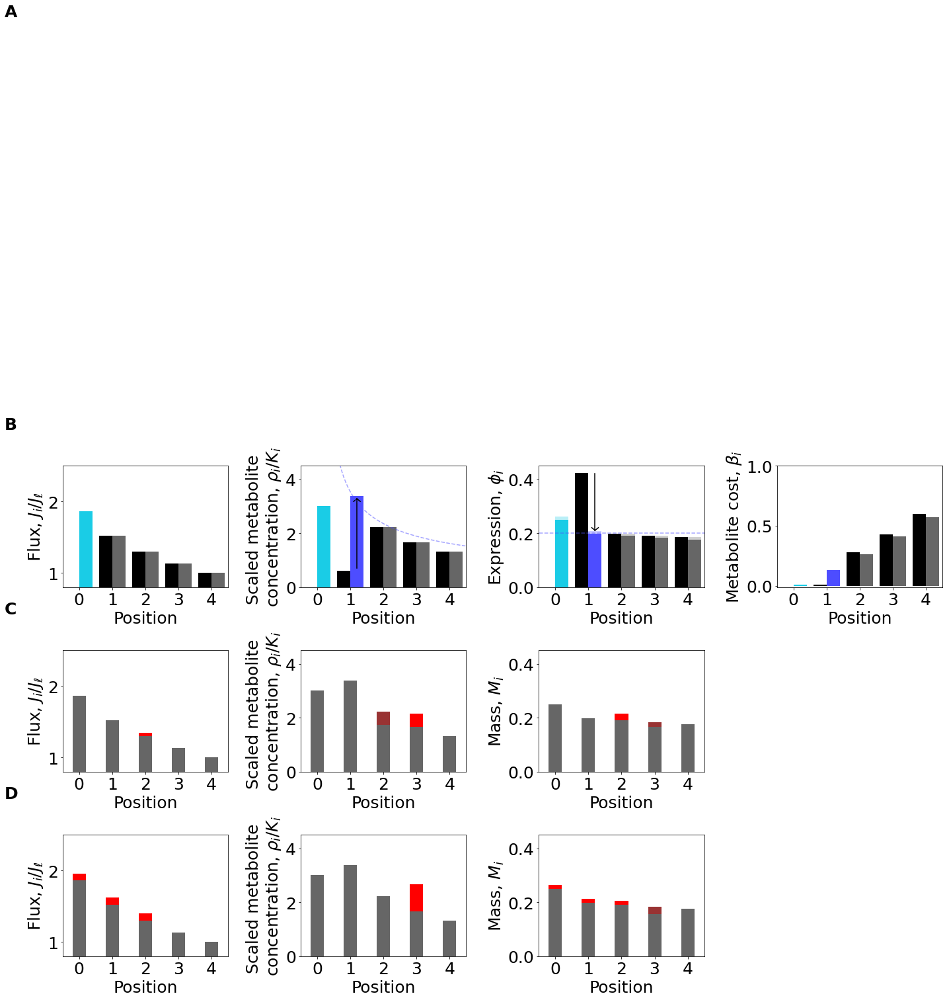

In [332]:
font = {'size'   : 25}
plt.rc('font', **font)

fig, axs =plt.subplots(3, 4, figsize = (20, 12), gridspec_kw={'width_ratios': [5, 5, 5, 5]})

KMmean = 0.1
kappamean = 100
nu = 0.3
Nenzymes = 5

kappas = np.ones(Nenzymes)*kappamean #
KMs = np.ones(Nenzymes)*KMmean #
lamapprox = np.sum(kappas**(-1))**(-1)

args = np.array([*kappas, *KMs, nu, lamapprox])

res = minimize(wrapper3, -5, args = args)
rhos = rhoIterator(kappas, KMs, nu, np.exp(res.x[0]))
phis = findPhis(kappas, KMs, rhos)
jouts = phis*kappas/(1+KMs/rhos)

nu2 = nu*0.204579#nu*0.27539518 #nu*0.204579
args2 = np.array([*kappas[:-1], *KMs[:-1], nu2, lamapprox])

Nenzymes = 4
res2 = minimize(wrapper3, -5, args = args2)
Nenzymes = 5

rhos2 = rhoIterator(kappas[:-1], KMs[:-1], nu2, np.exp(res2.x[0]))
phis2 = findPhis(kappas[:-1], KMs[:-1], rhos2)
jouts2 = phis2*kappas[:-1]/(1+KMs[:-1]/rhos2)

print(rhos)
print(rhos2)

lambdasup = np.sum(kappas**(-1))**(-1)
print(jouts[0]/lambdasup)

w = 0.4

for row in range(3):
    axs[row, 0].set_xlabel("Position")
    axs[row, 0].set_xlim((-.5, Nenzymes-0.5))
    axs[row, 0].set_ylabel(r"Flux, $J_i/J_\ell$")
    #axs[row, 0].set_yscale("log")
    axs[row, 0].set_ylim((.8, 2.5))

    axs[row, 1].set_xlabel("Position")
    axs[row, 1].set_xlim((-.5, Nenzymes-0.5))
    axs[row, 1].set_ylabel("Scaled metabolite \n"r"concentration, $\rho_i/K_i$")
    axs[row, 1].set_ylim((0, 4.5))

    axs[row, 2].set_xlabel("Position")
    axs[row, 2].set_xlim((-.5, Nenzymes-0.5))
    axs[row, 2].set_ylabel(r"Expression, $\phi_i$")
    #axs[row, 2].set_yscale("log")
    axs[row, 2].set_ylim((0., .45))

    axs[row, 3].set_xlabel("Position")
    axs[row, 3].set_xlim((-.5, Nenzymes-0.5))
    axs[row, 3].set_ylabel(r"Metabolite cost, $\beta_i$")
    axs[row, 3].set_ylim((-0.01, 1))

print(phis)

print(np.sum(phis), np.sum(phis2))

cost = phis/KMs/(rhos/KMs*(1+rhos/KMs))
cost[-1] = 1e-2

cost2 = phis2/KMs[:-1]/(rhos2/KMs[:-1]*(1+rhos2/KMs[:-1]))
cost2[-1] = 1e-2
print(cost, cost2)

axs[0, 0].bar(np.arange(Nenzymes)[::-1]+w/2, jouts/jouts[0], width = w, color = (0.4, 0.4, .4, 1))
#axs[0, 0].bar(1+w/2, (jouts/jouts[0])[-2], width = w, color = (0.3, 0.3, 1, 1))
axs[0, 0].bar(0+w/2, (jouts/jouts[0])[-1], width = w, color = (0.1, 0.8, 0.9, 1))
axs[0, 0].bar(np.arange(Nenzymes)[:0:-1]-w/2, jouts2/jouts2[0], width = w, color = "black")

axs[0, 1].bar(np.arange(Nenzymes)[::-1]+w/2, rhos/KMs, width = w, color = (0.4, 0.4, .4, 1))
axs[0, 1].bar(1+w/2, (rhos/KMs)[-2], width = w, color = (0.3, 0.3, 1, 1))
axs[0, 1].bar(0+w/2, (rhos/KMs[0])[-1], width = w, color = (0.1, 0.8, 0.9, 1))
axs[0, 1].bar(np.arange(Nenzymes)[:0:-1]-w/2, rhos2/KMs[:-1], width = w, color = "black")
axs[0, 1].plot(np.linspace(1+w/2, 1+w/2, 100), np.linspace(rhos[-2]/KMs[0]-.1, rhos2[-1]/KMs[0]+.1,100), "k-")
axs[0, 1].plot(np.linspace(1+w/2, 1.1+w/2, 2), np.linspace(rhos[-2]/KMs[0], rhos[-2]/KMs[0]-.1, 2)-.1, "k-")
axs[0, 1].plot(np.linspace(1+w/2, .9+w/2, 2), np.linspace(rhos[-2]/KMs[0], rhos[-2]/KMs[0]-.1, 2)-.1, "k-")
axs[0, 1].plot(np.linspace(0, 5, 100)+w/2, 1/np.sqrt(KMmean*np.linspace(0, 5, 100)), "--", color = (0.3, 0.3, 1, 1), alpha = 0.5)

axs[0, 2].bar(np.arange(Nenzymes)[::-1]+w/2, phis, width = w, color = (0.4, 0.4, .4, 1))
axs[0, 2].bar(1+w/2, phis[-2], width = w, color = (0.3, 0.3, 1, 1))
axs[0, 2].bar(0+w/2, phis[-1], width = w, color = (0.1, 0.8, 0.9, 1))
axs[0, 2].bar((np.arange(Nenzymes)[::-1]+w/2)[:-2], (phis*phis2[0]/phis[0])[:-2], width = w, color = (0.4, 0.4, .4, 1), alpha = 0.3)
axs[0, 2].bar(1+w/2, (phis*phis2[0]/phis[0])[-2], width = w, color = (0.3, 0.3, 1, 1), alpha = 0.3)
axs[0, 2].bar(0+w/2, (phis*phis2[0]/phis[0])[-1], width = w, color = (0.1, 0.8, 0.9, 1), alpha = 0.3)
#axs[0, 2].bar(np.arange(Nenzymes)[::-1]+w/2, phis*phis2[0]/phis[0], width = w, color = "orange", alpha = 0.3)
axs[0, 2].bar(np.arange(Nenzymes)[:0:-1]-w/2, phis2, width = w, color = "black", alpha = 1.0)
axs[0, 2].plot(np.linspace(-1, 5.5, 100)+w/2, [1/5]*100, "--", color = (0.3, 0.3, 1, 1), alpha = 0.5)
axs[0, 2].plot(np.linspace(1+w/2, 1+w/2, 100), np.linspace(phis[-2]*phis2[0]/phis[0]+0.002, phis2[-1]-.002,100), "k-")
axs[0, 2].plot(np.linspace(1+w/2, 1.1+w/2, 2), np.linspace(phis[-2]*phis2[0]/phis[0], phis[-2]*phis2[0]/phis[0]+0.01, 2)+0.002, "k-")
axs[0, 2].plot(np.linspace(1+w/2, .9+w/2, 2), np.linspace(phis[-2]*phis2[0]/phis[0], phis[-2]*phis2[0]/phis[0]+0.01, 2)+0.002, "k-")

axs[0, 3].bar(np.arange(Nenzymes)[::-1]+w/2, cost, width = w, color = (0.4, 0.4, .4, 1))
axs[0, 3].bar(1+w/2, cost[-2], width = w, color = (0.3, 0.3, 1, 1))
axs[0, 3].bar(0+w/2, cost[-1], width = w, color = (0.1, 0.8, 0.9, 1))
axs[0, 3].bar(np.arange(Nenzymes)[:0:-1]-w/2, cost2, width = w, color = "black")

for ax in axs.flatten():
    ax.set_xticks([0, 1, 2, 3, 4])
    ax.set_xticklabels([0, 1, 2, 3, 4])

fig.tight_layout()

for n, ax in enumerate([axs[0, 0], axs[1, 0], axs[2, 0]]):  
    ax.text(-0.35, 1.30, string.ascii_uppercase[n+1], transform=ax.transAxes, weight='bold')

axs[0, 0].text(-0.35, 4.70, string.ascii_uppercase[0], transform=axs[0, 0].transAxes, weight='bold')


deltaj = .5
newjouts = np.copy(jouts)
newjouts[2] = newjouts[2]+deltaj
newrhos = np.copy(rhos)
newrhos[:-1] = (newjouts[1:]-newjouts[:-1])/newjouts[0]
newphis = newjouts/kappas*(1+KMs/newrhos)

axs[1, 0].bar(np.arange(Nenzymes)[::-1], newjouts/newjouts[0], width = w, color = (1, 0, 0, 1))
axs[1, 1].bar(np.arange(Nenzymes)[::-1], newrhos/KMs, width = w, color = (1, 0, 0, 1))
axs[1, 2].bar(np.arange(Nenzymes)[::-1], newphis, width = w, color = (1, 0, 0, 1))

axs[1, 0].bar(np.arange(Nenzymes)[::-1], jouts/jouts[0], width = w, color = (0.6, 0.2, .2, 1))
axs[1, 1].bar(np.arange(Nenzymes)[::-1], rhos/KMs, width = w, color = (0.6, 0.2, .2, 1))
axs[1, 2].bar(np.arange(Nenzymes)[::-1], phis, width = w, color = (0.6, 0.2, .2, 1))

axs[1, 0].bar(np.arange(Nenzymes)[::-1], np.min(np.array([jouts/jouts[0], newjouts/newjouts[0]]), 0), width = w, color = (0.4, .4, .4, 1))
axs[1, 1].bar(np.arange(Nenzymes)[::-1], np.min(np.array([rhos/KMs, newrhos/KMs]), 0), width = w, color = (0.4, .4, .4, 1))
axs[1, 2].bar(np.arange(Nenzymes)[::-1], np.min(np.array([phis, newphis]), 0), width = w, color = (0.4, .4, .4, 1))

axs[1, 3].axis("off")#bar(np.arange(Nenzymes)[::-1], cost, width = w, color = (0.4, 0.4, .4, 1))
axs[1, 2].set_ylabel(r"Mass, $M_i$")

deltaj = 1
newjouts = np.copy(jouts)
newjouts[2:] = newjouts[2:]+deltaj
newrhos = np.copy(rhos)
newrhos[:-1] = (newjouts[1:]-newjouts[:-1])/newjouts[0]
newphis = newjouts/kappas*(1+KMs/newrhos)

axs[2, 0].bar(np.arange(Nenzymes)[::-1], newjouts/newjouts[0], width = w, color = (1, 0, 0, 1))
axs[2, 1].bar(np.arange(Nenzymes)[::-1], newrhos/KMs, width = w, color = (1, 0, 0, 1))
axs[2, 2].bar(np.arange(Nenzymes)[::-1], newphis, width = w, color = (1, 0, 0, 1))

axs[2, 0].bar(np.arange(Nenzymes)[::-1], jouts/jouts[0], width = w, color = (0.6, 0.2, .2, 1))
axs[2, 1].bar(np.arange(Nenzymes)[::-1], rhos/KMs, width = w, color = (0.6, 0.2, .2, 1))
axs[2, 2].bar(np.arange(Nenzymes)[::-1], phis, width = w, color = (0.6, 0.2, .2, 1))

axs[2, 0].bar(np.arange(Nenzymes)[::-1], np.min(np.array([jouts/jouts[0], newjouts/newjouts[0]]), 0), width = w, color = (0.4, .4, .4, 1))
axs[2, 1].bar(np.arange(Nenzymes)[::-1], np.min(np.array([rhos/KMs, newrhos/KMs]), 0), width = w, color = (0.4, .4, .4, 1))
axs[2, 2].bar(np.arange(Nenzymes)[::-1], np.min(np.array([phis, newphis]), 0), width = w, color = (0.4, .4, .4, 1))

axs[2, 3].axis("off")#bar(np.arange(Nenzymes)[::-1], cost, width = w, color = (0.4, 0.4, .4, 1))
axs[2, 2].set_ylabel(r"Mass, $M_i$")

#plt.savefig("/Users/leonseeger/Dropbox/EffluxPumpsLeon/Draft/CommentingVersion/SI_schematic_barplots.pdf", bbox_inches="tight", format = 'pdf')

### the rest of this figure was created in vectornator, not with python

(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)
(5000, 3, 6, 1, 20)
(5000, 1, 20)


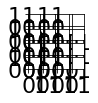

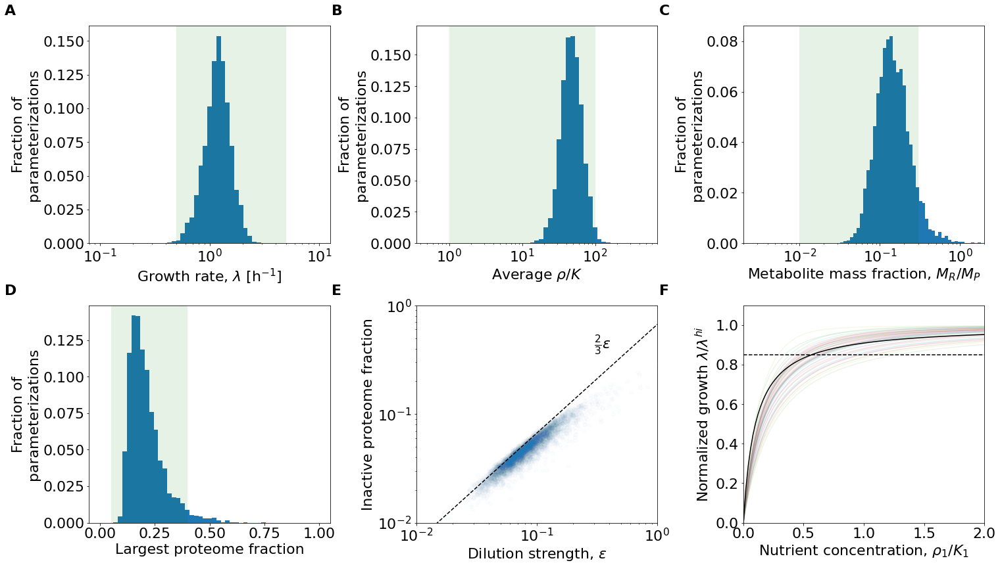

In [361]:
font = {'size'   : 22}
plt.rc('font', **font)


#fig, axs = plt.subplots(2, 2, figsize = (10, 10))
Nenzymes = 20

fig, axs = plt.subplots(4, 4, figsize = (1, 1))
fig = plt.figure(figsize = (35, 12))
gs = gridspec.GridSpec(2, 5)
#gs.update(wspace=0, hspace=0.15)
axs[0, 0] = plt.subplot(gs[0, 0])
axs[0, 1] = plt.subplot(gs[0, 1])
axs[0, 2] = plt.subplot(gs[0, 2])
axs[1, 0] = plt.subplot(gs[1, 0])
axs[1, 1] = plt.subplot(gs[1, 1])
axs[1, 2] = plt.subplot(gs[1, 2])

filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

print(np.shape(fullensemble))


efficiencybins = np.logspace(-1, 1, 6)

ilocs = []
ensemble = []

for j in range(np.shape(fullensemble)[0]):
    maxgr = fullensemble[j, 0, 5, 0]
    halfgrs = (fullensemble[j, :, 5, 0].T-maxgr/2.1).T
    halfgrs[halfgrs<=0] = np.max(halfgrs)
    tenthgrs = (fullensemble[j, :, 5, 0].T-maxgr/10.1).T
    tenthgrs[tenthgrs<=0] = np.max(tenthgrs)
    
    iloc = np.where(halfgrs == np.nanmin(halfgrs))
    iloc10 = np.where(tenthgrs == np.nanmin(tenthgrs))
    ilocs.append(iloc[0][0])
    ensemble.append(np.array([fullensemble[j, 0], fullensemble[j, iloc[0][0]], fullensemble[j, iloc10[0][0]]]))
    #print(np.shape(np.array([ensemble[j, 0], ensemble[j, iloc]])))

ilocs = np.array(ilocs)
ensemble = np.array(ensemble)[:, :, :, None, :]

#print(np.shape(smallensemble))
efficiencies = (np.sum(fullensemble[:, 0, 0, :]**(-1), 1)/np.sum(np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]), 1)*np.sqrt(fullensemble[:, 0, 1, :]*fullensemble[:, 0, 0, :]).T).T
efficiencies = efficiencies[:, None, :]
print(np.shape(ensemble))
print(np.shape(efficiencies))


#what are high proteome mass fractions of the largest enzyme correlated with
#fig, axs = plt.subplots(2, 2, figsize = (15, 14))
axs[0, 0].hist(ensemble[:, 0, 5, 0, 0]*10**(-.5), bins = np.logspace(np.log10(0.1), np.log10(10), 50), weights = 0*ensemble[:, 0, 5, 0, 0]+1/(np.shape(ensemble[:, 0, 5, 0, 0])[0]))
axs[0, 0].set_xscale("log")
axs[0,0].set_xlabel("Growth rate, $\lambda$ [h$^{-1}$]")
limits = axs[0,0].get_ylim()
axs[0,0].add_patch(plt.Polygon([[.5, limits[0]], [.5, limits[1]], [5, limits[1]], [5, limits[0]]], facecolor='green', clip_on = True, linewidth = 0, alpha = .1))
axs[0,0].set_ylabel("Fraction of\nparameterizations")

axs[0,1].hist(np.exp(np.mean(np.log(ensemble[:, 0, 3, 0, :]/ensemble[:, 0, 1, 0, :]), 1)), bins = np.logspace(np.log10(.5), np.log10(500), 50), weights = 0*ensemble[:, 0, 5, 0, 0]+1/(np.shape(ensemble[:, 0, 5, 0, 0])[0]))
#axs[0,1].hist(np.mean(1/(1+1/(ensemble[:, 0, 3, 0, :]/ensemble[:, 0, 1, 0, :])), 1), bins = np.linspace(0, 1, 200), weights = 0*ensemble[:, 0, 5, 0, 0]+1/(np.shape(ensemble[:, 0, 5, 0, 0])[0]))
#axs[0,1].hist((ensemble[:, 0, 3, 0, :]/ensemble[:, 0, 1, 0, :]).flatten(), bins = np.logspace(np.log10(.5), np.log10(500), 50))
axs[0,1].set_xscale("log")
#axs[0,1].set_xlabel("Average saturation")
axs[0,1].set_xlabel(r"Average $\rho/K$")#scaled metabolite concentration, 
limits = axs[0,1].get_ylim()
#axs[0,1].set_xlim(0.7, 1)
#axs[0,1].add_patch(plt.Polygon([[0.8, limits[0]], [0.8, limits[1]], [0.95, limits[1]], [0.95, limits[0]]], facecolor='green', clip_on = True, linewidth = 0, alpha = .1))
axs[0,1].add_patch(plt.Polygon([[1, limits[0]], [1, limits[1]], [100, limits[1]], [100, limits[0]]], facecolor='green', clip_on = True, linewidth = 0, alpha = .1))
axs[0,1].set_ylabel("Fraction of\nparameterizations")

axs[0,2].hist(np.sum(ensemble[:, 0, 3, 0, :-1], 1), bins = np.logspace(np.log10(0.02), np.log10(2), 50), weights = 0*ensemble[:, 0, 5, 0, 0]+1/(np.shape(ensemble[:, 0, 5, 0, 0])[0]))
#axs[0,2].hist(np.sum(ensemble[:, 0, 3, 0, :-1], 1), bins = np.logspace(np.log10(0.001), np.log10(2), 50))
axs[0,2].set_xscale("log")
axs[0,2].set_xlabel("Metabolite mass fraction, $M_R/M_P$")
axs[0,2].set_xlim(2e-3, 2)
limits = axs[0,2].get_ylim()
axs[0,2].add_patch(plt.Polygon([[.01, limits[0]], [.01, limits[1]], [.3, limits[1]], [.3, limits[0]]], facecolor='green', clip_on = True, linewidth = 0, alpha = .1))
axs[0,2].set_ylabel("Fraction of\nparameterizations")

axs[1,0].hist(np.max(ensemble[:, 0, 4, 0, :], 1), bins = np.linspace(0, 1, 50), weights = 0*ensemble[:, 0, 5, 0, 0]+1/(np.shape(ensemble[:, 0, 5, 0, 0])[0]))
#axs[1,0].hist(np.max(ensemble[:, 0, 4, 0, :], 1), bins = np.linspace(0, 1, 50))
axs[1,0].set_xlabel("Largest proteome fraction")
limits = axs[1,0].get_ylim()
axs[1,0].add_patch(plt.Polygon([[.4, limits[0]], [.4, limits[1]], [.05, limits[1]], [.05, limits[0]]], facecolor='green', clip_on = True, linewidth = 0, alpha = .1))
axs[1,0].set_ylabel("Fraction of\nparameterizations")

epsilons = np.sqrt(np.sum(fullensemble[:, 0, 1, :-1], axis = 1))
epsilons2 = np.sum(np.sqrt(fullensemble[:, 0, 1, :-1]*fullensemble[:, 0, 4, :-1]), axis = 1)


#axs[1,1].scatter(2/3*epsilons, np.sum(fullensemble[:, 0, 4, :-1]*(1-1/(1+fullensemble[:, 0, 1, :-1]/fullensemble[:, 0, 3, :-1])), axis = 1), alpha = 0.01)
axs[1,1].scatter(epsilons2, np.sum(fullensemble[:, 0, 4, :-1]*(1-1/(1+fullensemble[:, 0, 1, :-1]/fullensemble[:, 0, 3, :-1])), axis = 1), alpha = 0.01)
axs[1,1].set_xscale("log")
axs[1,1].set_yscale("log")
axs[1,1].set_xlabel(r"Dilution strength, $\epsilon$")
axs[1,1].set_ylabel("Inactive proteome fraction")
axs[1,1].plot([1e-2, 3e0], [1e-2*2/3, 3e0*2/3], "k--")
axs[1,1].text(3e-1, 4e-1, r"$\frac{2}{3}\epsilon$")
axs[1,1].set_xlim(1e-2, 1e0)
axs[1,1].set_ylim(1e-2, 1e0)
                 
axs[1,2].plot(fullensemble[::101, :, 3, -1].T/fullensemble[::101, 0, 1, -1], fullensemble[::101, :, 5, 0].T/fullensemble[::101, 0, 5, 0], alpha =0.1)
axs[1,2].set_xlim(0, 2)
axs[1,2].set_ylim(0, 1.1)
axs[1,2].set_xlabel(r"Nutrient concentration, $\rho_1/K_1$")
axs[1,2].set_ylabel(r"Normalized growth $\lambda/\lambda^{hi}$")
K = 1/10
axs[1,2].plot(np.linspace(0, 2, 100), 1/(1+K/np.linspace(0, 2, 100)), "k-")
axs[1,2].plot([0, 2], [1-0.1-1/Nenzymes]*2, "k--")

fig.tight_layout()

for n, ax in enumerate([axs[0,0], axs[0,1], axs[0,2], axs[1,0], axs[1,1], axs[1,2]]):  
    ax.text(-0.35, 1.05, string.ascii_uppercase[n], transform=ax.transAxes, weight='bold')


#plt.savefig("/Users/leonseeger/Dropbox/EffluxPumpsLeon/Draft/CommentingVersion/SI_validity.pdf", bbox_inches="tight", format = 'pdf')
#effect of saturation is negligible - the largest mass fraction is given by max(1/kappa/(sum(1/kappa)))

In [346]:
###Analytical solution for the nutrient-limiting boundary condition
def ConstrainedIterator(kappas, KMs, rho0approx, phiup_0, eps):
    rhos = rhoIteratorInternal(kappas, KMs, rho0approx)
    KM1 = KMs[-1]
    kappa1 = kappas[-1]
    phi1 = phiup_0
    Js = np.cumsum(rhos)-rhos+1
    Ms = Js/kappas[:-1]*(1+KMs[:-1]/rhos)
    sumM = np.sum(Ms)
    J1 = Js[-1]+rhos[-1]
    nu = -((J1*KM1*(-1 + phi1 + eps*phi1))/((1 + eps)*(J1*(-1 + phi1) + kappa1*phi1*sumM)))
    #nu1 = (-J1*KM1-eps*J1*KM1+J1*KM1*phi1+eps*J1*KM1*phi1+eps*J1*KM1*phi1+kappa1*KM1*phi1*sumM+eps*kappa1*KM1*phi1*sumM-np.sqrt(-4*(J1*KM1**2-J1*KM1**2*phi1-eps*J1*KM1**2*phi1)*(eps*J1-eps*J1*phi1-eps*kappa1*phi1*sumM)+(J1*KM1+eps*J1*KM1-J1*KM1*phi1-eps*J1*KM1*phi1-eps*J1*KM1*phi1-kappa1*KM1*phi1*sumM-eps*kappa1*KM1*phi1*sumM)**2))/(2*(eps*J1-eps*J1*phi1-eps*kappa1*phi1*sumM))
    #nu2 = (-J1*KM1-eps*J1*KM1+J1*KM1*phi1+eps*J1*KM1*phi1+eps*J1*KM1*phi1+kappa1*KM1*phi1*sumM+eps*kappa1*KM1*phi1*sumM+np.sqrt(-4*(J1*KM1**2-J1*KM1**2*phi1-eps*J1*KM1**2*phi1)*(eps*J1-eps*J1*phi1-eps*kappa1*phi1*sumM)+(J1*KM1+eps*J1*KM1-J1*KM1*phi1-eps*J1*KM1*phi1-eps*J1*KM1*phi1-kappa1*KM1*phi1*sumM-eps*kappa1*KM1*phi1*sumM)**2))/(2*(eps*J1-eps*J1*phi1-eps*kappa1*phi1*sumM))
    #print(nu-nu1, nu-nu2)
    #nu = max(nu1, nu2)
    rhos = np.append(rhos, nu)
    return rhos


#fig, axs = plt.subplots(5, 2, figsize = (18, 15))


Nenzymes = 20
font = {'size'   : 30} #25#20
plt.rc('font', **font)

filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

print(np.shape(fullensemble))

efficiencybins = np.logspace(-2.2 , 2.2, 12)#np.logspace(-1, 1, 6)
efficiencybins2 = np.copy(efficiencybins)
ilocs = []
ensemble = []

for j in range(np.shape(fullensemble)[0]):
    maxgr = fullensemble[j, 0, 5, 0]
    halfgrs = (fullensemble[j, :, 5, 0].T-maxgr/1.05).T
    halfgrs[halfgrs<=0] = np.max(halfgrs)
    tenthgrs = (fullensemble[j, :, 5, 0].T-maxgr/10.1).T
    tenthgrs[tenthgrs<=0] = np.max(tenthgrs)
    
    iloc = np.where(halfgrs == np.nanmin(halfgrs))
    iloc10 = np.where(tenthgrs == np.nanmin(tenthgrs))
    ilocs.append(iloc[0][0])
    ensemble.append(np.array([fullensemble[j, 0], fullensemble[j, iloc[0][0]], fullensemble[j, iloc10[0][0]]]))
    #print(np.shape(np.array([ensemble[j, 0], ensemble[j, iloc]])))

ilocs = np.array(ilocs)
ensemble = np.array(ensemble)[:, :, :, None, :]

#print(np.shape(smallensemble))
efficiencies = np.sqrt(fullensemble[:, 0, 0, :].T*fullensemble[:, 0, 1, :].T/fullensemble[:, 0, 5, 0]).T/np.sqrt(KMmean*Nenzymes)
#efficiencies = (np.sum(fullensemble[:, 0, 0, :]**(-1), 1)/np.sum(np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]), 1)*np.sqrt(fullensemble[:, 0, 1, :]*fullensemble[:, 0, 0, :]).T).T
efficiencies = efficiencies[:, None, :]
print(np.shape(ensemble))
print(np.shape(efficiencies))

shift = 0
colors = ["k", "r"]
effs = ["L", "H"]
effcolors = ["b", "orange"]
linewidths = [4, 1]
colorsPhi = np.array([["darkblue", "darkblue"], ["cyan", "cyan"]])

for gr in range(2):

    branch = 0
    colormeshrho = np.zeros((Nenzymes, np.shape(efficiencybins)[0]-1))
    colormeshphi = np.zeros((Nenzymes, np.shape(efficiencybins)[0]-1))
    for i in range(np.shape(efficiencybins)[0]-1):
        mask = (efficiencies[:, branch, :]>efficiencybins[i])*(efficiencies[:, branch, :]<=efficiencybins[i+1])
        fullmask = mask[:, None, None, :]*np.ones((np.shape(ensemble)[1], np.shape(ensemble)[2]))[None, :, :, None]
        maskeddata = np.where(fullmask, ensemble[:, :, :, branch, :], np.nan)
        logsaturation = np.log10(maskeddata[:, gr, 3, :]/maskeddata[:, 0, 1, :])
        logexpression = np.log10(maskeddata[:, gr, 4, :]/maskeddata[:, 0, 1, :])
        colormeshrho[:, i] = np.nanmean(logsaturation, 0)
        colormeshphi[:, i] = np.nanmean(logexpression, 0)
    

x9, y9, z9 = np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins2[1:]*efficiencybins2[:-1]), colormeshrho.T
x10, y10, z10 = np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins2[1:]*efficiencybins2[:-1]), colormeshphi.T

#### Linear Chain
#fig, axs = plt.subplots(2, 2, figsize = (10, 10))
Nenzymes = 20
font = {'size'   : 30} #25#20
plt.rc('font', **font)

filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

print(np.shape(fullensemble))

efficiencybins = np.logspace(-2.2 , 2.2, 12)#np.logspace(-1, 1, 6)
efficiencybins2 = np.copy(efficiencybins)
ilocs = []
ensemble = []

for j in range(np.shape(fullensemble)[0]):
    maxgr = fullensemble[j, 0, 5, 0]
    halfgrs = (fullensemble[j, :, 5, 0].T-maxgr/2.1).T
    halfgrs[halfgrs<=0] = np.max(halfgrs)
    tenthgrs = (fullensemble[j, :, 5, 0].T-maxgr/10.1).T
    tenthgrs[tenthgrs<=0] = np.max(tenthgrs)
    
    iloc = np.where(halfgrs == np.nanmin(halfgrs))
    iloc10 = np.where(tenthgrs == np.nanmin(tenthgrs))
    ilocs.append(iloc[0][0])
    ensemble.append(np.array([fullensemble[j, 0], fullensemble[j, iloc[0][0]], fullensemble[j, iloc10[0][0]]]))
    #print(np.shape(np.array([ensemble[j, 0], ensemble[j, iloc]])))

ilocs = np.array(ilocs)
ensemble = np.array(ensemble)[:, :, :, None, :]

#print(np.shape(smallensemble))
efficiencies = np.sqrt(fullensemble[:, 0, 0, :].T*fullensemble[:, 0, 1, :].T/fullensemble[:, 0, 5, 0]).T/np.sqrt(KMmean*Nenzymes)
#efficiencies = (np.sum(fullensemble[:, 0, 0, :]**(-1), 1)/np.sum(np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]), 1)*np.sqrt(fullensemble[:, 0, 1, :]*fullensemble[:, 0, 0, :]).T).T
efficiencies = efficiencies[:, None, :]

for gr in range(2):

    branch = 0
    colormeshrho = np.zeros((Nenzymes, np.shape(efficiencybins)[0]-1))
    colormeshphi = np.zeros((Nenzymes, np.shape(efficiencybins)[0]-1))
    for i in range(np.shape(efficiencybins)[0]-1):
        mask = (efficiencies[:, branch, :]>efficiencybins[i])*(efficiencies[:, branch, :]<=efficiencybins[i+1])
        fullmask = mask[:, None, None, :]*np.ones((np.shape(ensemble)[1], np.shape(ensemble)[2]))[None, :, :, None]
        maskeddata = np.where(fullmask, ensemble[:, :, :, branch, :], np.nan)
        logsaturation = np.log10(maskeddata[:, gr, 3, :]/maskeddata[:, 0, 1, :])
        logexpression = np.log10(maskeddata[:, gr, 4, :]/maskeddata[:, 0, 1, :])
        colormeshrho[:, i] = np.nanmean(logsaturation, 0)
        colormeshphi[:, i] = np.nanmean(logexpression, 0)
    

    meanN = np.nanmean(np.log10(ensemble[:, :, 4, 0, :]/ensemble[:, :, 1, 0, :]))
    stdN = np.nanstd(np.log10(ensemble[:, :, 4, 0, :]/ensemble[:, :, 1, 0, :]))
    
    efficiencybins3 = np.logspace(-5, 5, 3)
    meanNs = []
    stdNs = []
    meanNs2 = []
    stdNs2 = []
    piefractions = []
    for i in range(np.shape(efficiencybins3)[0]-1):
        #if i%6==3:
        mask = (efficiencies[:, branch, :]>efficiencybins3[i])*(efficiencies[:, branch, :]<=efficiencybins3[i+1])
        fullmask = mask[:, None, None, :]*np.ones((np.shape(ensemble)[1], np.shape(ensemble)[2]))[None, :, :, None]
        maskeddata = np.where(fullmask, ensemble[:, :, :, branch, :], np.nan)
        logsaturation = np.log10(maskeddata[:, gr, 3, :]/maskeddata[:, 0, 1, :])
        logexpression = np.log10(maskeddata[:, gr, 4, :]/maskeddata[:, 0, 1, :])
        meanNs.append(10**np.nanmean(logsaturation, 0))
        stdNs.append(10**np.nanstd(logsaturation, 0))
        meanNs2.append(10**(np.nanmean(logexpression, 0)))
        stdNs2.append(10**(np.nanstd(logexpression, 0)))
        
    x7, y7, z7 = np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins2[1:]*efficiencybins2[:-1]), colormeshrho.T
    x8, y8, z8 = np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins2[1:]*efficiencybins2[:-1]), colormeshphi.T


(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)
(5000, 3, 6, 1, 20)
(5000, 1, 20)
(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)


-7.722557541502939
-7.722557541502939


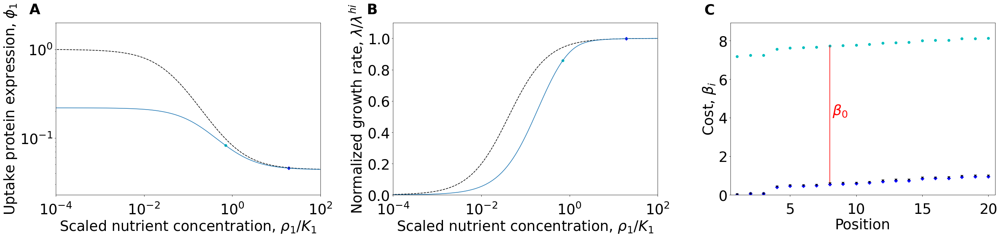

In [350]:
### The role of the nutrient for a single chain
font = {'size'   : 35}
plt.rc('font', **font)

fig, axs =plt.subplots(1, 3, figsize = (35, 9))


Nenzymes = 20

kappamean = 130
KMmean = .0001

kappas = fullensemble[0, 0, 0, :]#np.random.lognormal(np.log(kappamean), 3, Nenzymes) #np.ones(Nenzymes)*kappamean #
KMs = fullensemble[0, 0, 1, :]# np.random.lognormal(np.log(KMmean), 2.5, Nenzymes) #np.ones(Nenzymes)*KMmean #
#bs = fullensemble[0, 0, 2, :]#np.ones(Nenzymes)
nu = fullensemble[0, 0, 3, -1]*100#200*KMs[-1] #0.03*KMmean
lamapprox = fullensemble[0, 0, 5, 0]
phi1 = fullensemble[0, 0, 4, -1]

args = np.array([*kappas, *KMs, nu, lamapprox])
res = minimize(wrapper3, -5, args = args)
rhos = rhoIterator(kappas, KMs, nu, np.exp(res.x[0]))
phis = findPhis(kappas, KMs, rhos)
jouts = calculatejout(rhos, phis, kappas, KMs)

results = []
resultsopt = []
print(res.x[0])
for logrho0 in res.x[0]-np.logspace(-13, 2, 1000):
    rhosC = ConstrainedIterator(kappas, KMs, np.exp(logrho0), phis[-1]/(1+1*5/(1+5*200)), 4)
    phisC = findPhis(kappas, KMs, rhosC)
    #print(phis[-1], phisC[-1])
    joutsC = calculatejout(rhosC, phisC, kappas, KMs)
    results.append([rhosC, phisC, joutsC])
    
    rhosopt = BCIterator(kappas, KMs, np.exp(logrho0))
    phisopt = findPhis(kappas, KMs, rhosopt)
    #print(phis[-1], phisC[-1])
    joutsopt = calculatejout(rhosopt, phisopt, kappas, KMs)
    resultsopt.append([rhosopt, phisopt, joutsopt])
    
    
results = []
print(res.x[0])
for logrho0 in res.x[0]-np.logspace(-13, 2, 1000):#+2.48370e-2:
    rhosC = ConstrainedIterator(kappas, KMs, np.exp(logrho0), phis[-1]/(1+1*5/(1+5*200)), 4)
    phisC = findPhis(kappas, KMs, rhosC)
    #print(phis[-1], phisC[-1])
    joutsC = calculatejout(rhosC, phisC, kappas, KMs)
    results.append([rhosC, phisC, joutsC])

results = np.array(results)
resultsopt = np.array(resultsopt)

cutoff = np.min(np.where(results[:, 0, -1]>0))
results = results[cutoff:]

i0 = 0
iref = 740-cutoff
imedium = 870-cutoff

axs[0].plot(results[iref, 0, -1]/KMs[-1], results[iref, 1, -1], "bD")
axs[0].plot(results[imedium, 0, -1]/KMs[-1], results[imedium, 1, -1], "co")
axs[0].plot(resultsopt[500:, 0, -1]/KMs[-1], resultsopt[500:, 1, -1], "k--")#, label = "optimal expression")
axs[0].plot(results[:, 0, -1]/KMs[-1], results[:, 1, -1])#, label = "constrained expression")
#axs[0].plot(results[:, 0], results[:, 2])
axs[0].set_xscale("log")
#axs[0].set_xlabel(r"Nutrient saturation $\rho_1/K_1$")
axs[0].set_xlabel(r"Scaled nutrient concentration, $\rho_1/K_1$")
axs[0].set_ylabel(r"Uptake protein expression, $\phi_1$")
axs[0].set_yscale("log")
#axs[0].legend(loc = "upper left")
axs[0].set_xlim(1/10000, 100)
axs[0].set_ylim(results[iref, 1, -1]/2, 2)

axs[1].plot(results[iref, 0, -1]/KMs[-1], results[iref, 2, 0]/results[0, 2, 0], "bD")
axs[1].plot(results[imedium, 0, -1]/KMs[-1], results[imedium, 2, 0]/results[0, 2, 0], "co")
axs[1].plot(resultsopt[500:, 0, -1]/KMs[-1], resultsopt[500:, 2, 0]/results[0, 2, 0], "k--")#, label = "optimal expression")
axs[1].plot(results[:, 0, -1]/KMs[-1], results[:, 2, 0]/results[0, 2, 0])#, label = "constrained expression")
axs[1].set_xscale("log")
axs[1].set_ylabel(r"Normalized growth rate, $\lambda/\lambda^{hi}$")
#axs[1].set_xlabel(r"Nutrient saturation $\rho_1/K_1$")
axs[1].set_xlabel(r"Scaled nutrient concentration, $\rho_1/K_1$")
axs[1].set_xlim(1/10000, 100)
axs[1].set_ylim(0, 1.1)


betaref0 = results[i0, 1, :]/(results[i0, 0, :]*(1+results[i0, 0, :]/KMs))   
betaref0[-1] = 0
betaref = results[iref, 1, :]/(results[iref, 0, :]*(1+results[iref, 0, :]/KMs))   
betaref[-1] = 0
betamedium = results[imedium, 1, :]/(results[imedium, 0, :]*(1+results[imedium, 0, :]/KMs))
betamedium[-1] = betamedium[12]-betaref[12]

axs[2].scatter(np.arange(Nenzymes)[::-1]+1, betaref, marker = "D", c = "b")
axs[2].scatter(np.arange(Nenzymes)[::-1]+1, betamedium, marker = "o", c = "c")
axs[2].plot([Nenzymes-12, Nenzymes-12], [betaref[12], betamedium[12]], "r-")
axs[2].text(Nenzymes-11.8, betaref[12]/2+betamedium[12]/2, r"$\beta_0$", color = "r")
#axs[2].set_yscale("log")
axs[2].set_xlim(0.5, Nenzymes+.5)
axs[2].set_ylim(0, 1.1*results[imedium, 1, 0]/(results[imedium, 0, 0]*(1+results[imedium, 0, 0]/KMs[0])))
axs[2].set_xlabel(r"Position")
axs[2].set_xticks([5, 10, 15, 20])
axs[2].set_xticklabels([5, 10, 15, 20])
axs[2].set_ylabel(r"Cost, $\beta_i$")
simplebetas = np.cumsum(results[iref, 1, ::-1])[:-1]
simplebetas = np.append(simplebetas[::-1], 0)
axs[2].plot(np.arange(Nenzymes)[::-1]+1, simplebetas, marker = 7, color = "k", linestyle = "none")

for ax in axs:
    ax.tick_params(axis='x', which='major', pad=15)
    
for n, ax in enumerate(axs):  
    ax.text(-0.1, 1.05, string.ascii_uppercase[n], transform=ax.transAxes, weight='bold')


fig.tight_layout()
#plt.savefig("/Users/leonseeger/Dropbox/EffluxPumpsLeon/Draft/CommentingVersion/SI_constraints.pdf", bbox_inches="tight", format = 'pdf')

(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)
(5000, 42)
(5000, 1000, 3, 20)
(1, 1000, 6, 20)
(5000,)
(1, 3, 6, 1, 20)
(1, 1, 20)
(5000, 42)
(5000, 1000, 3, 20)
(1, 1000, 6, 20)
(5000,)
(1, 3, 6, 1, 20)
(1, 1, 20)
(5000, 42)
(5000, 1000, 3, 20)
(1, 1000, 6, 20)
(5000,)
(1, 3, 6, 1, 20)
(1, 1, 20)
(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)
(5000,)
(5000, 3, 6, 1, 20)
(5000, 1, 20)
rho, rich 0.976561254618242 42.66439963882552
phi, rich 0.981969751502966 55.462352621734425
rho, poor 0.9125309326613587 11.432613041687578
phi, poor 0.9122104948615268 11.390883208905988
(5000, 20)
(5000, 20)
(5000, 3, 6, 1, 20)
(5000, 1, 20)
(5000, 19)


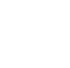

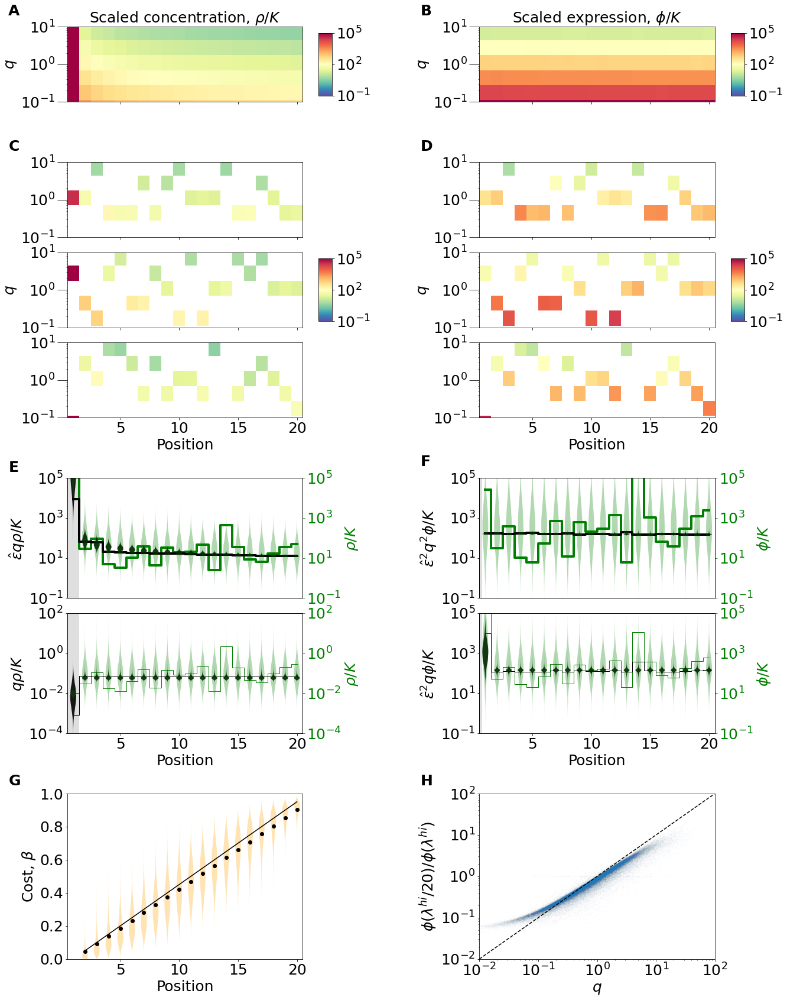

In [357]:
#### Nutrient limitation SI
#fig, axs = plt.subplots(2, 2, figsize = (10, 10))
Nenzymes = 20
font = {'size'   : 25}
plt.rc('font', **font)
fig, axs = plt.subplots(9, 4, figsize = (1, 1))
for ax in axs.flatten():
    ax.axis("off")

fig = plt.figure(figsize = (50, 29))
gs = gridspec.GridSpec(21, 28)
gs.update(wspace=0, hspace=0.5)

axs[0, 0] = plt.subplot(gs[0:2, 0:4])
axs[0, 1] = plt.subplot(gs[0:2, 7:11])

axs[1, 0] = plt.subplot(gs[3:5, 0:4])
axs[1, 1] = plt.subplot(gs[3:5, 7:11])
axs[2, 0] = plt.subplot(gs[5:7, 0:4])
axs[2, 1] = plt.subplot(gs[5:7, 7:11])
axs[3, 0] = plt.subplot(gs[7:9, 0:4])
axs[3, 1] = plt.subplot(gs[7:9, 7:11])

axs[0, 2] = plt.subplot(gs[17:23, 0:4])
axs[3, 2] = plt.subplot(gs[17:23, 7:11])

axs[1, 2] = plt.subplot(gs[10:13, 0:4])
axs[2, 2] = plt.subplot(gs[13:16, 0:4])
axs[1, 3] = plt.subplot(gs[10:13, 7:11])
axs[2, 3] = plt.subplot(gs[13:16, 7:11])

filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

epsilons = np.sum(np.sqrt((fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]).T/np.sum(1/fullensemble[:, 0, 0, :], 1)), 0)
epsilonshat = epsilons/np.exp(np.mean(np.log(epsilons)))

print(np.shape(fullensemble))

KMmean = np.exp(np.mean(np.log(fullensemble[:, 0, 1, :])))

heatmap = axs[0, 0].pcolormesh(x5, y5, z5, cmap = cm, vmin = -1, vmax = 5)
heatmap2 = axs[0, 1].pcolormesh(x6, y6, z6, cmap = cm, vmin = -1, vmax = 5)


loc = [2, 1, 0]
for ind in range(3):
    filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

    fullensemble = np.load(data_folder+filename)
    parameters = np.load(data_folder+"physiologicalParameterset.npy")
    print(np.shape(parameters))
    print(np.shape(fullensemble))

    parameterensemble = np.ones(np.shape(fullensemble))
    parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
    parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

    fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)
    fullensemble = fullensemble[loc[ind]][None, :, :, :]
    print(np.shape(fullensemble))

    efficiencybins = np.logspace(-1.4, 1.4, 8)#np.logspace(-1, 1, 6)

    ilocs = []
    ensemble = []

    for j in range(np.shape(fullensemble)[0]):
        maxgr = fullensemble[j, 0, 5, 0]
        halfgrs = (fullensemble[j, :, 5, 0].T-maxgr/2.1).T
        halfgrs[halfgrs<=0] = np.max(halfgrs)
        tenthgrs = (fullensemble[j, :, 5, 0].T-maxgr/20.1).T
        tenthgrs[tenthgrs<=0] = np.max(tenthgrs)

        iloc = np.where(halfgrs == np.nanmin(halfgrs))
        iloc10 = np.where(tenthgrs == np.nanmin(tenthgrs))
        ilocs.append(iloc[0][0])
        ensemble.append(np.array([fullensemble[j, 0], fullensemble[j, iloc[0][0]], fullensemble[j, iloc10[0][0]]]))
        #print(np.shape(np.array([ensemble[j, 0], ensemble[j, iloc]])))

    ilocs = np.array(ilocs)
    ensemble = np.array(ensemble)[:, :, :, None, :]

    #print(np.shape(smallensemble))
    #efficiencies = np.sqrt(fullensemble[:, 0, 0, :].T*fullensemble[:, 0, 1, :].T/fullensemble[:, 0, 5, 0]).T/np.sqrt(KMmean*Nenzymes)
    efficiencies = (np.sum(fullensemble[:, 0, 0, :]**(-1), 1)/np.sum(np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]), 1)*np.sqrt(fullensemble[:, 0, 1, :]*fullensemble[:, 0, 0, :]).T).T
    efficiencies = efficiencies[:, None, :]
    print(np.shape(epsilonshat))
    print(np.shape(ensemble))
    print(np.shape(efficiencies))

    branch = 0
    colormeshrho = np.zeros((Nenzymes, np.shape(efficiencybins)[0]-1))
    colormeshphi = np.zeros((Nenzymes, np.shape(efficiencybins)[0]-1))
    for i in range(np.shape(efficiencybins)[0]-1):
        mask = (efficiencies[:, branch, :]>efficiencybins[i])*(efficiencies[:, branch, :]<=efficiencybins[i+1])
        fullmask = mask[:, None, None, :]*np.ones((np.shape(ensemble)[1], np.shape(ensemble)[2]))[None, :, :, None]
        maskeddata = np.where(fullmask, ensemble[:, :, :, branch, :], np.nan)
        logsaturation = np.log10(maskeddata[:, 0, 3, :]/maskeddata[:, 0, 1, :])
        logexpression = np.log10(maskeddata[:, 0, 4, :]/maskeddata[:, 0, 1, :])
        colormeshrho[:, i] = np.nanmean(logsaturation, 0)
        colormeshphi[:, i] = np.nanmean(logexpression, 0)

    heatmap = axs[ind+1, 0].pcolormesh(np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins[1:]*efficiencybins[:-1]), colormeshrho.T, cmap = cm, vmin = -1, vmax = 5)
    heatmap2 = axs[ind+1, 1].pcolormesh(np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins[1:]*efficiencybins[:-1]), colormeshphi.T, cmap = cm, vmin = -1, vmax = 5)

axs[0, 0].set_ylabel(r"$q$")
axs[2, 0].set_ylabel(r"$q$")
axs[0, 1].set_ylabel(r"$q$")
axs[2, 1].set_ylabel(r"$q$")

for loc in [(0, 4), (5, 4), (0, 11), (5, 11)]:
    axcb = plt.subplot(gs[loc[0]:loc[0]+2, loc[1]])
    divider = make_axes_locatable(axcb)
    cax = divider.append_axes("top", size="-10%").axis('off')
    cax = divider.append_axes("bottom", size="-10%").axis('off')
    cax = divider.append_axes("left", size="100%", pad=0.05).axis('off')
    cax = divider.append_axes("right", size="200%", pad=0.05).axis('off')
    cb = fig.colorbar(heatmap, cax=axcb)#, label = r"$\rho/K$")
    axcb.set_yticks([-1, 2, 5])
    axcb.set_yticklabels([r"$10^{-1}$", r"$10^{2}$", r"$10^{5}$"])

axs[0, 0].set_title(r'Scaled concentration, $\rho/K$')
axs[0, 1].set_title(r'Scaled expression, $\phi/K$')

axs[0, 0].set_xticklabels([])
axs[0, 1].set_xticklabels([])
axs[1, 0].set_xticklabels([])
axs[1, 1].set_xticklabels([])
axs[2, 0].set_xticklabels([])
axs[2, 1].set_xticklabels([])
axs[3, 0].set_xlabel("Position")
axs[3, 1].set_xlabel("Position")

for ax in [axs[0, 0], axs[1, 0], axs[2, 0], axs[3, 0], axs[0, 1], axs[1, 1], axs[2, 1], axs[3, 1]]:
    ax.set_yscale("log")
    ax.set_ylim(1e-1, 1e1)
    
    ax.yaxis.set_tick_params(which='major', length=17)
    #ax.annotate('', xy=(-0.02, -.06), xycoords='axes fraction', xytext=(-0.02, .48), arrowprops=dict(arrowstyle="->", color='k'))
    #ax.annotate('', xy=(-0.02, 1.06), xycoords='axes fraction', xytext=(-0.02, .51), arrowprops=dict(arrowstyle="->", color='k'))
    #ax.text(-1.3, 2.5, "H")
    #ax.text(-1.2, 1/4, "L")
    

shift = 0
linewidths = [4, 1]
colors = np.array([["k", "k"], ["k", "k"]])#np.array([["chocolate", "chocolate"], ["orange", "orange"]])
#colors = np.array([["k", "chocolate"], ["dimgrey", "orange"]])
colorsPhi = np.array([["k", "k"], ["k", "k"]])#np.array([["darkblue", "darkblue"], ["cyan", "cyan"]])
#colorsPhi = np.array([["k", "darkblue"], ["dimgrey", "cyan"]])
meancolors = ["k", "dimgrey"]
effs = ["L", "H"]
effcolors = ["b", "orange"]

#efficiencies = efficiencies/np.sqrt(KMmean*Nenzymes)

i = 0
for gr in range(2):
    meanN = np.nanmean(np.log10(ensemble[:, :, 4, 0, :]/ensemble[:, :, 1, 0, :]))
    stdN = np.nanstd(np.log10(ensemble[:, :, 4, 0, :]/ensemble[:, :, 1, 0, :]))
    
    efficiencybins = np.logspace(-5, 5, 3)
    meanNs = []
    stdNs = []
    meanNs2 = []
    stdNs2 = []
    piefractions = []
    
    maskeddata = ensemble[:, :, :, branch, :]
    logsaturation = np.log10(maskeddata[:, gr*2, 3, :]/maskeddata[:, 0, 1, :])
    logexpression = np.log10(maskeddata[:, gr*2, 4, :]/maskeddata[:, 0, 1, :])
    meanNs.append(10**np.nanmean(logsaturation, 0))
    stdNs.append(10**np.nanstd(logsaturation, 0))
    meanNs2.append(10**(np.nanmean(logexpression, 0)))
    stdNs2.append(10**(np.nanstd(logexpression, 0)))
    
    index = 0
    
    axs[1+gr, 2].step(np.arange(20)[::-1]+1+shift, epsilonshat[index]**(1-gr)*(meanNs[-1]), "g", linewidth = linewidths[gr], where = "mid")
    axs[1+gr, 3].step(np.arange(20)[::-1]+1+shift, epsilonshat[index]**2*(meanNs2[-1]), "g", linewidth = linewidths[gr], where = "mid")
    
    #axs[3, 0].step(np.arange(20)[::-1]+1+shift, ensemble[0, gr*2, 3, 0, :], "g", linewidth = linewidths[gr], where = "mid")
    #axs[3, 1].step(np.arange(20)[::-1]+1+shift, ensemble[0, gr*2, 4, 0, :], "g", linewidth = linewidths[gr], where = "mid")
    
    
    if gr == 0:
        axs[1, 2].step(np.arange(20)[::-1]+1+shift, epsilonshat[index]*efficiencies[index, 0, :]*(meanNs[-1]), colors[i][gr], linewidth = linewidths[gr], where = "mid")
        axs[1, 3].step(np.arange(20)[::-1]+1+shift, epsilonshat[index]**2*efficiencies[index, 0, :]**2*(meanNs2[-1]), colorsPhi[i][gr], linewidth = linewidths[gr], where = "mid")

    if gr == 1:
        axs[2, 2].step(np.arange(20)[::-1]+1+shift, efficiencies[index, 0, :]*(meanNs[-1]), colors[i][gr], linewidth = linewidths[gr], where = "mid")
        axs[2, 3].step(np.arange(20)[::-1]+1+shift, epsilonshat[index]**2*efficiencies[index, 0, :]*(meanNs2[-1]), colorsPhi[i][gr], linewidth = linewidths[gr], where = "mid")

    colorQ = (np.log10(efficiencies[0, 0, :])-np.min(np.log10(efficiencies[0, 0, :])))/np.max(np.log10(efficiencies[0, 0, :])-np.min(np.log10(efficiencies[0, 0, :])))

        
for ax in axs.flatten()[6:]:
    ax.set_yscale("log")
    

filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

print(np.shape(fullensemble))

shift = 0

efficiencybins = np.logspace(-1.4, 1.4, 8)

ilocs = []
ensemble = []

for j in range(np.shape(fullensemble)[0]):
    maxgr = fullensemble[j, 0, 5, 0]
    halfgrs = (fullensemble[j, :, 5, 0].T-maxgr/2.1).T
    halfgrs[halfgrs<=0] = np.max(halfgrs)
    tenthgrs = (fullensemble[j, :, 5, 0].T-maxgr/20.1).T
    tenthgrs[tenthgrs<=0] = np.max(tenthgrs)
    
    iloc = np.where(halfgrs == np.nanmin(halfgrs))
    iloc10 = np.where(tenthgrs == np.nanmin(tenthgrs))
    ilocs.append(iloc[0][0])
    ensemble.append(np.array([fullensemble[j, 0], fullensemble[j, iloc[0][0]], fullensemble[j, iloc10[0][0]]]))
    #print(np.shape(np.array([ensemble[j, 0], ensemble[j, iloc]])))

ilocs = np.array(ilocs)
ensemble = np.array(ensemble)[:, :, :, None, :]

#print(np.shape(smallensemble))
#efficiencies = np.sqrt(fullensemble[:, 0, 0, :].T*fullensemble[:, 0, 1, :].T/fullensemble[:, 0, 5, 0]).T/np.sqrt(KMmean*Nenzymes)
efficiencies = (np.sum(fullensemble[:, 0, 0, :]**(-1), 1)/np.sum(np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]), 1)*np.sqrt(fullensemble[:, 0, 1, :]*fullensemble[:, 0, 0, :]).T).T
efficiencies = efficiencies[:, None, :]
epsilons = np.sum(np.sqrt((fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]).T/np.sum(1/fullensemble[:, 0, 0, :], 1)), 0)
epsilonshat = epsilons/np.exp(np.mean(np.log(epsilons)))
print(np.shape(epsilonshat))
print(np.shape(ensemble))
print(np.shape(efficiencies))

ydata = (epsilonshat*(ensemble[:, 0, 3, 0, :]/ensemble[:, 0, 1, 0, :]*efficiencies[:, 0, :]).T).T
axs00 = axs[1, 2].twinx()
axs[1, 2].set_yscale("log")
axs[1, 2].set_ylim(1e-1, 1e5)
#####axs[1, 2].step(np.arange(20)+1, 1/np.sqrt(np.exp(np.mean(np.log(ensemble[:, 0, 1, 0, :]))))/np.sqrt(np.arange(20)), "k-", where = "mid")
axs00.set_ylim(-1, 5)
axs00.set_yticks([])
parts = axs00.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_alpha(0.9)
    pc.set_facecolor('k')
vartheo = np.var(np.log(ydata[:, :-1])+np.log(np.sqrt([np.arange(20)[::-1]]*np.shape(ydata)[0])[:,:-1]))###here)

axs00_2 = axs[1, 2].twinx()
axs00_2.set_yscale("log")
axs00_2.set_ylabel(r"$\rho/K$", color = "g")
axs00_2.tick_params(axis='y', colors='g')
axs00_2.set_ylim(1e-1, 1e5)
ydata = ((ensemble[:, 0, 3, 0, :]/ensemble[:, 0, 1, 0, :]).T).T
parts = axs00.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_facecolor("g")
varbefore = np.var(np.log(ensemble[:, 0, 3, 0, :-1]))
#varbefore = np.var(np.log(ydata[:, :-1]))
print("rho, rich", 1-vartheo/varbefore, varbefore/vartheo)

axs[1, 2].add_patch(plt.Polygon([[0.5, 1e-1], [0.5, 1e5], [1.5, 1e5], [1.5, 1e-1]],facecolor='silver', clip_on=False, linewidth = 0, alpha = 0.5))
axs[1, 2].set_ylabel(r"$\hat\epsilon q\rho/K$")
#axs[1, 2].legend(title = r"$\lambda = \lambda^{hi}$")
axs[1, 2].set_xlim(0.5, 20.5)
#axs00.text(2, 3.5, r"$R^2$ before theory: %.3f"%(np.sum((np.log10(ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])-np.mean(np.log10(ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))
#axs00.text(2, 3, r"$R^2$ after theory: %.3f"%(np.sum((np.log10(ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1]*efficiencies[:, 0, :-1])-np.log10(1/np.sqrt(np.exp(np.mean(np.log(ensemble[:, 0, 1, 0, :-1]))))/np.sqrt(np.arange(19)+1)))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))
axs[1, 2].set_xticks([])

ydata = (epsilonshat**2*(ensemble[:, 0, 4, 0, :]/ensemble[:, 0, 1, 0, :]*efficiencies[:, 0, :]**2).T).T
axs01 = axs[1, 3].twinx()
axs[1, 3].set_yscale("log")
axs[1, 3].set_ylim(1e-1, 1e5)
axs01.set_ylim(-1, 5)
axs01.set_yticks([])
parts = axs01.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_alpha(0.9)
    pc.set_facecolor('k')
vartheo = np.var(np.log(ydata[:, :-1]))

axs01_2 = axs[1, 3].twinx()
axs01_2.set_yscale("log")
axs01_2.set_ylabel(r"$\phi/K$", color = "g")
axs01_2.tick_params(axis='y', colors='g')
axs01_2.set_ylim(1e-1, 1e5)
ydata = ((ensemble[:, 0, 4, 0, :]/ensemble[:, 0, 1, 0, :]).T).T
parts = axs01.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_facecolor("g")
varbefore = np.var(np.log(ensemble[:, 0, 4, 0, :-1]))
#varbefore = np.var(np.log(ydata[:, :-1]))
print("phi, rich", 1-vartheo/varbefore, varbefore/vartheo)


axs[1, 3].set_ylabel(r"$\hat\epsilon^2 q^2\phi/K$")
#axs[1, 3].legend(title = r"$\lambda = \lambda^{hi}$")
axs[1, 3].add_patch(plt.Polygon([[0.5, 1e-1], [0.5, 1e5], [.75, 1e5], [.75, 1e-1]],facecolor='silver', clip_on=False, linewidth = 0, alpha = 0.5))
axs[1, 3].set_xlim(0.5, 20.5)
#axs01.text(2, 3.66, r"$R^2$ before theory: %.3f"%(np.sum((np.log10(ensemble[:, 0, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1])-np.mean(np.log10(ensemble[:, 0, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1])))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))
#axs01.text(2, 3.33, r"$R^2$ after theory: %.3f"%(np.sum((np.log10(ensemble[:, 0, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1]*efficiencies[:, 0, :-1]**2)-np.mean(np.log10(ensemble[:, 0, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1]*efficiencies[:, 0, :-1]**2)))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))
axs[1, 3].set_xticks([])



#ydata = (epsilonshat*(ensemble[:, 2, 3, 0, :]/ensemble[:, 0, 1, 0, :]*efficiencies[:, 0, :]).T).T
ydata = ((ensemble[:, 2, 3, 0, :]/ensemble[:, 0, 1, 0, :]*efficiencies[:, 0, :]).T).T
axs10 = axs[2, 2].twinx()
axs[2, 2].set_yscale("log")
axs[2, 2].set_ylim(1e-4, 1e2)
axs[2, 2].set_xlabel("Position")
axs10.set_ylim(-4, 2)
axs10.set_yticks([])
parts = axs10.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_alpha(0.9)
    pc.set_facecolor('k')
vartheo = np.var(np.log(ydata[:, :-1]))

axs10_2 = axs[2, 2].twinx()
axs10_2.set_yscale("log")
axs10_2.set_ylabel(r"$\rho/K$", color = "g")
axs10_2.tick_params(axis='y', colors='g')
axs10_2.set_ylim(1e-4, 1e2)
#ydata = (epsilonshat*(ensemble[:, 2, 3, 0, :]/ensemble[:, 0, 1, 0, :]).T).T
ydata = ((ensemble[:, 2, 3, 0, :]/ensemble[:, 0, 1, 0, :]).T).T
parts = axs10.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_facecolor("g")
varbefore = np.var(np.log(ensemble[:, 2, 3, 0, :-1]))
#varbefore = np.var(np.log(ydata[:, :-1]))           
print("rho, poor", 1-vartheo/varbefore, varbefore/vartheo)

axs[2, 2].add_patch(plt.Polygon([[0.5, 1e-4], [0.5, 1e2], [1.5, 1e2], [1.5, 1e-4]],facecolor='silver', clip_on=False, linewidth = 0, alpha = 0.5))
axs[2, 2].set_ylabel(r"$q\rho/K$")
#axs[2, 2].legend(title = r"$\lambda = \lambda^{hi}/10$")
axs[2, 2].set_xlim(0.5, 20.5)
#axs10.text(2, 3.5, r"$R^2$ before theory: %.3f"%(np.sum((np.log10(ensemble[:, 2, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])-np.mean(np.log10(ensemble[:, 2, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))
#axs10.text(2, 3, r"$R^2$ after theory: %.3f"%(np.sum((np.log10(ensemble[:, 2, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1]*efficiencies[:, 0, :-1])-np.mean(np.log10(ensemble[:, 2, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1]*efficiencies[:, 0, :-1])))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))

ydata = (epsilonshat**2*(ensemble[:, 2, 4, 0, :]/ensemble[:, 0, 1, 0, :]*efficiencies[:, 0, :]).T).T
axs11 = axs[2, 3].twinx()
axs[2, 3].set_yscale("log")
axs[2, 3].set_ylim(1e-1, 1e5)
axs11.set_ylim(-1, 5)
axs11.set_yticks([])
parts = axs11.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_alpha(0.9)
    pc.set_facecolor('k')
vartheo = np.var(np.log(ydata[:, :-1]))
    
axs11_2 = axs[2, 3].twinx()
axs11_2.set_yscale("log")
axs11_2.set_ylabel(r"$\phi/K$", color = "g")
axs11_2.tick_params(axis='y', colors='g')
axs11_2.set_ylim(1e-1, 1e5)
ydata = ((ensemble[:, 2, 4, 0, :]/ensemble[:, 0, 1, 0, :]).T).T
parts = axs11.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_facecolor("g")
varbefore = np.var(np.log(ensemble[:, 2, 4, 0, :-1]))
#varbefore = np.var(np.log(ydata[:, :-1]))
print("phi, poor", 1-vartheo/varbefore, varbefore/vartheo)
    

axs[2, 3].set_ylabel(r"$\hat\epsilon^2 q\phi/K$")
#axs[2, 3].legend(title = r"$\lambda = \lambda^{hi}/10$")
axs[2, 3].add_patch(plt.Polygon([[0.5, 1e-1], [0.5, 1e5], [.75, 1e5], [.75, 1e-1]],facecolor='silver', clip_on=False, linewidth = 0, alpha = 0.5))
axs[2, 3].set_xlim(0.5, 20.5)
axs[2, 3].set_xlabel("Position")
#axs11.text(2, 3.66, r"$R^2$ before theory: %.3f"%(np.sum((np.log10(ensemble[:, 2, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1])-np.mean(np.log10(ensemble[:, 2, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1])))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))
#axs11.text(2, 3.33, r"$R^2$ after theory: %.3f"%(np.sum((np.log10(ensemble[:, 2, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1]*efficiencies[:, 0, :-1])-np.mean(np.log10(ensemble[:, 2, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1]*efficiencies[:, 0, :-1])))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))

print(np.shape(efficiencies[:, 0, :]))
print(np.shape(ensemble[:, -1, 4, 0, :]/ensemble[:, 0, 4, 0, :]))

efficiencieshat = np.copy(efficiencies)
print(np.shape(ensemble))
print(np.shape(efficiencieshat))
axs[3, 2].plot(np.logspace(-2, 2, 100), np.logspace(-2, 2, 100), "k--")
axs[3, 2].scatter(efficiencieshat[:, 0, :-1].flatten(), (ensemble[:, -1, 4, 0, :-1]/ensemble[:, 0, 4, 0, :-1]).flatten(), s = 1, alpha = 0.01)
axs[3, 2].set_xscale("log")
axs[3, 2].set_yscale("log")
axs[3, 2].set_xlim(1e-2, 1e2)
axs[3, 2].set_ylim(1e-2, 1e2)
axs[3, 2].set_xlabel(r"$q$")
axs[3, 2].set_ylabel(r"$\phi(\lambda^{hi}/20)/\phi(\lambda^{hi})$")


betas = ensemble[:, 0, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1]/(ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])/(1+ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])
print(np.shape(betas))
parts = axs[0, 2].violinplot(betas, np.arange(19)[::-1]+2, showextrema=False)
for pc in parts['bodies']:
    pc.set_facecolor("orange")
axs[0, 2].plot(np.arange(19)[::-1]+2, (np.arange(19)[::-1]+2-1)/20, "k-")
axs[0, 2].plot(np.arange(19)[::-1]+2, np.mean(betas,0), "ko")
axs[0, 2].set_xlabel("Position")
axs[0, 2].set_ylabel(r"Cost, $\beta$")
axs[0, 2].set_yscale("linear")
axs[0, 2].set_xlim(0.5, 20.5)
axs[0, 2].set_ylim(0, 1)


for n, ax in enumerate([axs[0, 0], axs[0, 1], axs[1, 0], axs[1, 1], axs[1, 2], axs[1, 3], axs[0, 2], axs[3, 2]]):  
    ax.text(-0.25, 1.15-0.1*(n==4)-0.05*(n==5)-0.1*(n>5), string.ascii_uppercase[n], transform=ax.transAxes, weight='bold')

    
#plt.savefig("SI_rescaling.pdf", bbox_inches="tight", format = 'pdf')